# **Dataset**

Dataset *Electric Vehicle Title and Registration Activity* diambil dari sumber berikut. https://catalog.data.gov/dataset/electric-vehicle-title-and-registration-activity



# ***Import* Library/Packages, Data, *and Mount* Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas import read_csv
from pandas import datetime
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
!pip install pmdarima
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, mean_absolute_percentage_error, r2_score

<ipython-input-1-6d4a4b7227a0>:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.7 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv('https://data.wa.gov/api/views/rpr4-cgyd/rows.csv')

In [ ]:
df.head()

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,...,Meets 2019 HB 2042 Sale Price/Value Requirement,2019 HB 2042: Battery Range Requirement,2019 HB 2042: Purchase Date Requirement,2019 HB 2042: Sale Price/Value Requirement,Electric Vehicle Fee Paid,Transportation Electrification Fee Paid,Hybrid Vehicle Electrification Fee Paid,2020 Census Tract,Legislative District,Electric Utility
0,Battery Electric Vehicle (BEV),1N4AZ0CPXF,121397454,2015,NISSAN,Leaf,Passenger,84,0,Odometer reading is not collected at time of r...,...,False,NaN,"Non-sale, registration transaction","Non-sale, registration transaction",Yes,Yes,No,5.303300e+10,46.0,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA)
1,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,...,False,NaN,"Non-sale, registration transaction","Non-sale, registration transaction",Yes,Yes,No,5.303302e+10,41.0,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)
2,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,...,False,NaN,"Non-sale, registration transaction","Non-sale, registration transaction",Yes,Yes,No,5.303302e+10,41.0,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)
3,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,...,False,NaN,"Non-sale, registration transaction","Non-sale, registration transaction",Yes,Yes,No,5.303302e+10,41.0,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)
4,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,...,False,NaN,"Non-sale, registration transaction","Non-sale, registration transaction",Yes,Yes,No,5.303302e+10,41.0,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 781713 entries, 0 to 781712
Data columns (total 35 columns):
 #   Column                                                          Non-Null Count   Dtype  
---  ------                                                          --------------   -----  
 0   Clean Alternative Fuel Vehicle Type                             781713 non-null  object 
 1   VIN (1-10)                                                      781713 non-null  object 
 2   DOL Vehicle ID                                                  781713 non-null  int64  
 3   Model Year                                                      781713 non-null  int64  
 4   Make                                                            781713 non-null  object 
 5   Model                                                           781713 non-null  object 
 6   Vehicle Primary Use                                             781713 non-null  object 
 7   Electric Range                        

# ***Preprocessing***

## ***Drop* Kolom**

Kami akan menghapus kolom-kolom yang tidak akan kami gunakan dalam proses analisis data. Kolom-kolom tersebut yaitu `2015 HB 2778 Exemption Eligibility`, `2019 HB 2042 Clean Alternative Fuel Vehicle (CAFV) Eligibility` `Meets 2019 HB 2042 Electric Range Requirement`, `Meets 2019 HB 2042 Sale Date Requirement`, `Meets 2019 HB 2042 Sale Price/Value Requirement`, `2019 HB 2042: Battery Range Requirement`, `2019 HB 2042: Purchase Date Requirement`, `2019 HB 2042: Sale Price/Value Requirement`, `Electric Vehicle Fee Paid`, `Transportation Electrification Fee Paid`, `Hybrid Vehicle Electrification Fee Paid`, `2020 Census Tract`, `Legislative District`, dan  `Electric Utility`.


In [ ]:
drop_column = ['2015 HB 2778 Exemption Eligibility', '2019 HB 2042 Clean Alternative Fuel Vehicle (CAFV) Eligibility',
               'Meets 2019 HB 2042 Electric Range Requirement', 'Meets 2019 HB 2042 Sale Date Requirement',
               'Meets 2019 HB 2042 Sale Price/Value Requirement', '2019 HB 2042: Battery Range Requirement',
               '2019 HB 2042: Purchase Date Requirement', '2019 HB 2042: Sale Price/Value Requirement',
               'Electric Vehicle Fee Paid', 'Transportation Electrification Fee Paid', 'Hybrid Vehicle Electrification Fee Paid',
               '2020 Census Tract', 'Legislative District', 'Electric Utility']
df.drop(drop_column, axis = 1, inplace = True)

In [ ]:
df.head()

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,...,Sale Price,Sale Date,Base MSRP,Transaction Type,DOL Transaction Date,Transaction Year,County,City,State of Residence,Postal Code
0,Battery Electric Vehicle (BEV),1N4AZ0CPXF,121397454,2015,NISSAN,Leaf,Passenger,84,0,Odometer reading is not collected at time of r...,...,0,NaN,0,Registration Renewal,September 27 2022,2022,King,SEATTLE,WA,98125.0
1,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,...,0,NaN,0,Registration Renewal,February 19 2021,2021,King,BELLEVUE,WA,98004.0
2,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,...,0,NaN,0,Registration Renewal,March 02 2020,2020,King,BELLEVUE,WA,98004.0
3,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,...,0,NaN,0,Registration Renewal,February 19 2021,2021,King,BELLEVUE,WA,98004.0
4,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,...,0,NaN,0,Registration Renewal,February 13 2023,2023,King,BELLEVUE,WA,98004.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 781713 entries, 0 to 781712
Data columns (total 21 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Clean Alternative Fuel Vehicle Type  781713 non-null  object 
 1   VIN (1-10)                           781713 non-null  object 
 2   DOL Vehicle ID                       781713 non-null  int64  
 3   Model Year                           781713 non-null  int64  
 4   Make                                 781713 non-null  object 
 5   Model                                781713 non-null  object 
 6   Vehicle Primary Use                  781713 non-null  object 
 7   Electric Range                       781713 non-null  int64  
 8   Odometer Reading                     781713 non-null  int64  
 9   Odometer Code                        781713 non-null  object 
 10  New or Used Vehicle                  781713 non-null  object 
 11  Sale Price   

### ***Drop* Kolom dengan Informasi Redundan**

In [ ]:
df[["Sale Date", "DOL Transaction Date", "Transaction Year"]]

,Sale Date,DOL Transaction Date,Transaction Year
0,NaN,September 27 2022,2022
1,NaN,February 19 2021,2021
2,NaN,March 02 2020,2020
3,NaN,February 19 2021,2021
4,NaN,February 13 2023,2023
...,...,...,...
781708,April 01 2023,April 24 2023,2023
781709,NaN,November 09 2022,2022
781710,July 18 2022,November 09 2022,2022
781711,NaN,April 03 2023,2023


In [ ]:
df['Sale Date'].isna().sum()

548300

- `Sale Date`: *the day on which the vehicle changed ownership*.
- `DOL Transaction Date`: *the day upon which a transaction was recorded into Department of Licensing's computer system*.
- `Sale Price`: *the amount that was reported to have been paid for a vehicle. A value of zero indicates that the sale price was not available*.
- `Base MSRP`: *This is the lowest Manufacturer's Suggested Retail Price (MSRP) for any version of the model in question*.

 Dari hasil di atas, terlihat bahwa kolom `Sale Date` kehilangan banyak informasi. Terdapat perbedaan antara tanggal transaksi yang tercatat dan tanggal penjualan kendaraan yang sebenarnya yaitu sekitar beberapa minggu. Dalam analisis ini, kami akan menggunakan `DOL Transaction Date` dibandingkan `Sale Date`. Kolom `Transaction Year` memberikan informasi yang sama dengan kolom `DOL Transaction Date`. Oleh karena itu, kami akan menghapus kedua kolom tersebut.

 Dalam data ini, telah terdapat kolom `Sale Price` (harga jual) kendaraan pada saat transaksi sehingga kolom `Base MSRP` tidak relevan.  Jadi, kami akan menghapus kolom tersebut.

In [ ]:
drop_column2 = ['Sale Date', 'Transaction Year', 'Base MSRP']
df.drop(drop_column2, axis = 1, inplace = True)

In [ ]:
df.head()

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,DOL Transaction Date,County,City,State of Residence,Postal Code
0,Battery Electric Vehicle (BEV),1N4AZ0CPXF,121397454,2015,NISSAN,Leaf,Passenger,84,0,Odometer reading is not collected at time of r...,Used,0,Registration Renewal,September 27 2022,King,SEATTLE,WA,98125.0
1,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,Used,0,Registration Renewal,February 19 2021,King,BELLEVUE,WA,98004.0
2,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,Used,0,Registration Renewal,March 02 2020,King,BELLEVUE,WA,98004.0
3,Battery Electric Vehicle (BEV),5YJXCAE43G,119336136,2016,TESLA,Model X,Passenger,200,0,Odometer reading is not collected at time of r...,Used,0,Registration Renewal,February 19 2021,King,BELLEVUE,WA,98004.0
4,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,0,Odometer reading is not collected at time of r...,Used,0,Registration Renewal,February 13 2023,King,BELLEVUE,WA,98004.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 781713 entries, 0 to 781712
Data columns (total 18 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Clean Alternative Fuel Vehicle Type  781713 non-null  object 
 1   VIN (1-10)                           781713 non-null  object 
 2   DOL Vehicle ID                       781713 non-null  int64  
 3   Model Year                           781713 non-null  int64  
 4   Make                                 781713 non-null  object 
 5   Model                                781713 non-null  object 
 6   Vehicle Primary Use                  781713 non-null  object 
 7   Electric Range                       781713 non-null  int64  
 8   Odometer Reading                     781713 non-null  int64  
 9   Odometer Code                        781713 non-null  object 
 10  New or Used Vehicle                  781713 non-null  object 
 11  Sale Price   

## ***Filter* Data**

- `Transaction Type`: *the category of activity that was performed*.

> *___A car registration___ is proof that an owner has paid the necessary fees to legally drive the vehicle on public roads, and that the vehicle has been recorded by the state*.

> *___A car title___ establishes the owner of a vehicle, and includes the car’s make, model, year and details about its history*.

> *Some dealerships offer temporary registration (usually 30 days) and a temporary paper tag when you purchase a new car*.

> *Depending on your state, you'll have to renew your car registration every 1-2 years*.

https://www.policygenius.com/auto-insurance/whats-the-difference-between-title-and-registration/

Kami tidak akan menggunakan informasi *registration* untuk analisis ini. Kami akan berfokus pada *title transaction* untuk menghitung jumlah kendaraan listrik yang ada di jalan. Oleh karena itu, kami akan mem-*filter* informasi tersebut dari dataset ini.

In [ ]:
df["Transaction Type"].unique()

array(['Registration Renewal', 'Original Registration', 'Original Title',
       'Registration at time of Transfer', 'Transfer Title'], dtype=object)

In [ ]:
df = df[(df['Transaction Type']=='Original Title') | (df['Transaction Type']=='Transfer Title')]

## ***Preprocessing* Informasi Waktu**

In [ ]:
# Mengubah 'DOL Transaction Date' ke format datetime
df['DOL Transaction Date'] = pd.to_datetime(df['DOL Transaction Date'])

### **Membuat Kolom `m/y` (*Month/Year*)**
Kami akan menggunakan informasi dari kolom `m/y` untuk membersihkan duplikat data.

In [ ]:
df['m/y'] = df['DOL Transaction Date'].dt.strftime("%m-%Y")

### **Mengubah Index Dataframe**

In [ ]:
df.set_index('DOL Transaction Date', inplace = True)
df.head()

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2019-02-21,Battery Electric Vehicle (BEV),5YJ3E1EB6K,474790578,2019,TESLA,Model 3,Passenger,220,50,Actual Mileage,New,62200,Original Title,King,BELLEVUE,WA,98004.0,02-2019
2021-06-18,Battery Electric Vehicle (BEV),5YJYGDEE0M,157748132,2021,TESLA,Model Y,Passenger,0,15,Actual Mileage,New,52290,Original Title,King,SEATTLE,WA,98125.0,06-2021
2019-08-16,Battery Electric Vehicle (BEV),WVWPP7AUXG,339698565,2016,VOLKSWAGEN,e-Golf,Passenger,83,17534,Actual Mileage,Used,1600,Original Title,King,SEATTLE,WA,98178.0,08-2019
2012-10-12,Plug-in Hybrid Electric Vehicle (PHEV),1G1RB6E48D,228226729,2013,CHEVROLET,Volt,Passenger,38,37,Actual Mileage,New,0,Original Title,King,SEATTLE,WA,98115.0,10-2012
2022-11-15,Battery Electric Vehicle (BEV),7SAYGDEE2N,220688121,2022,TESLA,Model Y,Passenger,0,15,Actual Mileage,New,66440,Original Title,King,KIRKLAND,WA,98034.0,11-2022


## **Data Duplikat**

In [ ]:
df[df.duplicated()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,


Tidak ada data duplikat yang persis sama.

In [ ]:
df[df.duplicated(subset = ['m/y', 'DOL Vehicle ID', 'County'], keep = False)].sort_values('DOL Vehicle ID')

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2021-12-29,Plug-in Hybrid Electric Vehicle (PHEV),1G1RF6E42D,2661907,2013,CHEVROLET,Volt,Passenger,38,112191,Actual Mileage,Used,9995,Transfer Title,Spokane,SPOKANE,WA,99208.0,12-2021
2021-12-08,Plug-in Hybrid Electric Vehicle (PHEV),1G1RF6E42D,2661907,2013,CHEVROLET,Volt,Passenger,38,111736,Actual Mileage,Used,0,Transfer Title,Spokane,AIRWAY HEIGHTS,WA,99001.0,12-2021
2019-12-05,Battery Electric Vehicle (BEV),5YJ3E1EA0K,2679813,2019,TESLA,Model 3,Passenger,220,0,No Odometer Code on File,New,43200,Original Title,Snohomish,EVERETT,WA,98204.0,12-2019
2019-12-21,Battery Electric Vehicle (BEV),5YJ3E1EA0K,2679813,2019,TESLA,Model 3,Passenger,220,246,Actual Mileage,Used,43200,Transfer Title,Snohomish,EVERETT,WA,98204.0,12-2019
2021-04-08,Battery Electric Vehicle (BEV),5YJ3E1EA6L,2722485,2020,TESLA,Model 3,Passenger,266,10943,Actual Mileage,Used,38300,Transfer Title,Yakima,SUNNYSIDE,WA,98944.0,04-2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11,Battery Electric Vehicle (BEV),1G1FZ6S00K,474952670,2019,CHEVROLET,Bolt EV,Passenger,238,4400,Actual Mileage,Used,0,Transfer Title,King,SEATTLE,WA,98144.0,03-2021
2021-10-04,Plug-in Hybrid Electric Vehicle (PHEV),LYVBR0DM5J,476000556,2018,VOLVO,XC60,Passenger,17,22201,Actual Mileage,Used,33410,Transfer Title,King,BOTHELL,WA,98011.0,10-2021
2021-10-05,Plug-in Hybrid Electric Vehicle (PHEV),LYVBR0DM5J,476000556,2018,VOLVO,XC60,Passenger,17,22224,Actual Mileage,Used,45000,Transfer Title,King,KIRKLAND,WA,98033.0,10-2021


- `DOL Vehicle ID`: *a unique identification number for each vehicle present in Transactions dataset. Transactions done on the same vehicle will have the same DOL Vehicle ID*.

Dari hasil tersebut terlihat bahwa dataset memiliki 138 baris data duplikat. Jika tidak terdapat informasi informasi kota (*city*) dan kode pos (*postal code*), datanya akan persis sama. Kami akan menyimpan data yang terakhir dari setiap baris dari data duplikat.

In [ ]:
df.drop_duplicates(subset = ['m/y', 'DOL Vehicle ID', 'County'], keep = 'last', inplace = True)

In [ ]:
df[df.duplicated(subset = ['m/y', 'DOL Vehicle ID'], keep = False)].sort_values('DOL Vehicle ID')

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2020-01-31,Plug-in Hybrid Electric Vehicle (PHEV),5UXKT0C56H,4892387,2017,BMW,X5,Passenger,14,38046,Actual Mileage,Used,37880,Transfer Title,Snohomish,SNOHOMISH,WA,98290.0,01-2020
2020-01-06,Plug-in Hybrid Electric Vehicle (PHEV),5UXKT0C56H,4892387,2017,BMW,X5,Passenger,14,37739,Actual Mileage,Used,37980,Original Title,Pierce,AUBURN,WA,98092.0,01-2020
2019-10-15,Battery Electric Vehicle (BEV),KNDJP3AE2G,100489049,2016,KIA,Soul,Passenger,93,24200,Actual Mileage,Used,9950,Transfer Title,Skagit,ANACORTES,WA,98221.0,10-2019
2019-10-15,Battery Electric Vehicle (BEV),KNDJP3AE2G,100489049,2016,KIA,Soul,Passenger,93,24148,Actual Mileage,Used,9499,Transfer Title,Whatcom,BELLINGHAM,WA,98226.0,10-2019
2021-04-15,Plug-in Hybrid Electric Vehicle (PHEV),WAUUPBFF7H,103084264,2017,AUDI,A3,Passenger,16,31117,Actual Mileage,Used,19500,Transfer Title,Pierce,TACOMA,WA,98466.0,04-2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-30,Battery Electric Vehicle (BEV),5YJ3E1EB8J,474750307,2018,TESLA,Model 3,Passenger,215,86900,Actual Mileage,Used,29999,Transfer Title,Whatcom,BLAINE,WA,98230.0,05-2023
2023-03-16,Battery Electric Vehicle (BEV),SADHD2S14K,475069724,2019,JAGUAR,I-PACE,Passenger,234,24767,Actual Mileage,Used,0,Transfer Title,King,BELLEVUE,WA,98005.0,03-2023
2023-03-24,Battery Electric Vehicle (BEV),SADHD2S14K,475069724,2019,JAGUAR,I-PACE,Passenger,234,24853,Actual Mileage,Used,43500,Transfer Title,Snohomish,SNOHOMISH,WA,98290.0,03-2023


Kami menemukan terdapat duplikat transaksi yang muncul untuk mobil yang sama dengan informasi yang persis sama kecuali untuk informasi *county*, *city*, dan kode pos (*postal code*). Diasumsikan bahwa transaksi terakhir untuk setiap duplikasi ini adalah transaksi yang akurat, dan transaksi tersebut akan disimpan.

In [ ]:
df.drop_duplicates(subset = ['m/y', 'DOL Vehicle ID'], keep = 'last', inplace = True)

In [ ]:
# Verifikasi
df[df.duplicated(subset = ['m/y', 'DOL Vehicle ID'], keep = False)].sort_values('DOL Vehicle ID')

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,


## ***Missing Values***

In [ ]:
df.isna().sum()

Clean Alternative Fuel Vehicle Type     0
VIN (1-10)                              0
DOL Vehicle ID                          0
Model Year                              0
Make                                    0
Model                                   0
Vehicle Primary Use                     0
Electric Range                          0
Odometer Reading                        0
Odometer Code                           0
New or Used Vehicle                     0
Sale Price                              0
Transaction Type                        0
County                                  9
City                                   21
State of Residence                      1
Postal Code                            13
m/y                                     0
dtype: int64

In [ ]:
df.isnull().sum()/df.shape[0]*100.00

Clean Alternative Fuel Vehicle Type    0.000000
VIN (1-10)                             0.000000
DOL Vehicle ID                         0.000000
Model Year                             0.000000
Make                                   0.000000
Model                                  0.000000
Vehicle Primary Use                    0.000000
Electric Range                         0.000000
Odometer Reading                       0.000000
Odometer Code                          0.000000
New or Used Vehicle                    0.000000
Sale Price                             0.000000
Transaction Type                       0.000000
County                                 0.004253
City                                   0.009923
State of Residence                     0.000473
Postal Code                            0.006143
m/y                                    0.000000
dtype: float64

Dari hasil tersebut, terlihat bahwa 4 kolom: `County`, `City`, `State of Residence`, dan `Postal Code` memiliki *missing value*.

In [ ]:
df[df['County'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2014-09-23,Battery Electric Vehicle (BEV),JN1AZ0CP1B,133789183,2011,NISSAN,Leaf,Passenger,73,46005,Actual Mileage,Used,0,Transfer Title,NaN,NaN,XX,NaN,09-2014
2023-04-12,Battery Electric Vehicle (BEV),1N4AZ0CP1D,112277063,2013,NISSAN,Leaf,Passenger,75,96934,Actual Mileage,Used,7950,Transfer Title,NaN,NaN,AP,NaN,04-2023
2022-11-30,Battery Electric Vehicle (BEV),7FCTGAAA3N,211400563,2022,RIVIAN,R1T,Truck,0,3796,Actual Mileage,Used,92500,Transfer Title,NaN,NaN,BC,NaN,11-2022
2018-02-28,Plug-in Hybrid Electric Vehicle (PHEV),5UXKT0C38H,111058636,2017,BMW,X5,Passenger,14,6919,Actual Mileage,Used,55000,Transfer Title,NaN,NaN,NaN,NaN,02-2018
2023-07-03,Battery Electric Vehicle (BEV),5YJYGDEFXL,115593201,2020,TESLA,Model Y,Passenger,291,18968,Actual Mileage,Used,0,Transfer Title,NaN,NaN,NY,NaN,07-2023
2023-07-05,Plug-in Hybrid Electric Vehicle (PHEV),KNDCS3LF9P,245797730,2023,KIA,Niro,Passenger,33,19,Actual Mileage,New,33706,Original Title,NaN,NaN,CO,NaN,07-2023
2023-07-31,Battery Electric Vehicle (BEV),5YJSA1E27G,232897885,2016,TESLA,Model S,Passenger,210,85406,Actual Mileage,Used,29988,Transfer Title,NaN,NaN,MT,NaN,07-2023
2023-07-13,Plug-in Hybrid Electric Vehicle (PHEV),3FA6P0PU2H,348669772,2017,FORD,Fusion,Passenger,21,19224,Actual Mileage,Used,22988,Transfer Title,NaN,NaN,CA,NaN,07-2023
2023-07-27,Battery Electric Vehicle (BEV),5YJSA1E49K,447161816,2019,TESLA,Model S,Passenger,270,121129,Actual Mileage,Used,38798,Transfer Title,NaN,NaN,MI,NaN,07-2023


Informasi *county* yang hilang akan dihapus.

In [ ]:
df.dropna(subset = ['County'], inplace = True)

In [ ]:
# Verifikasi
df[df['County'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,


Analisis kami akan difokuskan pada negara bagian (*state*) Washington. Oleh karena itu, kami tidak akan menyimpan kendaraan dengan pemilik yang tinggal di luar `WA` (Washington). Selain itu, kami akan menghapus semua *missing value* dari kolom `State of Residence`.

In [ ]:
df = df[df['State of Residence']=='WA']

In [ ]:
df[df['State of Residence'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,


In [ ]:
df[df['City'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2023-03-29,Battery Electric Vehicle (BEV),1G1FZ6S07P,235316994,2023,CHEVROLET,Bolt EUV,Passenger,0,21,Actual Mileage,New,35190,Original Title,Snohomish,NaN,WA,98256.0,03-2023
2016-12-02,Battery Electric Vehicle (BEV),5YJSA1E45G,174235330,2016,TESLA,Model S,Passenger,210,512,Actual Mileage,New,0,Original Title,Clark,NaN,WA,98607.0,12-2016
2022-10-19,Battery Electric Vehicle (BEV),50EA1GDA1N,220602070,2022,LUCID,Air,Passenger,0,200,Actual Mileage,New,180500,Original Title,Grant,NaN,WA,98853.0,10-2022
2015-10-16,Plug-in Hybrid Electric Vehicle (PHEV),WBY2Z2C58F,149693113,2015,BMW,i8,Passenger,14,0,No Odometer Code on File,New,0,Original Title,Clark,NaN,WA,98607.0,10-2015
2020-09-22,Battery Electric Vehicle (BEV),1G1FY6S05L,125903291,2020,CHEVROLET,Bolt EV,Exempt (State/County/Local/Tribal),259,4,Actual Mileage,New,30204,Original Title,Skagit,NaN,WA,98221.0,09-2020
2020-09-22,Battery Electric Vehicle (BEV),1G1FY6S00L,124526531,2020,CHEVROLET,Bolt EV,Exempt (State/County/Local/Tribal),259,4,Actual Mileage,New,30204,Original Title,Skagit,NaN,WA,98221.0,09-2020
2020-09-22,Battery Electric Vehicle (BEV),1G1FY6S0XL,124726094,2020,CHEVROLET,Bolt EV,Exempt (State/County/Local/Tribal),259,4,Actual Mileage,New,30204,Original Title,Skagit,NaN,WA,98221.0,09-2020
2020-09-22,Battery Electric Vehicle (BEV),1G1FY6S09L,124578051,2020,CHEVROLET,Bolt EV,Exempt (State/County/Local/Tribal),259,4,Actual Mileage,New,30204,Original Title,Skagit,NaN,WA,98221.0,09-2020
2022-04-12,Plug-in Hybrid Electric Vehicle (PHEV),2C4RC1S75M,144770097,2021,CHRYSLER,Pacifica,Passenger,32,10915,Actual Mileage,Used,46950,Transfer Title,Thurston,NaN,WA,98512.0,04-2022


Karena kami hanya memperhatikan kendaraan di tingkat *county*, *missing value* di kolom `City` tidak akan menjadi masalah. Namun, kami akan mengubah *missing value* tersebut dengan 'Unknown' sebagai label sementara.

In [ ]:
df['City'].fillna('Unknown', inplace = True)
# Verifikasi
df[df['City'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,


In [ ]:
df[df['Postal Code'].isna()]

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2020-01-24,Battery Electric Vehicle (BEV),5YJ3E1EB4L,6301263,2020,TESLA,Model 3,Passenger,322,50,Actual Mileage,New,57790,Original Title,Asotin,ASOTIN,WA,NaN,01-2020
2017-01-06,Battery Electric Vehicle (BEV),1N4AZ0CPXD,135986539,2013,NISSAN,Leaf,Passenger,75,49816,Actual Mileage,Used,7928,Transfer Title,King,SHORELINE,WA,NaN,01-2017
2023-07-24,Battery Electric Vehicle (BEV),1G1FY6S00K,347558116,2019,CHEVROLET,Bolt EV,Passenger,238,3316,Actual Mileage,Used,22600,Transfer Title,Klickitat,CENTERVILLE,WA,NaN,07-2023
2023-03-06,Plug-in Hybrid Electric Vehicle (PHEV),YV4H60DW7P,233912304,2023,VOLVO,XC60,Passenger,35,12,Actual Mileage,New,68845,Original Title,San Juan,ORCAS IS,WA,NaN,03-2023


Sama seperti sebelumnya, karena kami hanya berfokus pada informasi *county*, kami akan menggantikan *missing value* di kolom `Postal Code` dengan 'Unknown'.

In [ ]:
df['Postal Code'].fillna('Unknown', inplace = True)

In [ ]:
# Verifikasi
df.isna().sum()

Clean Alternative Fuel Vehicle Type    0
VIN (1-10)                             0
DOL Vehicle ID                         0
Model Year                             0
Make                                   0
Model                                  0
Vehicle Primary Use                    0
Electric Range                         0
Odometer Reading                       0
Odometer Code                          0
New or Used Vehicle                    0
Sale Price                             0
Transaction Type                       0
County                                 0
City                                   0
State of Residence                     0
Postal Code                            0
m/y                                    0
dtype: int64

## **Standarisasi Nama pada Kolom `Model`**

In [ ]:
df['Model'].unique()

array(['Model 3', 'Model Y', 'e-Golf', 'Volt', 'Leaf', 'Niro', 'Model X',
       'Roadster', 'Model S', '500', 'PS2', 'Bolt EV', 'Prius Prime',
       'Soul', 'EV6', 'Pacifica', 'Cayenne', 'C-Max', 'I-PACE', 'Taycan',
       'ID.4', 'GLC-Class', 'X5', 'i4', 'F-150', 'i3', 'Wrangler', 'A3',
       'XC60', 'IONIQ 5', 'RAV4', 'Corsair', 'XC90', 'EQS-Class Sedan',
       'X3', 'R1T', 'Optima', 'Sorento', 'Mustang Mach-E',
       'Prius Plug-in', 'RAV4 Prime', 'Fusion', 'Escape', 'Focus',
       'ARIYA', 'Clarity', 'R1S', 'Lyriq', 'ELR', 'Panamera',
       'e-tron Sportback', 'e-tron', 'iX', 'Kona Electric', '530e',
       'Countryman', '330e', 'EQS-Class SUV', 'Spark', 'Grand Cherokee',
       'Q5 e', 'Transit', 'Ioniq', 'Bolt EUV', 'S60', 'Soul EV',
       'Sportage', 'Outlander', 'e-tron GT', 'Solterra', 'Kona',
       'Hardtop', 'EQ Fortwo', 'i8', 'PRIUS', 'Santa Fe', 'EQB-Class',
       'B-Class', 'G80', 'Crosstrek', 'CT6', 'Sonata', 'Q5',
       'Fortwo Electric Drive', 'NX', 'Ioniq 6

In [ ]:
# Sebelum
len(df['Model'].unique())

132

In [ ]:
df['Model'] = df['Model'].map(lambda model: model.title())
df['Model'].unique()

array(['Model 3', 'Model Y', 'E-Golf', 'Volt', 'Leaf', 'Niro', 'Model X',
       'Roadster', 'Model S', '500', 'Ps2', 'Bolt Ev', 'Prius Prime',
       'Soul', 'Ev6', 'Pacifica', 'Cayenne', 'C-Max', 'I-Pace', 'Taycan',
       'Id.4', 'Glc-Class', 'X5', 'I4', 'F-150', 'I3', 'Wrangler', 'A3',
       'Xc60', 'Ioniq 5', 'Rav4', 'Corsair', 'Xc90', 'Eqs-Class Sedan',
       'X3', 'R1T', 'Optima', 'Sorento', 'Mustang Mach-E',
       'Prius Plug-In', 'Rav4 Prime', 'Fusion', 'Escape', 'Focus',
       'Ariya', 'Clarity', 'R1S', 'Lyriq', 'Elr', 'Panamera',
       'E-Tron Sportback', 'E-Tron', 'Ix', 'Kona Electric', '530E',
       'Countryman', '330E', 'Eqs-Class Suv', 'Spark', 'Grand Cherokee',
       'Q5 E', 'Transit', 'Ioniq', 'Bolt Euv', 'S60', 'Soul Ev',
       'Sportage', 'Outlander', 'E-Tron Gt', 'Solterra', 'Kona',
       'Hardtop', 'Eq Fortwo', 'I8', 'Prius', 'Santa Fe', 'Eqb-Class',
       'B-Class', 'G80', 'Crosstrek', 'Ct6', 'Sonata', 'Q5',
       'Fortwo Electric Drive', 'Nx', 'Ioniq 6

In [ ]:
df['Clean Alternative Fuel Vehicle Type'].unique()

array(['Battery Electric Vehicle (BEV)',
       'Plug-in Hybrid Electric Vehicle (PHEV)',
       'Hydrogen Powered Vehicle'], dtype=object)

Selanjutnya, kami menemukan bahwa model Prius memiliki sebutan tambahan di sebelah nama modelnya yaitu 'Plug-In'. Informasi tersebut sebenarnya tidak terlalu dibutuhkan karena sudah terdapat dalam kolom `Clean Alternative Fuel Vehicle Type`.

In [ ]:
df[df['Model']=='Prius Plug-In'].head()

,Clean Alternative Fuel Vehicle Type,VIN (1-10),DOL Vehicle ID,Model Year,Make,Model,Vehicle Primary Use,Electric Range,Odometer Reading,Odometer Code,New or Used Vehicle,Sale Price,Transaction Type,County,City,State of Residence,Postal Code,m/y
DOL Transaction Date,,,,,,,,,,,,,,,,,,
2012-06-05,Plug-in Hybrid Electric Vehicle (PHEV),JTDKN3DP0C,105109784,2012,TOYOTA,Prius Plug-In,Passenger,6,4,Actual Mileage,New,0,Original Title,King,BELLEVUE,WA,98004.0,06-2012
2015-12-28,Plug-in Hybrid Electric Vehicle (PHEV),JTDKN3DP2F,228065407,2015,TOYOTA,Prius Plug-In,Passenger,6,19,Actual Mileage,New,0,Original Title,King,SEATTLE,WA,98125.0,12-2015
2019-03-29,Plug-in Hybrid Electric Vehicle (PHEV),JTDKN3DP2F,228065407,2015,TOYOTA,Prius Plug-In,Passenger,6,21875,Actual Mileage,Used,0,Transfer Title,King,SEATTLE,WA,98125.0,03-2019
2012-05-07,Plug-in Hybrid Electric Vehicle (PHEV),JTDKN3DP4C,158518748,2012,TOYOTA,Prius Plug-In,Passenger,6,3,Actual Mileage,New,0,Original Title,King,SEATTLE,WA,98119.0,05-2012
2019-06-06,Plug-in Hybrid Electric Vehicle (PHEV),JTDKN3DP3C,148553583,2012,TOYOTA,Prius Plug-In,Passenger,6,101789,Actual Mileage,Used,10000,Transfer Title,King,SEATTLE,WA,98177.0,06-2019


In [ ]:
df['Model'].replace('Prius Plug-In', 'Prius', inplace = True)

In [ ]:
# Sesudah
len(df['Model'].unique())

131

# **EDA**

## **Mem-*filter* *Original Title Transaction* berdasarkan *County***
Tujuan dari analisis kami adalah untuk memprediksi jumlah kendaraan listrik baru yang dijalankan di jalan raya untuk setiap *county* dari waktu ke waktu. Oleh karena itu, kami hanya tertarik pada pembelian kendaraan baru dan bukan transaksi kendaraan bekas. Informasi jumlah mobil di jalan dari waktu ke waktu didapatkan dengan menjumlahkan transaksi "Original Title" bulanan untuk setiap *county* secara kumulatif.

In [ ]:
county_dict = {}
for county in list(df['County'].unique()):
    county_dict[county] = df[(df['County']==county) & (df['Transaction Type']=='Original Title')].resample('M').size().cumsum()
# resample('M'): month

In [ ]:
df_cumsum = pd.DataFrame(county_dict)
df_cumsum

,King,Yakima,Clark,Jefferson,Island,Kitsap,Thurston,Snohomish,Cowlitz,Clallam,...,Franklin,Wahkiakum,Kittitas,Skamania,Lewis,Lincoln,Pend Oreille,Adams,Ferry,Garfield
DOL Transaction Date,,,,,,,,,,,,,,,,,,,,,
2010-02-28,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-03-31,1.0,NaN,1.0,NaN,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-04-30,2.0,NaN,1.0,NaN,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-05-31,2.0,NaN,1.0,NaN,NaN,1,1.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-06-30,3.0,NaN,1.0,NaN,NaN,1,1.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-31,84444.0,720.0,9305.0,741.0,1476.0,4899,4970.0,16573.0,792.0,828.0,...,465.0,38.0,368.0,170.0,511.0,37.0,45.0,46.0,28.0,NaN
2023-04-30,87162.0,737.0,9589.0,758.0,1510.0,5025,5114.0,17084.0,813.0,846.0,...,482.0,40.0,377.0,174.0,529.0,37.0,48.0,48.0,28.0,NaN
2023-05-31,89772.0,764.0,9896.0,783.0,1546.0,5151,5260.0,17718.0,842.0,868.0,...,490.0,42.0,391.0,184.0,541.0,38.0,48.0,48.0,29.0,NaN


In [ ]:
# Mengisi missing value dengan 0
df_cumsum.fillna(0, inplace = True)

In [ ]:
df_cumsum

,King,Snohomish,Pierce,Clark,Thurston,Kitsap,Spokane,Whatcom,Benton,Island
DOL Transaction Date,,,,,,,,,,
2010-02-28,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0
2010-03-31,1.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0
2010-04-30,2.0,0.0,0.0,1.0,0.0,1,1.0,1.0,0.0,0.0
2010-05-31,2.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
2010-06-30,3.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2023-03-31,84444.0,16573.0,11279.0,9305.0,4970.0,4899,3609.0,3224.0,1755.0,1476.0
2023-04-30,87162.0,17084.0,11689.0,9589.0,5114.0,5025,3712.0,3302.0,1819.0,1510.0
2023-05-31,89772.0,17718.0,12118.0,9896.0,5260.0,5151,3830.0,3399.0,1865.0,1546.0


## **Kendaraan Listrik yang Dijalankan di Negara Bagian Washington**

In [ ]:
df_cumsum['State Total'] = df_cumsum.sum(axis = 1)
df_cumsum.head()

,King,Snohomish,Pierce,Clark,Thurston,Kitsap,Spokane,Whatcom,Benton,Island,State Total
DOL Transaction Date,,,,,,,,,,,
2010-02-28,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,1.0
2010-03-31,1.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0,3.0
2010-04-30,2.0,0.0,0.0,1.0,0.0,1,1.0,1.0,0.0,0.0,6.0
2010-05-31,2.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0,8.0
2010-06-30,3.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0,9.0


In [ ]:
df_cumsum = df_cumsum.reset_index()

In [ ]:
# Menyimpan df_cumsum untuk pembuatan dashboard
df_cumsum.to_csv('jumlah_kendaraan.csv', index = False)

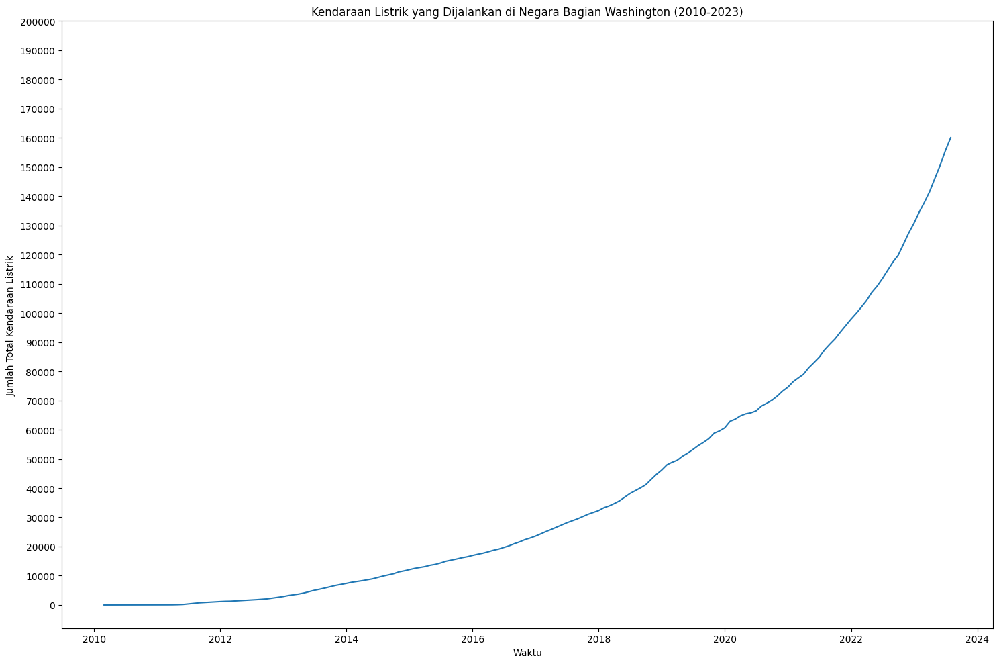

In [ ]:
fig, ax = plt.subplots(figsize = (15, 10))
sns.lineplot(x = 'DOL Transaction Date', y = 'State Total', data = df_cumsum, ax = ax)
ax.set_xlabel('Waktu')
ax.set_ylabel('Jumlah Total Kendaraan Listrik')
ax.set_title('Kendaraan Listrik yang Dijalankan di Negara Bagian Washington (2010-2023)')
ax.set_yticks(range(0, 210000, 10000))
plt.tight_layout()

Terlihat bahwa jumlah kendaraan listrik yang dijalankan di negara bagian Washington telah meningkat secara eksponensial selama 3 tahun terakhir. Hal tersebut menegaskan bahwa terdapat peluang yang besar untuk menginvestasikan perusahaan pengisian kendaraan listrik di negara bagian Washington karena memiliki tren meningkat tinggi dari tahun ke tahunnya.

*Catatan*: Karena data diawali dengan tahun 2010, maka perhitungan dimulai dengan 0 pada tahun 2010. Namun, bukan berarti bahwa tidak ada kendaraan listrik di jalan raya pada tahun 2010. Kami hanya mengambil tahun 2010 sebagai titik awal perhitungan.

## **Kendaraan Listrik yang Dijalankan Sepanjang Waktu menurut *County***

Karena waktu yang terbatas, kami akan membatasi analisis kami pada 10 *county* teratas yang memiliki pembelian kendaraan listrik terbanyak dimana *county* tertinggi akan kami modelkan dengan detail sedangkan yang lainnya tidak akan kami modelkan secara detail karena hanya akan digunakan untuk pembuatan dashboard.

In [ ]:
df['County'].value_counts()

King            113658
Snohomish        24021
Pierce           16988
Clark            12063
Thurston          7112
Kitsap            7083
Spokane           5157
Whatcom           5033
Benton            2500
Island            2126
Skagit            2126
Clallam           1184
Jefferson         1126
Cowlitz           1034
San Juan          1030
Chelan            1024
Yakima            1022
Mason              938
Lewis              766
Franklin           689
Grays Harbor       657
Grant              563
Kittitas           520
Walla Walla        478
Douglas            370
Whitman            317
Klickitat          306
Stevens            245
Pacific            228
Okanogan           215
Skamania           215
Asotin              92
Adams               64
Pend Oreille        61
Wahkiakum           51
Lincoln             45
Ferry               33
Columbia            26
Garfield             4
Name: County, dtype: int64

In [ ]:
top_10_county = ['King', 'Snohomish', 'Pierce', 'Clark', 'Thurston', 'Kitsap', 'Spokane', 'Whatcom', 'Benton', 'Island']

In [ ]:
# Mem-filter top 10
df_cumsum = df_cumsum.loc[:, ['DOL Transaction Date', *top_10_county]]
df_cumsum.head()

,DOL Transaction Date,King,Snohomish,Pierce,Clark,Thurston,Kitsap,Spokane,Whatcom,Benton,Island
0,2010-02-28,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0
1,2010-03-31,1.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0
2,2010-04-30,2.0,0.0,0.0,1.0,0.0,1,1.0,1.0,0.0,0.0
3,2010-05-31,2.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
4,2010-06-30,3.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0


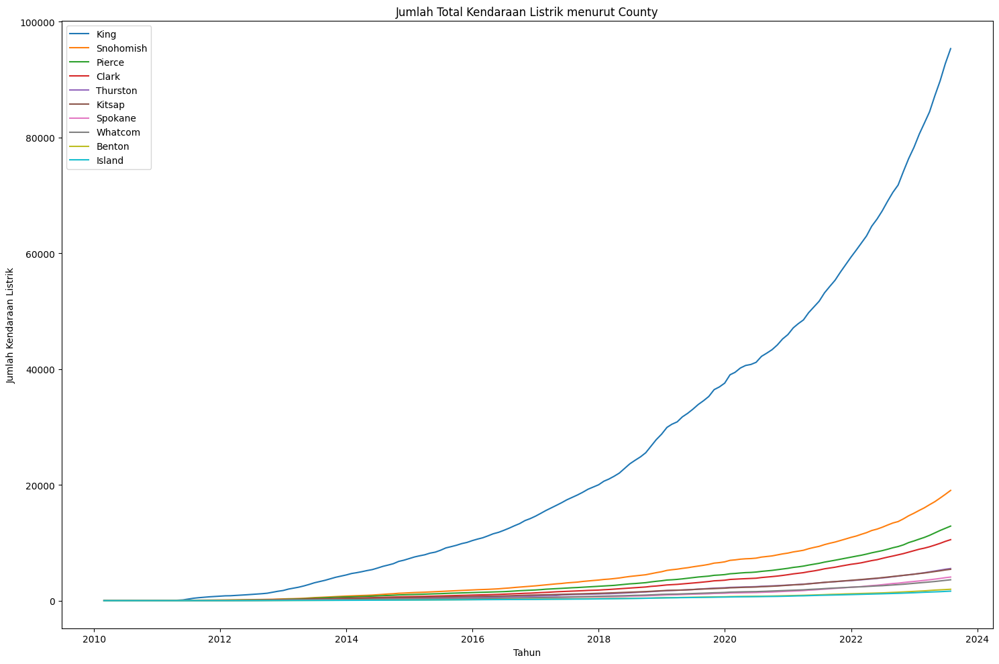

In [ ]:
fig, ax = plt.subplots(figsize = (15, 10))
for county in top_10_county:
    sns.lineplot(x = 'DOL Transaction Date', y = county, data = df_cumsum, ax = ax, label = county)
ax.set_xlabel('Tahun')
ax.set_ylabel('Jumlah Kendaraan Listrik')
ax.set_title('Jumlah Total Kendaraan Listrik menurut County')
ax.legend()
plt.tight_layout()

Terlihat bahwa dari 10 *county* dengan pembelian kendaraan listrik terbanyak, *county* King meningkat jauh lebih cepat dibandingkan dengan *county* yang lainnya.

> *King County is located in the U.S. state of Washington. The population was 2,269,675 in the 2020 census, making it the most populous county in Washington, and the 13th-most populous in the United States. The county seat is Seattle,also the state's most populous city*.

Dikutip dari https://en.wikipedia.org/wiki/King_County,_Washington

Banyaknya pembilian kendaraan listrik di *county* King mungkin disebabkan oleh *county* tersebut merupakan *county* dengan populasi terbanyak di negara bagian (*state*) Washington.

## **Kendaraan Listrik yang Dijalankan Seiring Waktu (Kecuali King County)**

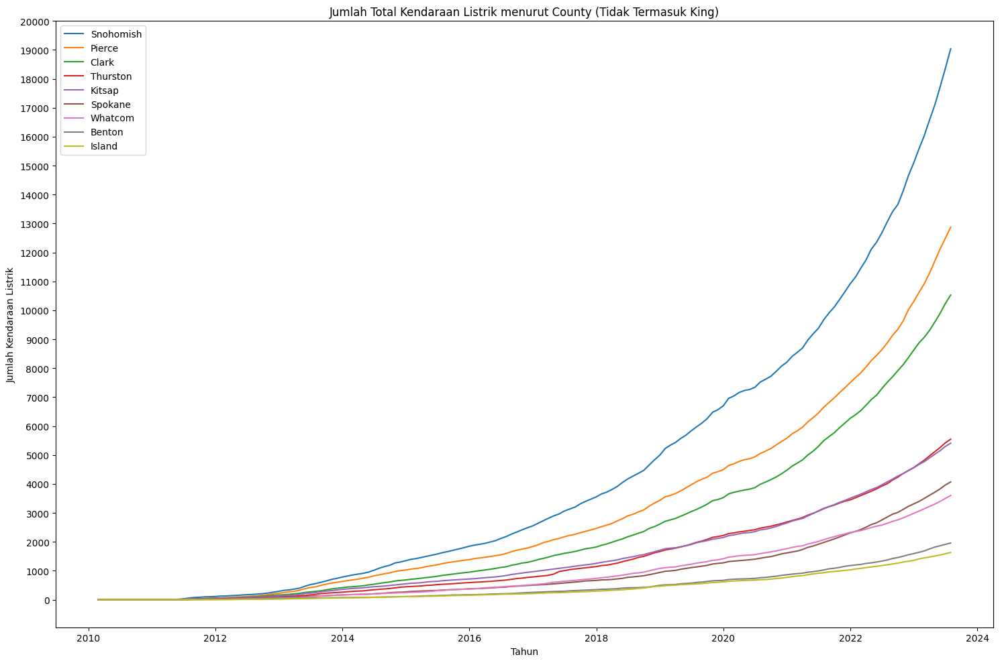

In [ ]:
top_10_county.remove('King')

fig, ax = plt.subplots(figsize = (15, 10))
for county in top_10_county:
    sns.lineplot(x = 'DOL Transaction Date', y = county, data = df_cumsum, ax = ax, label = county)
ax.set_xlabel('Tahun')
ax.set_ylabel('Jumlah Kendaraan Listrik')
ax.set_title('Jumlah Total Kendaraan Listrik menurut County (Tidak Termasuk King)')
ax.set_yticks(range(0, 21000, 1000))
ax.legend()
plt.tight_layout()

Setelah *county* King dikeluarkan, terlihat bahwa *county* Snohomish menempati pembelian kendaraan listrik terbanyak diikuti oleh Pierce dan Clark.

In [ ]:
top_10_county.insert(0, 'King')

## **Model Mobil yang Paling Banyak Dibeli menurut *County***

Informasi penting lainnya yang mungkin relevan untuk perusahaan pengisian daya listrik adalah model kendaraan listrik yang paling banyak dibeli di masing-masing *county*. Informasi tersebut dapat digunakan untuk menentukan faktor tambahan, seperti

- apakah akan menyertakan adaptor untuk jenis konektor yang berbeda
- jarak pengisi daya berdasarkan ukuran kendaraan.

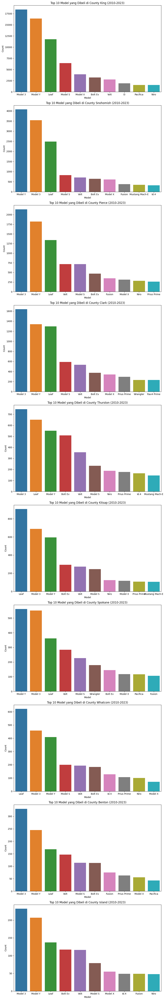

In [ ]:
top_n = 10
county_list = top_10_county
fig, ax = plt.subplots(figsize = (10, 60), nrows = len(county_list))

for i, county in enumerate(county_list):
  df_county = df[(df['County']==county) & (df['Transaction Type']=='Original Title')]
  model_count_df = pd.DataFrame(df_county['Model'].value_counts()).reset_index()
  model_count_df.columns = ['Model', 'Count']
  sns.barplot(x = 'Model', y = 'Count', data = model_count_df.head(top_n), ax = ax[i])
  ax[i].set_title(f'Top {top_n} Model yang Dibeli di County {county} (2010-2023)')
  plt.tight_layout();

In [ ]:
df[df['Model']=='Model 3']['Make'].unique()

array(['TESLA'], dtype=object)

In [ ]:
df[df['Model']=='Model Y']['Make'].unique()

array(['TESLA'], dtype=object)

In [ ]:
df[df['Model']=='Leaf']['Make'].unique()

array(['NISSAN'], dtype=object)

Nissan Leaf, Tesla Model 3, dan Tesla Model Y *mostly* merupakan top 3 kendaraan listrik yang paling banyak dibeli di masing-masing *county* tersebut.

# **Pemodelan**

In [ ]:
df_cumsum = df_cumsum.set_index('DOL Transaction Date').resample('M').asfreq()

In [ ]:
df_cumsum.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 162 entries, 2010-02-28 to 2023-07-31
Freq: M
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   King       162 non-null    float64
 1   Snohomish  162 non-null    float64
 2   Pierce     162 non-null    float64
 3   Clark      162 non-null    float64
 4   Thurston   162 non-null    float64
 5   Kitsap     162 non-null    int64  
 6   Spokane    162 non-null    float64
 7   Whatcom    162 non-null    float64
 8   Benton     162 non-null    float64
 9   Island     162 non-null    float64
dtypes: float64(9), int64(1)
memory usage: 13.9 KB


## **Pemisahan Data untuk Setiap *County***
Kami akan membuat model runtun waktu untuk sepuluh *county* teratas. Namun, hanya top 1 yaitu *county* King yang akan kami modelkan secara detail. Oleh karena itu, dataset akan dipisahkan sesuai *county*-nya.

In [ ]:
def separate_data_by_county(county, df):
  df_county = pd.DataFrame(df.loc[:, county])
  df_county.columns = ["Jumlah EV"]
  df_county.head()
  return df_county

In [ ]:
county_information = {}
for county in top_10_county:
    county_information[county] = {}
    county_information[county]['df'] = separate_data_by_county(county, df_cumsum)

In [ ]:
county_dfs = {}
for county in top_10_county:
    county_dfs[county] = separate_data_by_county(county, df_cumsum)

In [ ]:
county_dfs['King']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,1.0
2010-04-30,2.0
2010-05-31,2.0
2010-06-30,3.0
...,...
2023-03-31,84444.0
2023-04-30,87162.0
2023-05-31,89772.0


## **Membuat Fungsi**

### **Fungsi untuk Mengevaluasi Model**

In [ ]:
def evaluate_model(model):
  display(model.summary())
  model.plot_diagnostics()
  plt.tight_layout()

### **Fungsi untuk *Differencing***

In [ ]:
def difference(dataset, interval = 1):
  diff = list()
  for i in range(interval, len(dataset)):
    value = dataset[i] - dataset[i - interval]
    diff.append(value)
  return Series(diff)

### **Fungsi untuk Uji Stasioneritas dengan Melihat Mean, Standar Deviasi, ACF, dan PACF**

In [ ]:
def test_stationarity(timeseries):
  # Determing rolling statistics
  rolmean = timeseries.rolling(window = 12).mean()
  rolstd = timeseries.rolling(window = 12).std()

  # Plot rolling statistics:
  fig = plt.figure(figsize = (12, 8))
  orig = plt.plot(timeseries, color = 'blue', label = 'Original')
  mean = plt.plot(rolmean, color = 'red', label = 'Rolling Mean')
  std = plt.plot(rolstd, color = 'black', label = 'Rolling Std')
  plt.legend(loc = 'best')
  plt.title('Rolling Mean & Standard Deviation')
  plt.show()

  # Plot ACF and PACF
  fig = plt.figure(figsize = (12, 8))
  ax1 = fig.add_subplot(211)
  fig = sm.graphics.tsa.plot_acf(timeseries, lags = 36, ax = ax1)
  ax2 = fig.add_subplot(212)
  fig = sm.graphics.tsa.plot_pacf(timeseries, lags = 36, ax = ax2)

  # Perform Dickey-Fuller test:
  print('Results of Dickey-Fuller Test:')
  dftest = adfuller(timeseries, autolag = 'AIC')
  dfoutput = pd.Series(dftest[0:4], index = ['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
  for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
  print(dfoutput)
  print("")
  if dfoutput['p-value']<0.05:
    print("H_0 berhasil ditolak, yang berarti data sudah stasioner")
  elif dfoutput['p-value']>=0.05:
    print("H_0 tidak berhasil ditolak, yang berarti data belum stasioner")

### **Fungsi untuk Split Train dan Test Data**

In [ ]:
def train_test_split_ts (df, train_size, test_size):
  train_end_idx = int(round(len(df)*train_size, 0))
  train_set = df.iloc[0:train_end_idx, 0]
  test_set = df.iloc[train_end_idx:, 0]
  return train_set, test_set

In [ ]:
def plot_train_test_split(train_data, test_data, county):
  train_data.plot(label = 'Data Train')
  test_data.plot(label = 'Data Test')
  ax=plt.gca()
  ax.set_xlabel('Tahun')
  ax.set_ylabel('Jumlah Kendaraan Listrik')
  ax.set_title(f'Jumlah Kendaraan Listrik yang Dijalankan di County {county}')
  ax.legend()

### **Fungsi untuk *Forecastsing***

In [ ]:
def get_forecast(model, train_data, test_data, county_name, plot = True):
  # Membuat dataframe dengan informasi forecasting
  forecast_df = model.get_forecast(steps = len(test_data)).conf_int()
  forecast_df.columns = ['Lower Confidence Interval', 'Upper Confidence Interval']
  forecast_df['Forecasts'] = model.get_forecast(steps=len(test_data)).predicted_mean
  # Plot
  if plot==True:
    with plt.style.context('seaborn-whitegrid'):
      fig, ax = plt.subplots(figsize = (15, 10))
      sns.lineplot(data = train_data, color = 'black', ax = ax)
      sns.lineplot(data = forecast_df, x = forecast_df.index, y = 'Forecasts',
                   color = 'blue', ax = ax, label = 'Data Forecast', ls = '--')
      sns.lineplot(data=test_data, color = 'purple', ax = ax, label = 'Actual Data', ls = '-.')
      ax.fill_between(forecast_df.index, y1 = forecast_df['Lower Confidence Interval'],
                      y2 = forecast_df['Upper Confidence Interval'], color = 'green', alpha = 0.3,
                      label = 'Confidence Interval')
      ax.set_xlabel('Year')
      ax.set_title(f'Data Test dan Forecast Jumlah Kendaraan Listrik di County {county_name}')
      ax.legend(loc = 2)
      plt.show()
  print("")
  mape=mean_absolute_percentage_error(test_data, forecast_df['Forecasts'])
  print(f"Mean Absolute Percentage Error: {mape}")
  print("")
  mse=mean_squared_error(test_data, forecast_df['Forecasts'])
  print(f"Mean Squared Error: {mse}")
  print("")
  print(f"Root Mean Squared Error: {mse**0.5}")
  print("")
  r2=r2_score(test_data, forecast_df['Forecasts'])
  print(f"R-squared: {r2}")
  return forecast_df

### **Fungsi untuk Memprediksi Masa Depan**

In [ ]:
def get_prediction(model, df, test_data, county_name, plot = True):
    # Membuat dataframe dengan informasi prediksi
    prediction_df = model.get_forecast(steps = 36).conf_int()
    prediction_df.columns = ['Lower Confidence Interval', 'Upper Confidence Interval']
    prediction_df['Predictions'] = model.get_forecast(steps = 36).predicted_mean

    # Get the last result of the prediction, lower CI, and upper CI
    last_prediction = prediction_df.iloc[-1]['Predictions']
    last_lower_ci = prediction_df.iloc[-1]['Lower Confidence Interval']
    last_upper_ci = prediction_df.iloc[-1]['Upper Confidence Interval']

    # Plot
    if plot==True:
        with plt.style.context('seaborn-whitegrid'):
            fig, ax = plt.subplots(figsize = (15, 10))
            sns.lineplot(data = df, ax = ax)
            sns.lineplot(data = prediction_df, x = prediction_df.index, y = 'Predictions',
                         color = 'orange', ax = ax, label = 'Predicted Data', ls = '--')
            ax.fill_between(prediction_df.index, y1 = prediction_df['Lower Confidence Interval'],
                            y2 = prediction_df['Upper Confidence Interval'], color = 'green', alpha = 0.3,
                            label = 'Confidence Interval')
            ax.set_xlabel('Tahun')
            ax.set_ylabel('Jumlah Kendaraan Listrik')
            ax.set_title(f'Prediksi Jumlah Kendaraan Listrik di {county_name} untuk Agustus 2023 - Juli 2026')

            # Annotate the last result of the prediction
            x = prediction_df.index[-1]
            y_pred = last_prediction
            y_lower = last_lower_ci
            y_upper = last_upper_ci
            ax.annotate(f'Last Prediction: {y_pred:.0f}', xy=(x, y_pred), xytext=(0, 10), textcoords='offset points', ha='center')
            ax.annotate(f'Last Lower CI: {y_lower:.0f}', xy=(x, y_lower), xytext=(0, -20), textcoords='offset points', ha='center')
            ax.annotate(f'Last Upper CI: {y_upper:.0f}', xy=(x, y_upper), xytext=(0, 10), textcoords='offset points', ha='center')

            #Move the legend
            ax.legend(loc='upper center')

            plt.show()
        return prediction_df

## ***County* King**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['King']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,1.0
2010-04-30,2.0
2010-05-31,2.0
2010-06-30,3.0
...,...
2023-03-31,84444.0
2023-04-30,87162.0
2023-05-31,89772.0


In [ ]:
king = county_dfs['King'].copy()
king.reset_index(inplace=True)
mask = king['DOL Transaction Date'] >= '2020-01-31'
king = king[mask]

king.set_index('DOL Transaction Date', inplace = True)

### **Statistika Deskriptif**

In [ ]:
king.describe()

,Jumlah EV
count,43.000000
mean,59844.813953
std,16520.856140
min,39015.000000
25%,45578.500000
50%,56750.000000
75%,71166.500000
max,95356.000000


In [ ]:
county_information['King']['df'].describe()

,Jumlah EV
count,162.000000
mean,23826.679012
std,25086.881837
min,0.000000
25%,3138.250000
50%,13995.500000
75%,40000.250000
max,95356.000000


### **Visualisasi**

In [ ]:
import plotly.express as px
fig = px.line(county_information['King']['df'], y = 'Jumlah EV', title = "Jumlah Kendaraan Listrik di County King (Februari 2010 - Juli 2023)")
fig.show()

In [ ]:
import plotly.express as px
fig = px.line(king, y = 'Jumlah EV', title = "Jumlah Kendaraan Listrik di County King (Januari 2020 - Juli 2023)")
fig.show()

### **Cek Tren dan *Seasonality***

<Axes: xlabel='DOL Transaction Date', ylabel='Jumlah EV'>

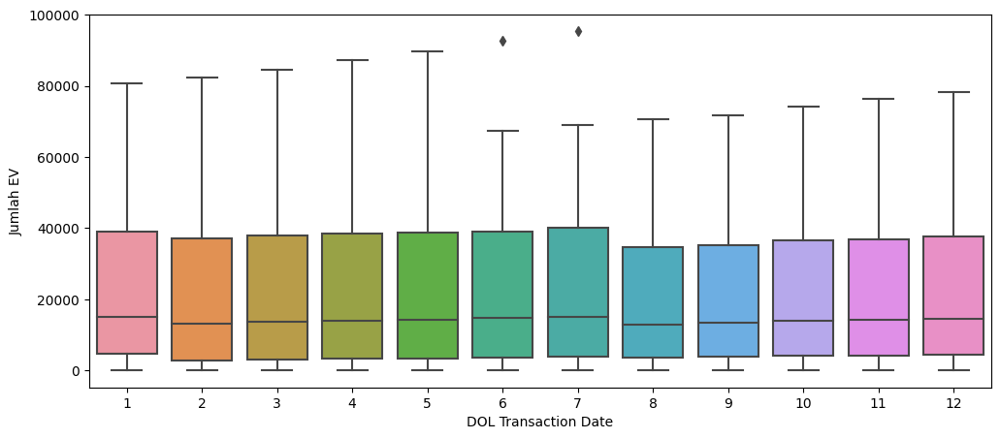

In [ ]:
#2010 - 2023
fig, ax = plt.subplots(figsize = (12, 5))
sns.boxplot(x = county_information['King']['df'].index.month,
            y = county_information['King']['df']['Jumlah EV'], ax = ax)

<Axes: xlabel='DOL Transaction Date', ylabel='Jumlah EV'>

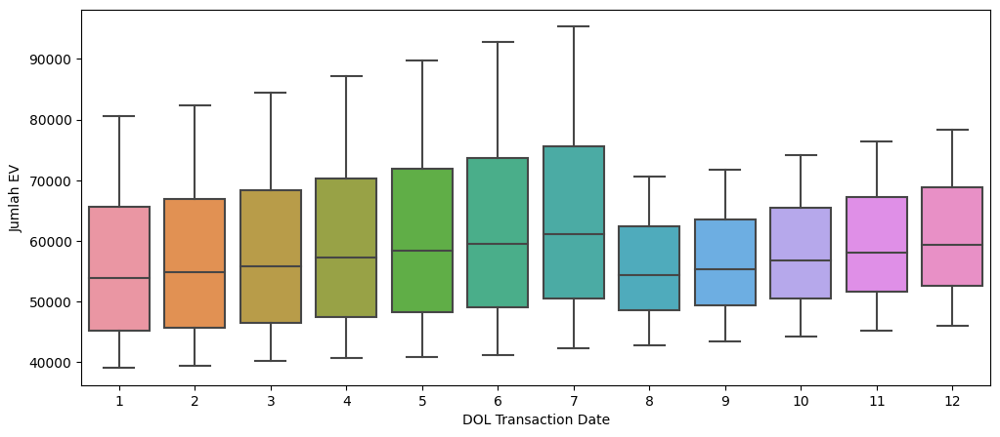

In [ ]:
#2020 - 2023
fig, ax = plt.subplots(figsize = (12, 5))
sns.boxplot(x = king.index.month,
            y = king['Jumlah EV'], ax = ax)

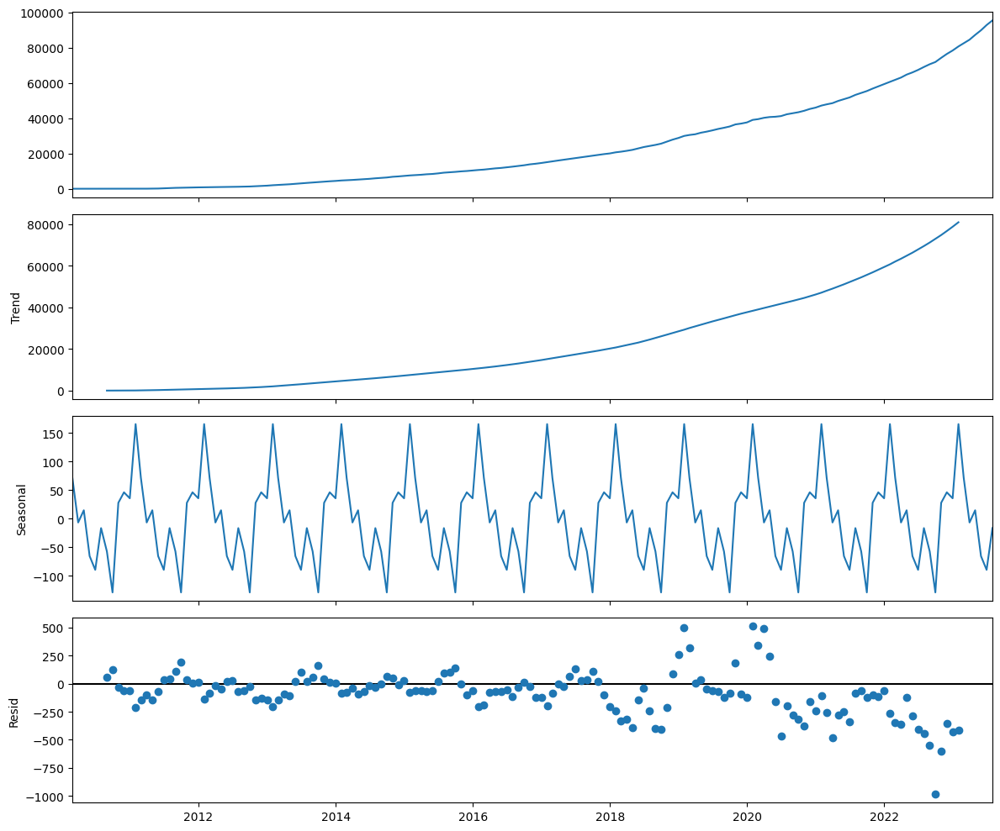

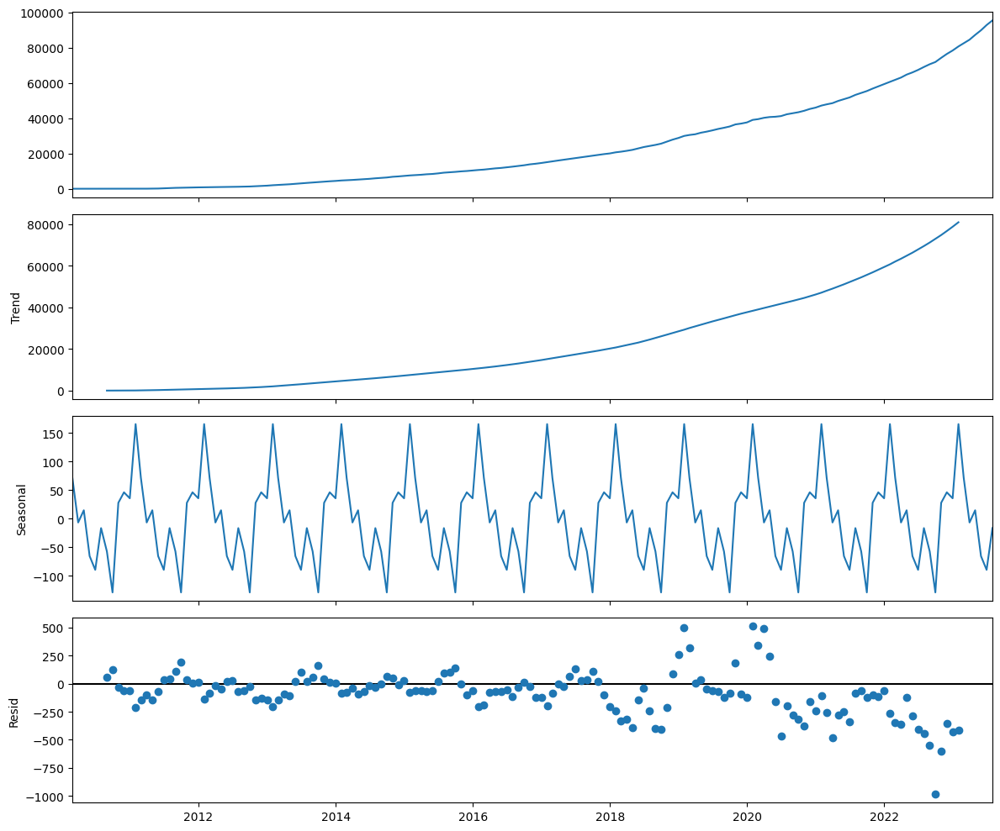

In [ ]:
#2010 - 2023
import statsmodels.tsa.api as tsa

plt.rcParams['figure.figsize'] = (12, 10)
decomp = tsa.seasonal_decompose(county_information['King']['df'])
decomp.plot()

Dari hasil tersebut, terlihat bahwa jumlah kendaraan listrik di *county* King mengalami tren peningkatan. Selain itu, terdapat komponen *seasonality* pada data tersebut.

### **Uji Stasioneritas**

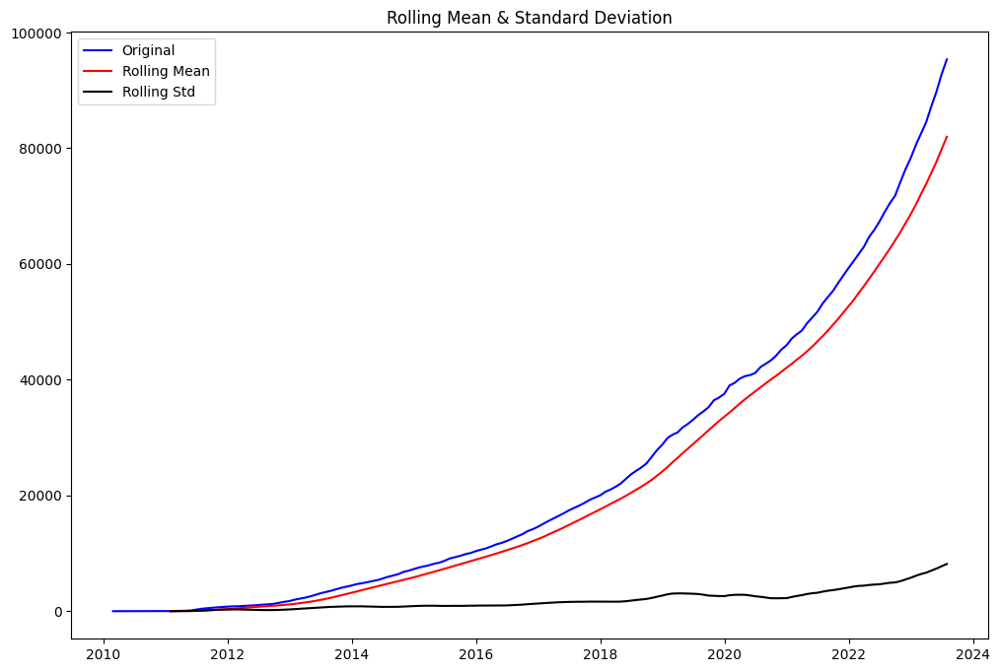

Results of Dickey-Fuller Test:
Test Statistic                   1.718537
p-value                          0.998173
#Lags Used                       7.000000
Number of Observations Used    154.000000
Critical Value (1%)             -3.473543
Critical Value (5%)             -2.880498
Critical Value (10%)            -2.576878
dtype: float64

H_0 tidak berhasil ditolak, yang berarti data belum stasioner


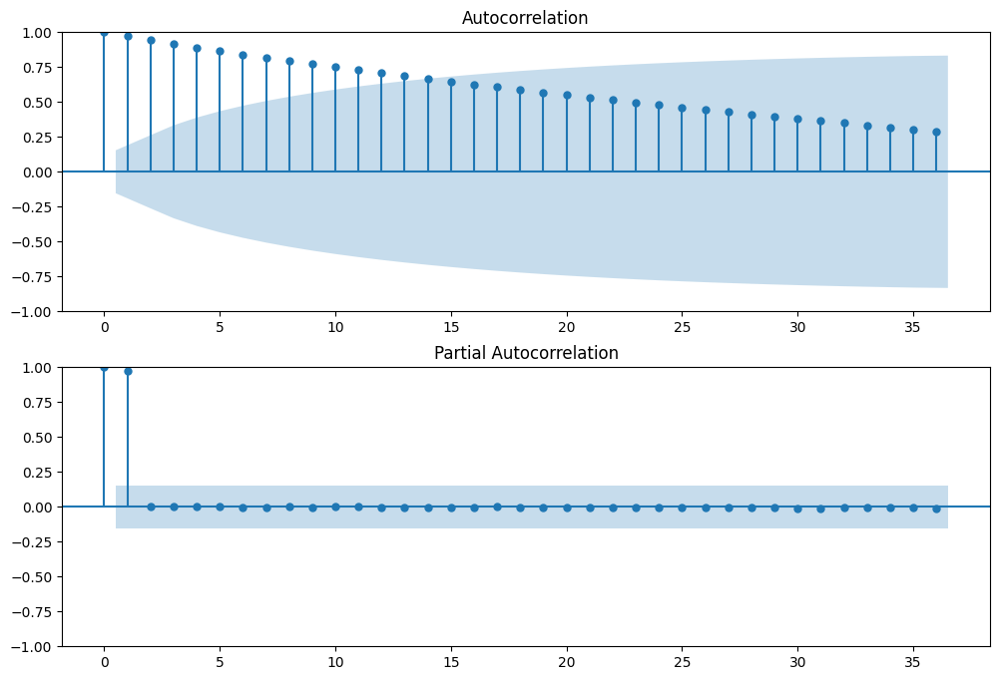

In [ ]:
#2010 - 2023
test_stationarity(county_information['King']['df']['Jumlah EV'])

Dari hasil tersebut, terlihat bahwa runtun waktu tersebut tidak stasioner. Oleh karena itu,  perlu ditambahkan orde *differencing* pada penentuan model selanjutnya.

### **Data *Splitting***

Data akan di-*split* dengan rasio 80/20 (Train/Test).

In [ ]:
train_king, test_king = train_test_split_ts(county_information['King']['df'], 0.80, 0.20)

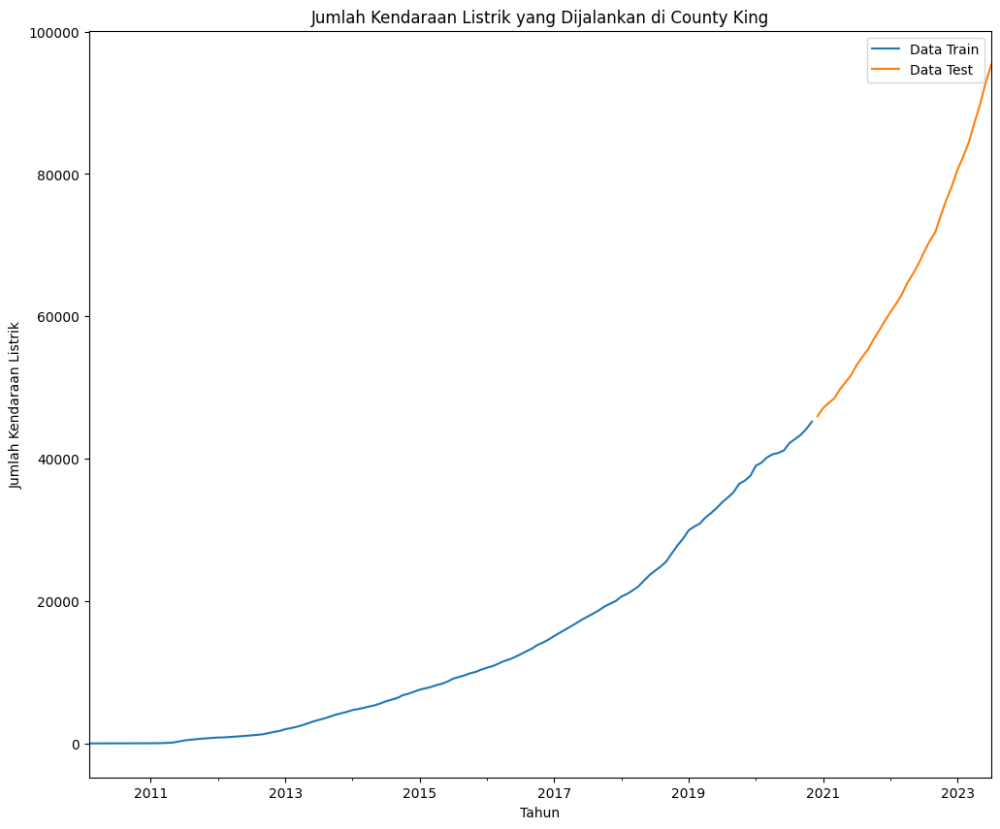

In [ ]:
plot_train_test_split(train_king, test_king, 'King')

### ***Model Identification***

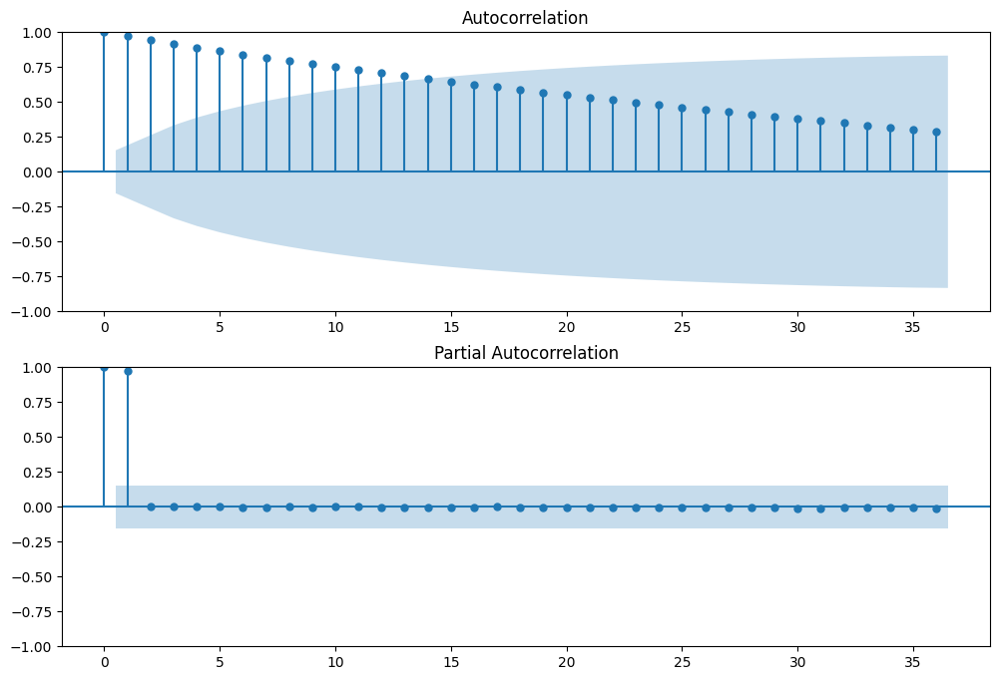

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['King']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['King']['df'], lags = 36, ax = ax2)

Untuk mendapatkan model yang dapat memprediksi nilai masa depan secara akurat, perlu untuk mengoptimalkan nilai $p, d,q$ model dan memvalidasinya. Kami akan menggunakan bantuan fungsi `auto_arima` dari library `pmdarima`.

In [ ]:
auto_model = pm.auto_arima(train_king, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  130
Model:             SARIMAX(0, 2, 1)x(1, 0, 1, 12)   Log Likelihood                -827.715
Date:                            Fri, 25 Aug 2023   AIC                           1663.430
Time:                                    17:26:51   BIC                           1674.838
Sample:                                02-28-2010   HQIC                          1668.065
                                     - 11-30-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7502      0.037    -20.342      0.000      -0.822      -0.678
ar.S.L12       0.8149      0.243      3.356      0.001       0.339       1.291
ma.S.L12      -0.5481      0.276     -1.988      0.047      -1.088      -0.008
sigma2       2.35e+04   1783.212     13.177      0.000       2e+04     2.7e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.48   Jarque-Bera (JB):               114.15
Prob(Q):                              0.49   Prob(JB):                         0.00
Heteroskedasticity (H):              33.45   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Parameter terbaik (berdasarkan skor AIC) adalah ($0, 2, 1$) untuk orde reguler $\mbox{ARIMA}$ dan ($1, 0, 1, 12$) untuk orde *seasonal*. Jadi, model runtun waktu yang baik untuk *county* King yaitu $\mbox{ARIMA}(0, 2, 1)(1, 0, 1)_{12}$.

### ***Model Validation* untuk Data Test**

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          Jumlah EV   No. Observations:                  130
Model:             SARIMAX(0, 2, 1)x(1, 0, 1, 12)   Log Likelihood                -742.716
Date:                            Fri, 25 Aug 2023   AIC                           1493.431
Time:                                    17:27:35   BIC                           1504.376
Sample:                                02-28-2010   HQIC                          1497.873
                                     - 11-30-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7422      0.044    -16.950      0.000      -0.828      -0.656
ar.S.L12       0.8741      0.195      4.486      0.000       0.492       1.256
ma.S.L12      -0.4603      0.207     -2.227      0.026      -0.865      -0.055
sigma2      2.611e+04   2184.860     11.949      0.000    2.18e+04    3.04e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.70   Jarque-Bera (JB):                64.51
Prob(Q):                              0.40   Prob(JB):                         0.00
Heteroskedasticity (H):              26.52   Skew:                             0.06
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

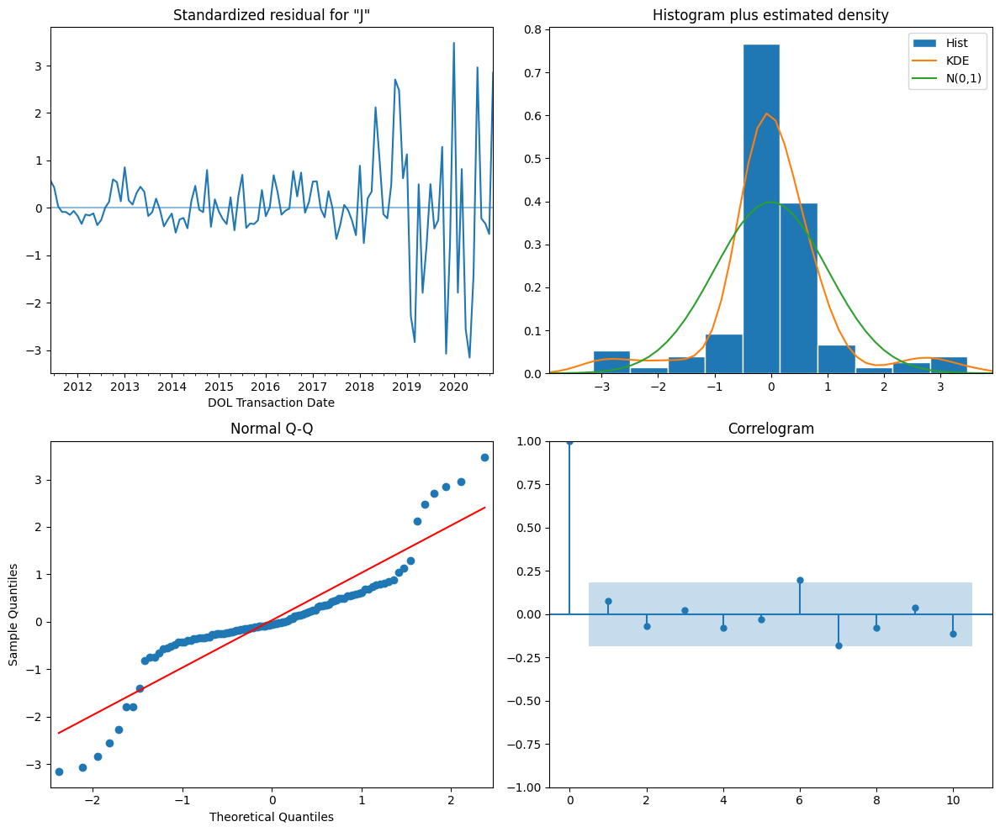

In [ ]:
model = SARIMAX(train_king, order = (0, 2, 1), seasonal_order = (1, 0, 1, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

Terlihat bahwa residual relatif tidak "mirip" dengan distribusi normal. Namun, $p-value$ dari koefisien menunjukkan bahwa koefisien-koefisien tersebut signifikan secara statistik.

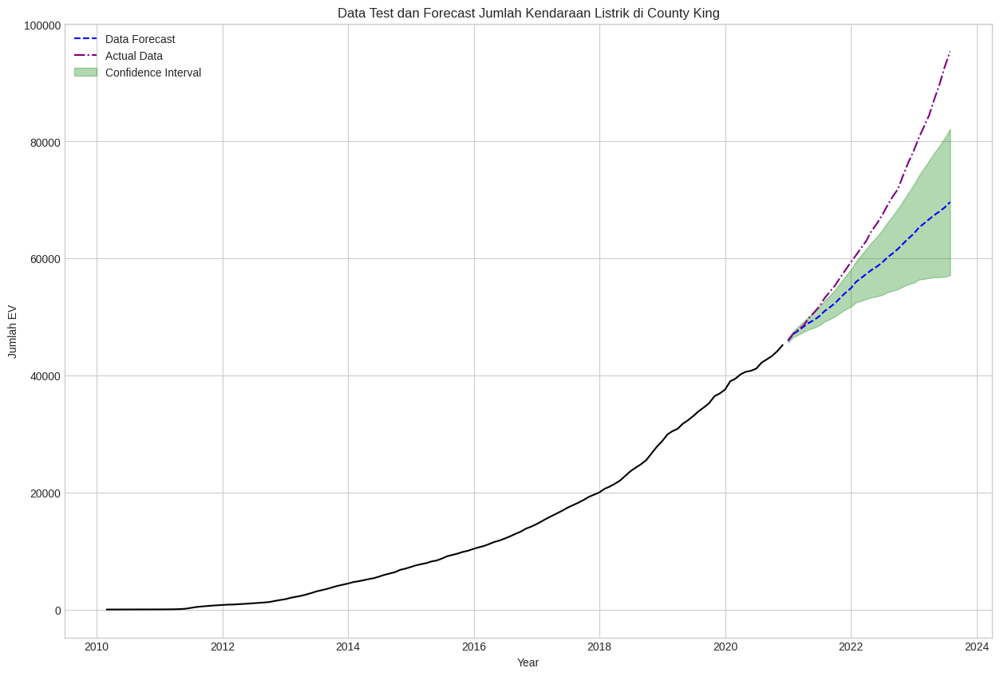


Mean Absolute Percentage Error: 0.11022962003362075

Mean Squared Error: 125719125.55856653

Root Mean Squared Error: 11212.45403819193

R-squared: 0.38743620310250126


In [ ]:
df_king_forecast = get_forecast(model, train_king, test_king, 'King', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_king, test_king = train_test_split_ts(king, 0.80, 0.20)

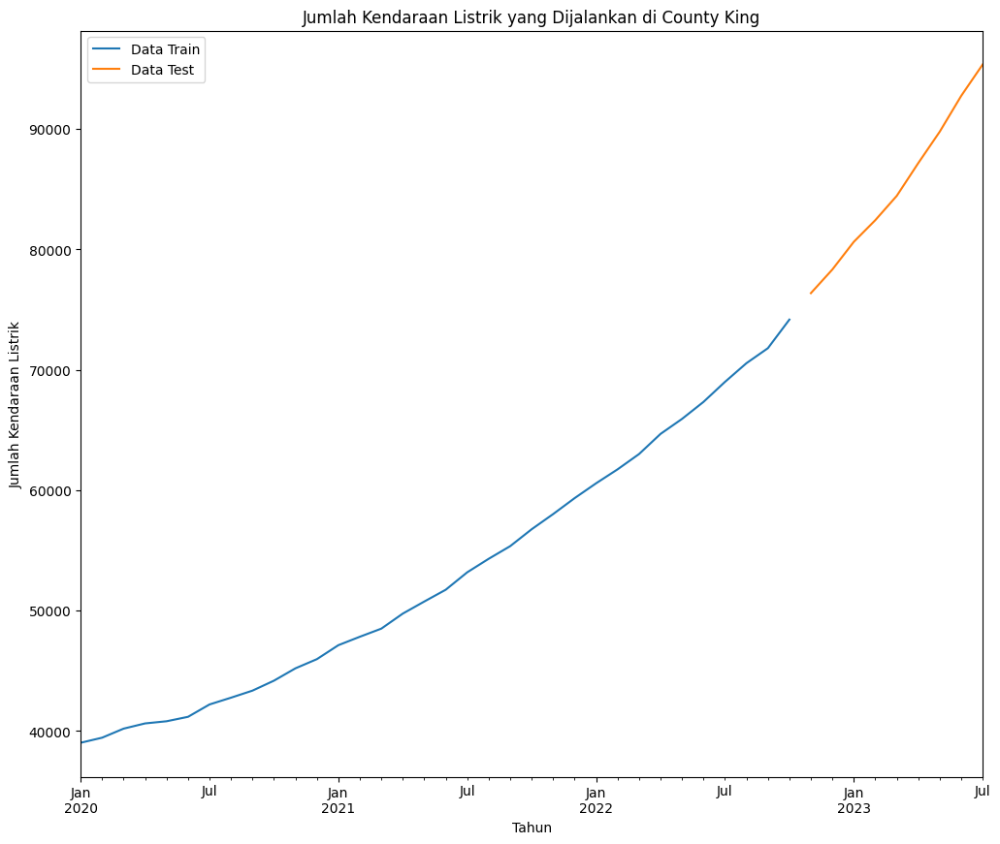

In [ ]:
plot_train_test_split(train_king, test_king, 'King')

In [ ]:
auto_model = pm.auto_arima(train_king, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   34
Model:             SARIMAX(1, 2, 0)x(1, 0, 0, 12)   Log Likelihood                -229.221
Date:                            Fri, 25 Aug 2023   AIC                            464.443
Time:                                    17:35:40   BIC                            468.840
Sample:                                01-31-2020   HQIC                           465.900
                                     - 10-31-2022                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1976      0.101     -1.962      0.050      -0.395      -0.000
ar.S.L12       0.2443      0.094      2.595      0.009       0.060       0.429
sigma2      7.939e+04   1.42e+04      5.600      0.000    5.16e+04    1.07e+05
===================================================================================
Ljung-Box (L1) (Q):                   1.89   Jarque-Bera (JB):                 8.31
Prob(Q):                              0.17   Prob(JB):                         0.02
Heteroskedasticity (H):               1.38   Skew:                             1.10
Prob(H) (two-sided):                  0.60   Kurtosis:                         4.20
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          Jumlah EV   No. Observations:                   34
Model:             SARIMAX(1, 2, 0)x(1, 0, 0, 12)   Log Likelihood                -133.629
Date:                            Fri, 25 Aug 2023   AIC                            273.258
Time:                                    17:35:44   BIC                            276.091
Sample:                                01-31-2020   HQIC                           273.738
                                     - 10-31-2022                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6814      0.269     -2.532      0.011      -1.209      -0.154
ar.S.L12       0.5977      0.307      1.950      0.051      -0.003       1.199
sigma2      7.523e+04      2e+04      3.768      0.000    3.61e+04    1.14e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 4.10
Prob(Q):                              0.90   Prob(JB):                         0.13
Heteroskedasticity (H):               1.07   Skew:                             1.11
Prob(H) (two-sided):                  0.94   Kurtosis:                         3.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

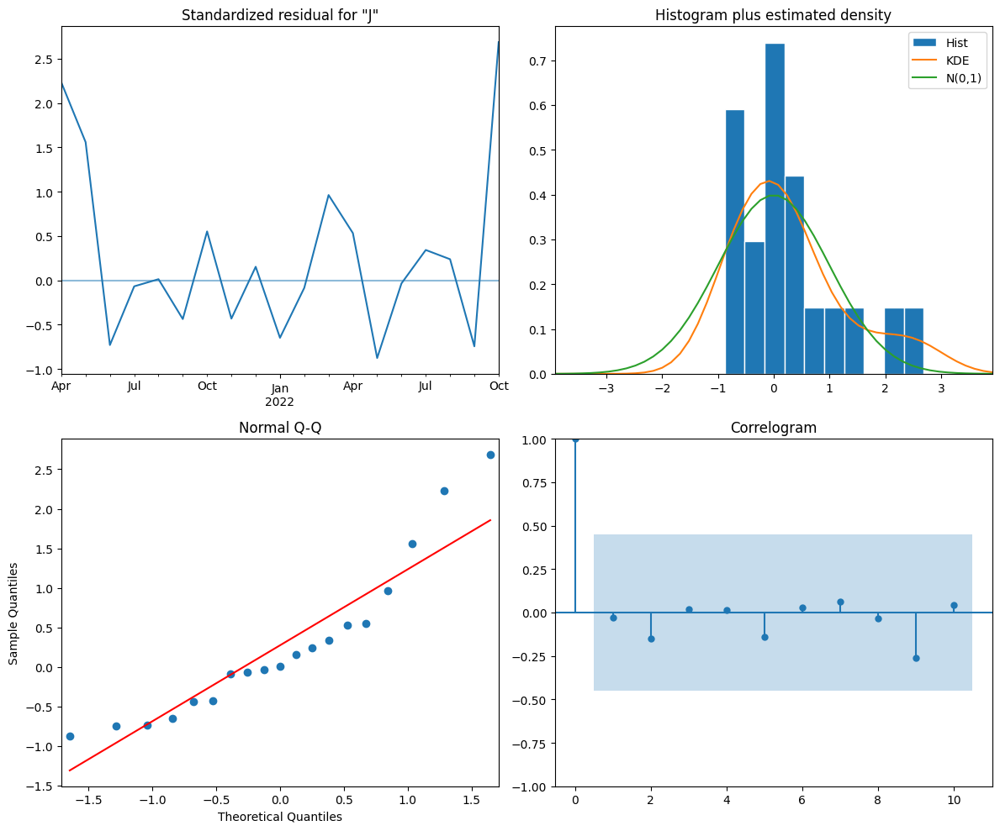

In [ ]:
model = SARIMAX(train_king, order = (1, 2, 0), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

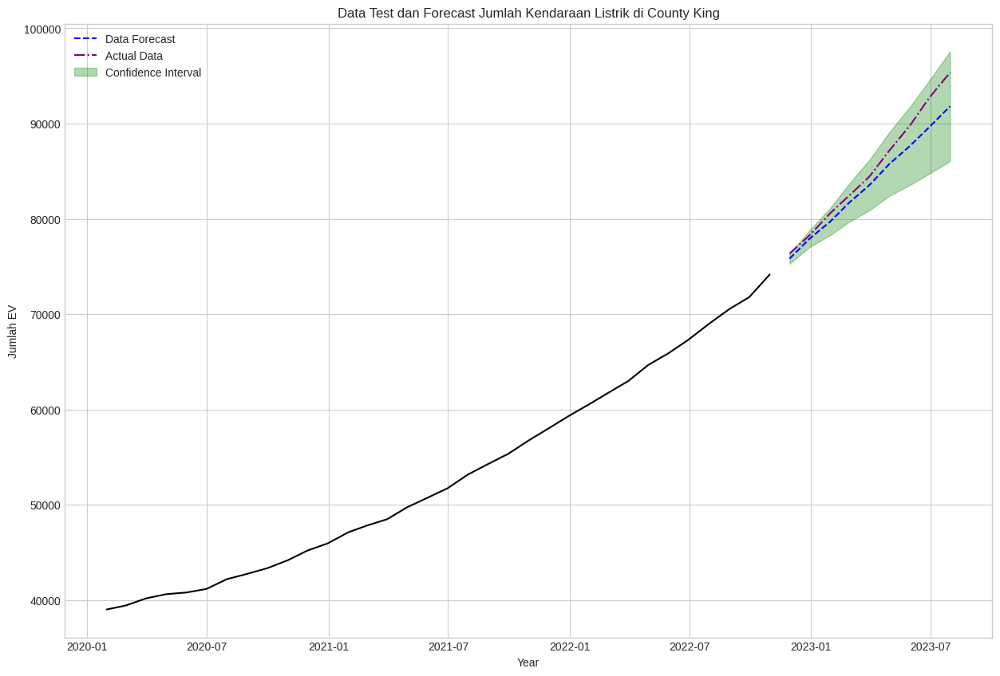


Mean Absolute Percentage Error: 0.01696402915975527

Mean Squared Error: 3470399.5655562785

Root Mean Squared Error: 1862.900846947115

R-squared: 0.9079994808680997


In [ ]:
df_king_forecast = get_forecast(model, train_king, test_king, 'King', plot = True)

### **Prediksi Masa Depan**

#### ***Fit Model***

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          Jumlah EV   No. Observations:                   43
Model:             SARIMAX(1, 2, 0)x(1, 0, 0, 12)   Log Likelihood                -199.424
Date:                            Fri, 25 Aug 2023   AIC                            404.847
Time:                                    16:47:55   BIC                            408.844
Sample:                                01-31-2020   HQIC                           406.069
                                     - 07-31-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4269      0.199     -2.148      0.032      -0.817      -0.037
ar.S.L12       0.6217      0.226      2.756      0.006       0.180       1.064
sigma2      8.992e+04   2.58e+04      3.482      0.000    3.93e+04    1.41e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):                 1.49
Prob(Q):                              0.64   Prob(JB):                         0.47
Heteroskedasticity (H):               1.61   Skew:                             0.56
Prob(H) (two-sided):                  0.49   Kurtosis:                         2.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

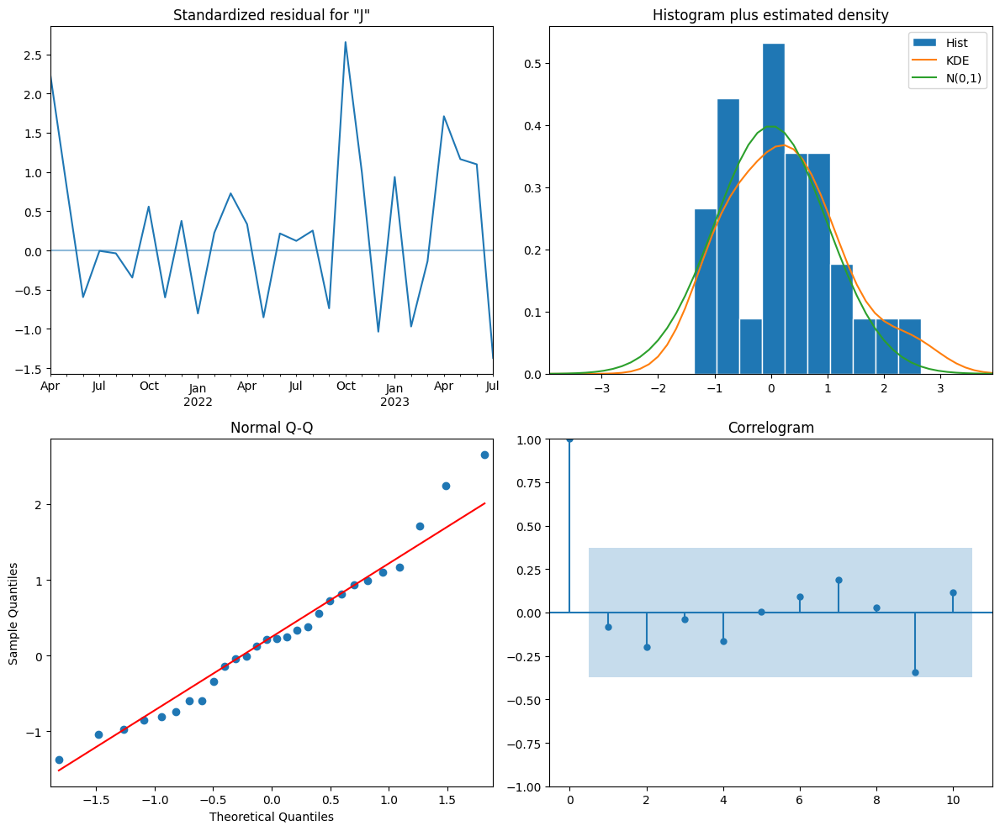

In [ ]:
model = SARIMAX(king['Jumlah EV'], order = (1, 2, 0), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

Sama seperti sebelumnya, residual tersebut relatif tidak "mirip" dengan distribusi normal. Namun, $p-value$ dari koefisien juga menunjukkan bahwa koefisien-koefisien tersebut signifikan secara statistik.

#### **Plot**

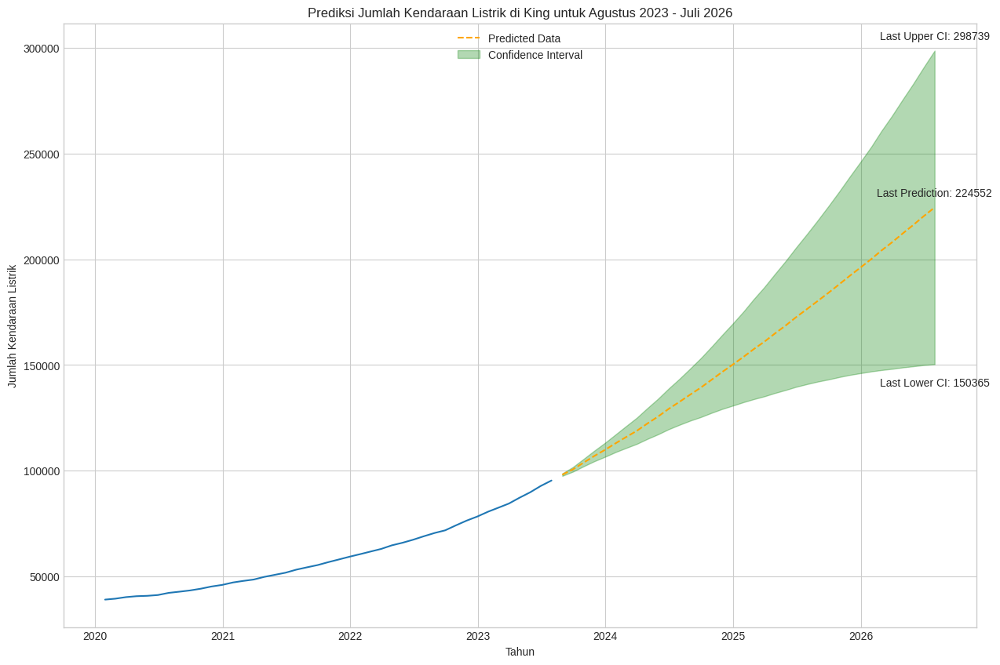

In [ ]:
df_king_preds = get_prediction(model, king['Jumlah EV'], test_king, 'King', plot = True)

Dengan model ini, diprediksi bahwa jumlah kendaraan listrik di *county* King akan terus meningkat hampir secara linier berdasarkan nilai rata-rata. Namun, jika dilihat berdasarkan interval kepercayaan, jumlah kendaraan listrik meningkat secara eksponensial.

#### ***Saving Prediction***

In [ ]:
county_information['King']['Predictions'] = df_king_preds

## ***County* Snohomish**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Snohomish']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,0.0
2010-05-31,1.0
2010-06-30,1.0
...,...
2023-03-31,16573.0
2023-04-30,17084.0
2023-05-31,17718.0


In [ ]:
snohomish = county_dfs['Snohomish'].copy()
snohomish.reset_index(inplace=True)
mask = snohomish['DOL Transaction Date'] >= '2020-01-31'
snohomish = snohomish[mask]

snohomish.set_index('DOL Transaction Date', inplace = True)

### **Data Splitting** ###

In [ ]:
train_snohomish, test_snohomish = train_test_split_ts(county_information['Snohomish']['df'], 0.80, 0.20)

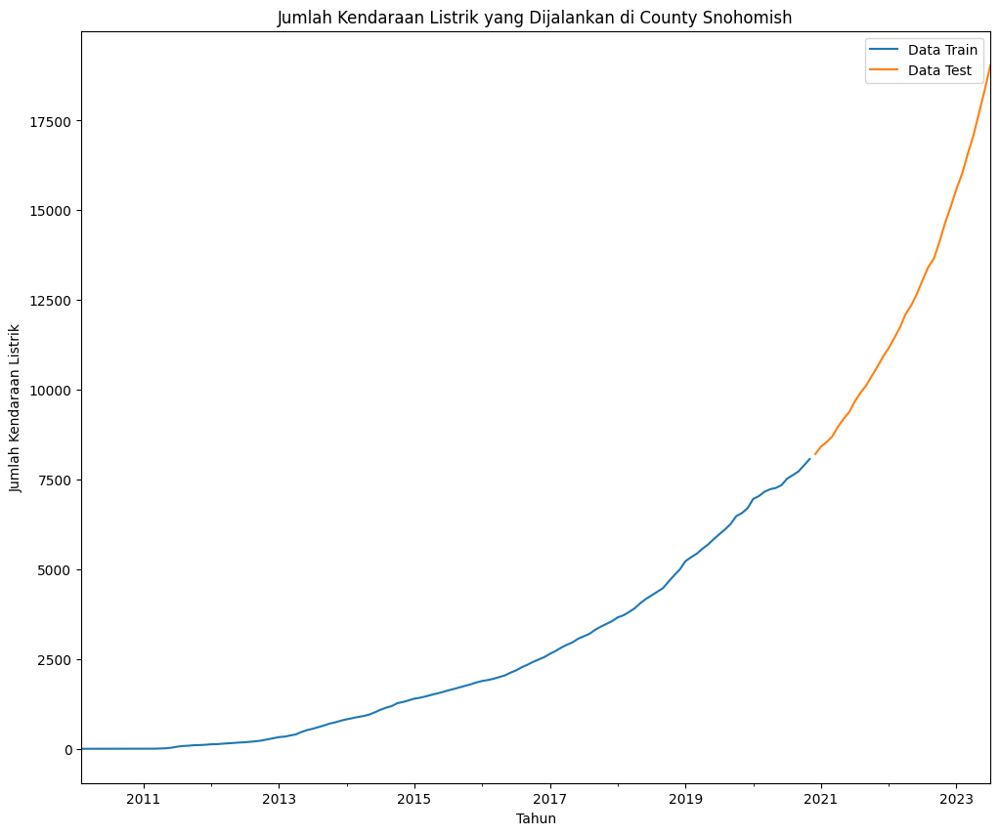

In [ ]:
plot_train_test_split(train_snohomish, test_snohomish, 'Snohomish')

### ***Model Identification***

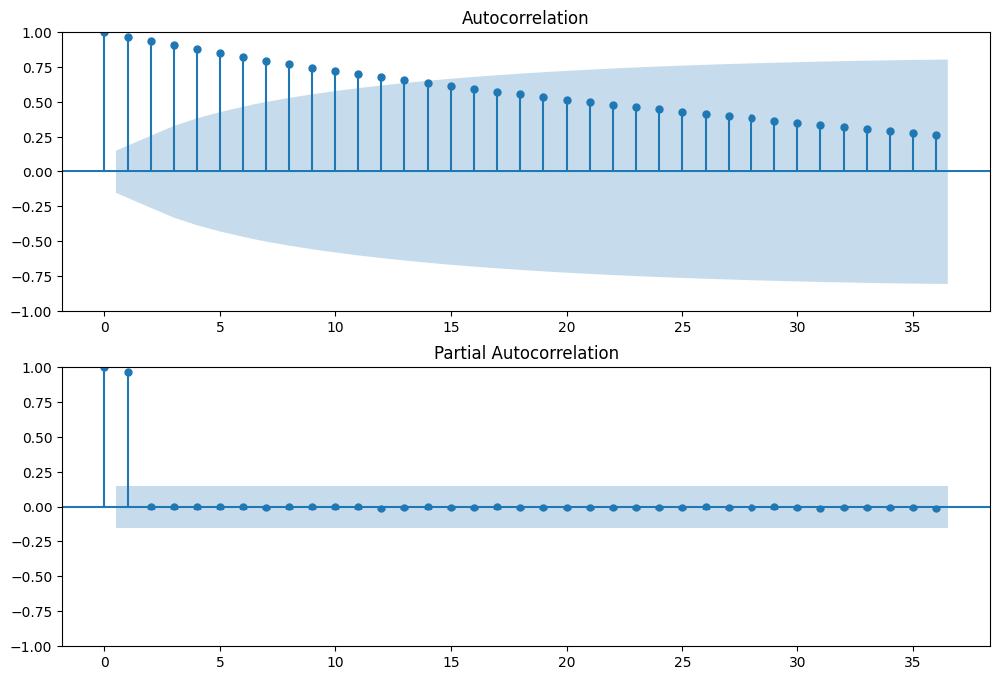

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Snohomish']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Snohomish']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_snohomish, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  130
Model:             SARIMAX(0, 2, 2)x(0, 0, 2, 12)   Log Likelihood                -604.750
Date:                            Fri, 25 Aug 2023   AIC                           1219.500
Time:                                    18:19:07   BIC                           1233.760
Sample:                                02-28-2010   HQIC                          1225.294
                                     - 11-30-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6160      0.060    -10.330      0.000      -0.733      -0.499
ma.L2         -0.1889      0.067     -2.841      0.004      -0.319      -0.059
ma.S.L12       0.3548      0.072      4.952      0.000       0.214       0.495
ma.S.L24       0.4668      0.134      3.496      0.000       0.205       0.728
sigma2       701.4465     63.859     10.984      0.000     576.285     826.609
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                71.75
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):              20.98   Skew:                            -0.30
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### ***Model Validation* untuk Data Test**

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                          Jumlah EV   No. Observations:                  130
Model:             SARIMAX(0, 2, 2)x(0, 0, 2, 12)   Log Likelihood                -488.381
Date:                            Fri, 25 Aug 2023   AIC                            986.761
Time:                                    18:19:57   BIC                            999.837
Sample:                                02-28-2010   HQIC                           992.054
                                     - 11-30-2020                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6219      0.077     -8.126      0.000      -0.772      -0.472
ma.L2         -0.1815      0.085     -2.141      0.032      -0.348      -0.015
ma.S.L12       0.3637      0.088      4.126      0.000       0.191       0.536
ma.S.L24       0.4507      0.174      2.587      0.010       0.109       0.792
sigma2       875.3522     99.191      8.825      0.000     680.941    1069.763
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                26.75
Prob(Q):                              0.82   Prob(JB):                         0.00
Heteroskedasticity (H):              11.88   Skew:                            -0.31
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

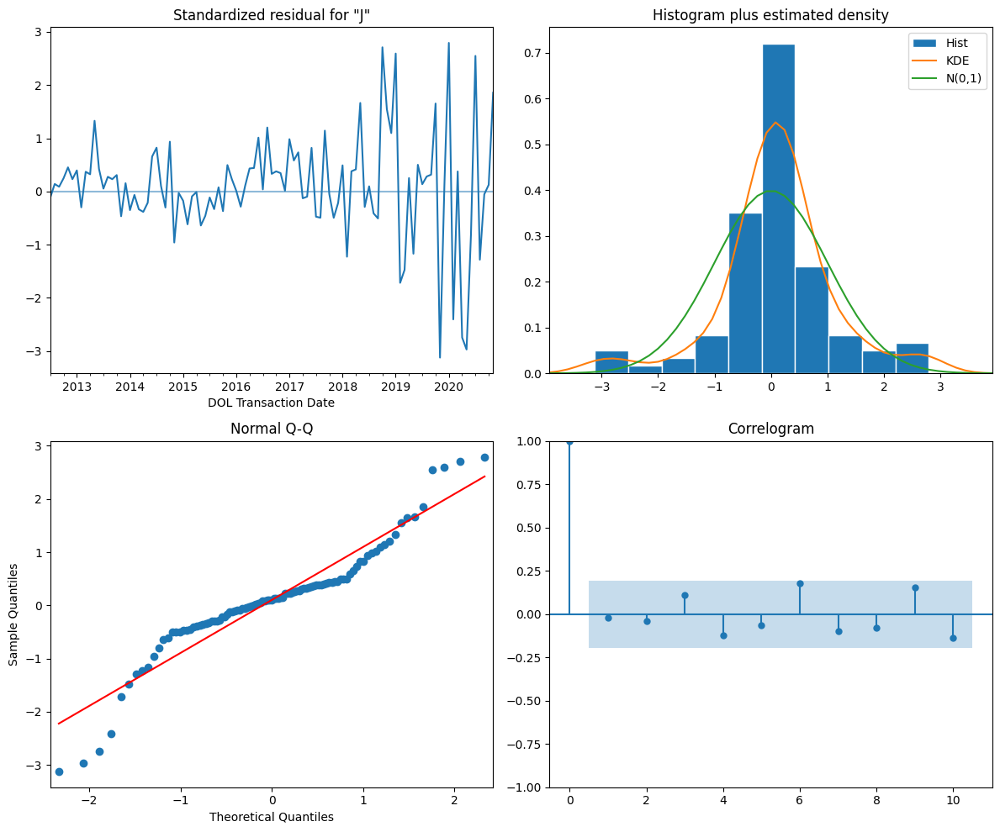

In [ ]:
model = SARIMAX(train_snohomish, order = (0, 2, 2), seasonal_order = (0, 0, 2, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

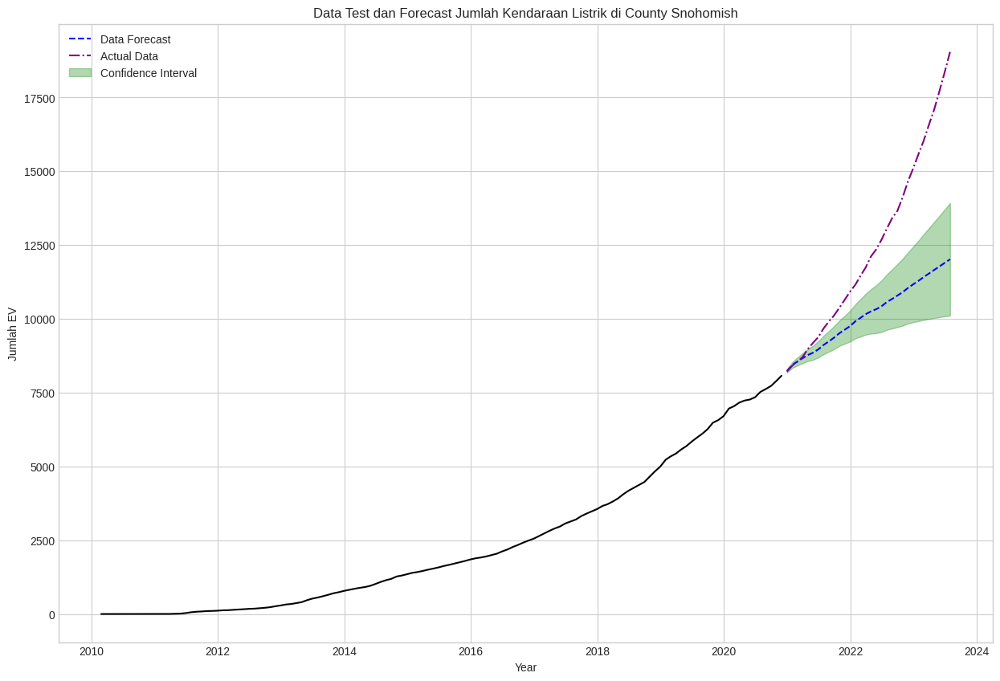


Mean Absolute Percentage Error: 0.15774814457582145

Mean Squared Error: 9548501.462224048

Root Mean Squared Error: 3090.064960842093

R-squared: 0.024365584159216525


In [ ]:
df_snohomish_forecast = get_forecast(model, train_snohomish, test_snohomish, 'Snohomish', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_snohomish, test_snohomish = train_test_split_ts(snohomish, 0.80, 0.20)

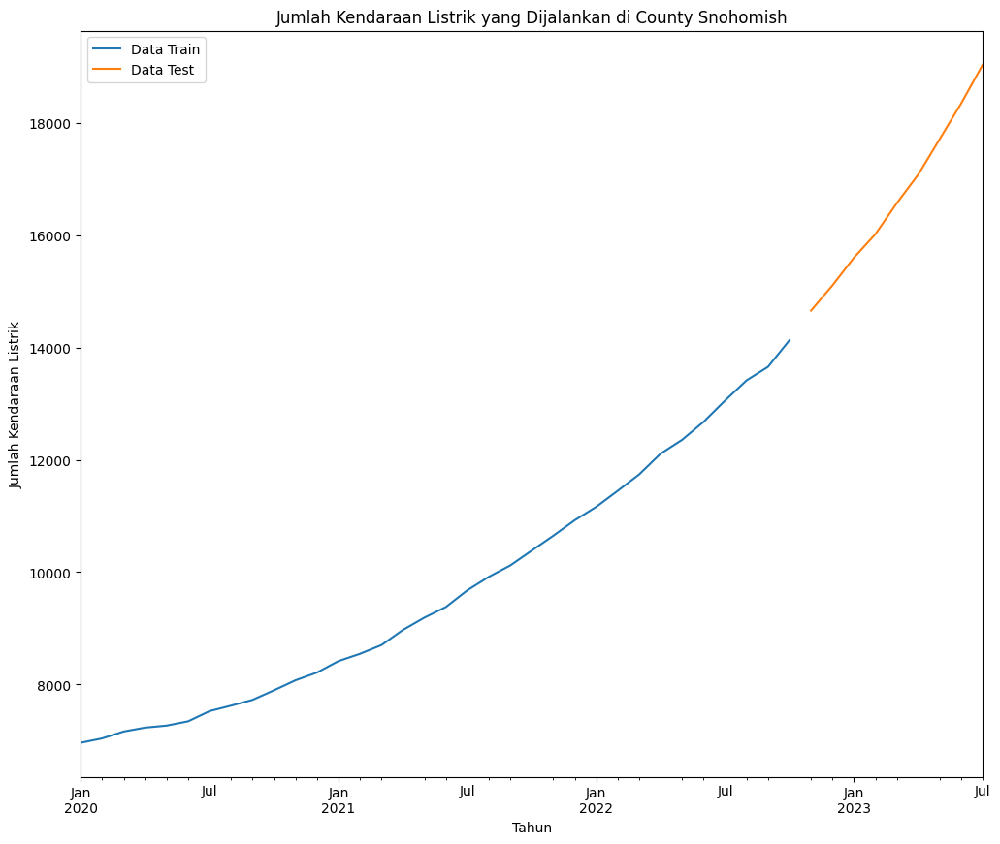

In [ ]:
plot_train_test_split(train_snohomish, test_snohomish, 'Snohomish')

In [ ]:
auto_model = pm.auto_arima(train_snohomish, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   34
Model:             SARIMAX(0, 2, 2)x(2, 0, [], 12)   Log Likelihood                -171.561
Date:                             Fri, 25 Aug 2023   AIC                            353.121
Time:                                     18:21:49   BIC                            360.450
Sample:                                 01-31-2020   HQIC                           355.551
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.1226      0.200     -5.626      0.000      -1.514      -0.731
ma.L2          0.5006      0.192      2.603      0.009       0.124       0.878
ar.S.L12       0.1786      0.143      1.253      0.210      -0.101       0.458
ar.S.L24       0.4742      0.393      1.207      0.227      -0.296       1.244
sigma2      1937.4065    784.646      2.469      0.014     399.529    3475.284
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 0.21
Prob(Q):                              0.91   Prob(JB):                         0.90
Heteroskedasticity (H):               1.22   Skew:                             0.08
Prob(H) (two-sided):                  0.75   Kurtosis:                         2.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
model = SARIMAX(train_snohomish, order = (0, 2, 2), seasonal_order = (2, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   34
Model:             SARIMAX(0, 2, 2)x(2, 0, [], 12)   Log Likelihood                 -41.093
Date:                             Fri, 25 Aug 2023   AIC                             92.185
Time:                                     18:21:55   BIC                             92.582
Sample:                                 01-31-2020   HQIC                            89.506
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.8607      0.536     -3.474      0.001      -2.911      -0.811
ma.L2          1.0000      2.147      0.466      0.641      -3.209       5.209
ar.S.L12       0.4583      0.306      1.499      0.134      -0.141       1.058
ar.S.L24       0.6008      0.309      1.946      0.052      -0.004       1.206
sigma2       871.7908      0.003   3.12e+05      0.000     871.785     871.796
===================================================================================
Ljung-Box (L1) (Q):                   3.77   Jarque-Bera (JB):                 0.58
Prob(Q):                              0.05   Prob(JB):                         0.75
Heteroskedasticity (H):               4.13   Skew:                            -0.63
Prob(H) (two-sided):                  0.27   Kurtosis:                         2.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.34e+21. Standard errors may be unstable.
"""

ValueError: ignored

<Figure size 1200x1000 with 0 Axes>

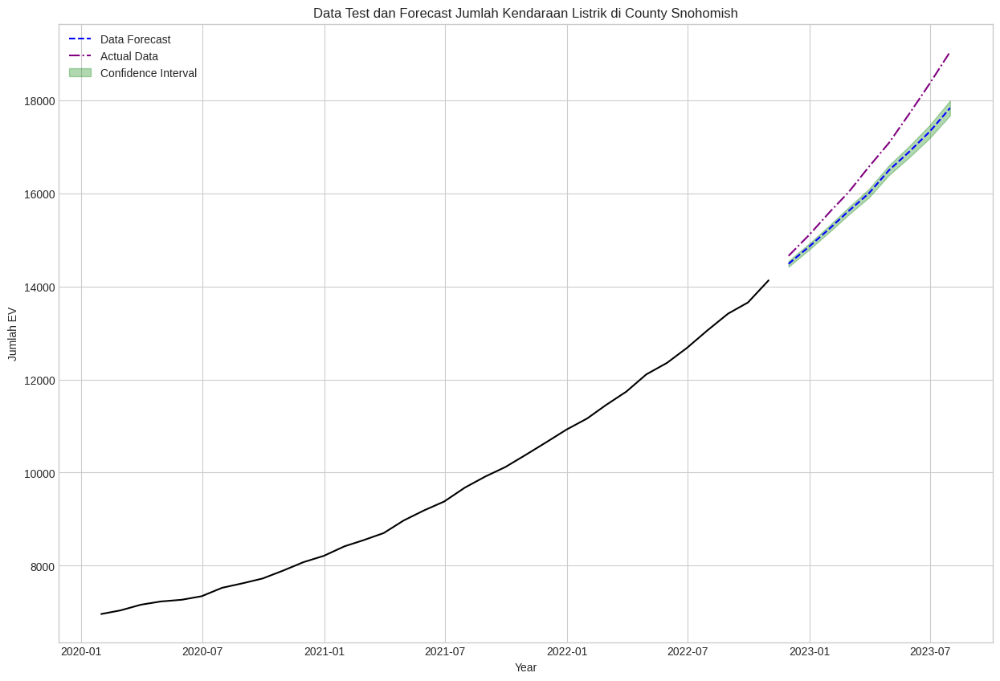


Mean Absolute Percentage Error: 0.034503954520701846

Mean Squared Error: 470623.97872810747

Root Mean Squared Error: 686.0203923558742

R-squared: 0.7620281671429404


In [ ]:
df_snohomish_forecast = get_forecast(model, train_snohomish, test_snohomish, 'Snohomish', plot = True)

### **Prediksi Masa Depan**

#### ***Fit Model***

In [ ]:
model = SARIMAX(snohomish, order = (0, 2, 2), seasonal_order = (2, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   43
Model:             SARIMAX(0, 2, 2)x(2, 0, [], 12)   Log Likelihood                 -96.802
Date:                             Fri, 25 Aug 2023   AIC                            203.605
Time:                                     18:32:00   BIC                            207.771
Sample:                                 01-31-2020   HQIC                           204.019
                                      - 07-31-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7737      0.416     -1.861      0.063      -1.588       0.041
ma.L2          0.2198      0.337      0.651      0.515      -0.442       0.881
ar.S.L12       0.3797      0.449      0.845      0.398      -0.501       1.261
ar.S.L24       0.8083      0.387      2.091      0.037       0.051       1.566
sigma2      4912.1150   2381.808      2.062      0.039     243.858    9580.372
===================================================================================
Ljung-Box (L1) (Q):                   0.85   Jarque-Bera (JB):                 0.73
Prob(Q):                              0.36   Prob(JB):                         0.69
Heteroskedasticity (H):               5.11   Skew:                             0.01
Prob(H) (two-sided):                  0.07   Kurtosis:                         1.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

ValueError: ignored

<Figure size 1200x1000 with 0 Axes>

#### **Plot**

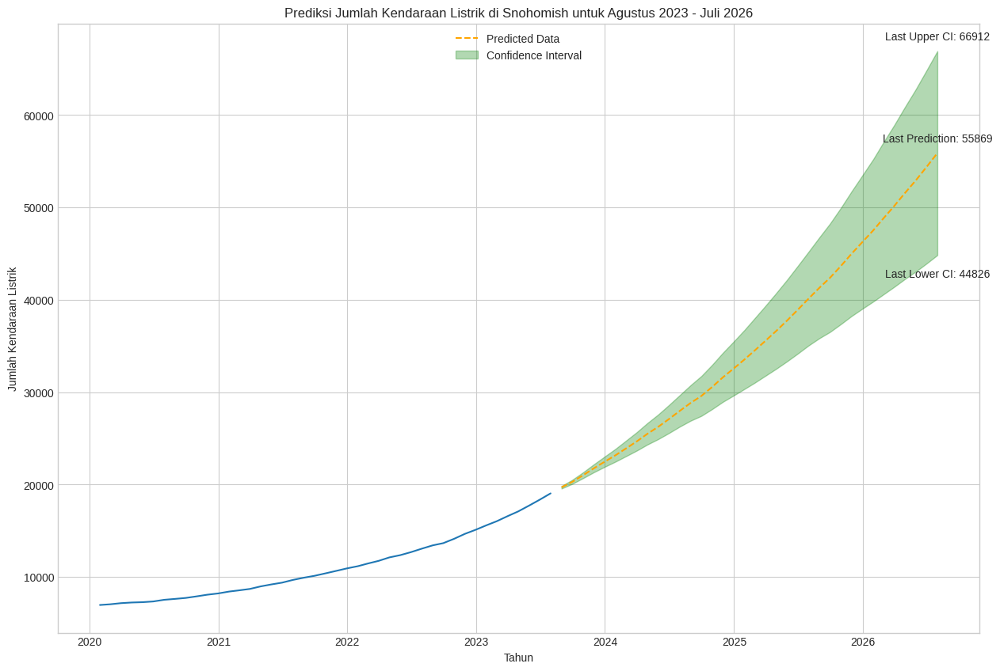

In [ ]:
df_snohomish_preds = get_prediction(model, snohomish['Jumlah EV'], test_snohomish, 'Snohomish', plot = True)

#### ***Saving Prediction***

In [ ]:
county_information['Snohomish']['Predictions'] = df_snohomish_preds

## ***County* Pierce**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Pierce']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,0.0
2010-05-31,0.0
2010-06-30,0.0
...,...
2023-03-31,11279.0
2023-04-30,11689.0
2023-05-31,12118.0


In [ ]:
pierce = county_dfs['Pierce'].copy()
pierce.reset_index(inplace=True)
mask = pierce['DOL Transaction Date'] >= '2020-01-31'
pierce = pierce[mask]

pierce.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_pierce, test_pierce = train_test_split_ts(county_information['Pierce']['df'], 0.80, 0.20)

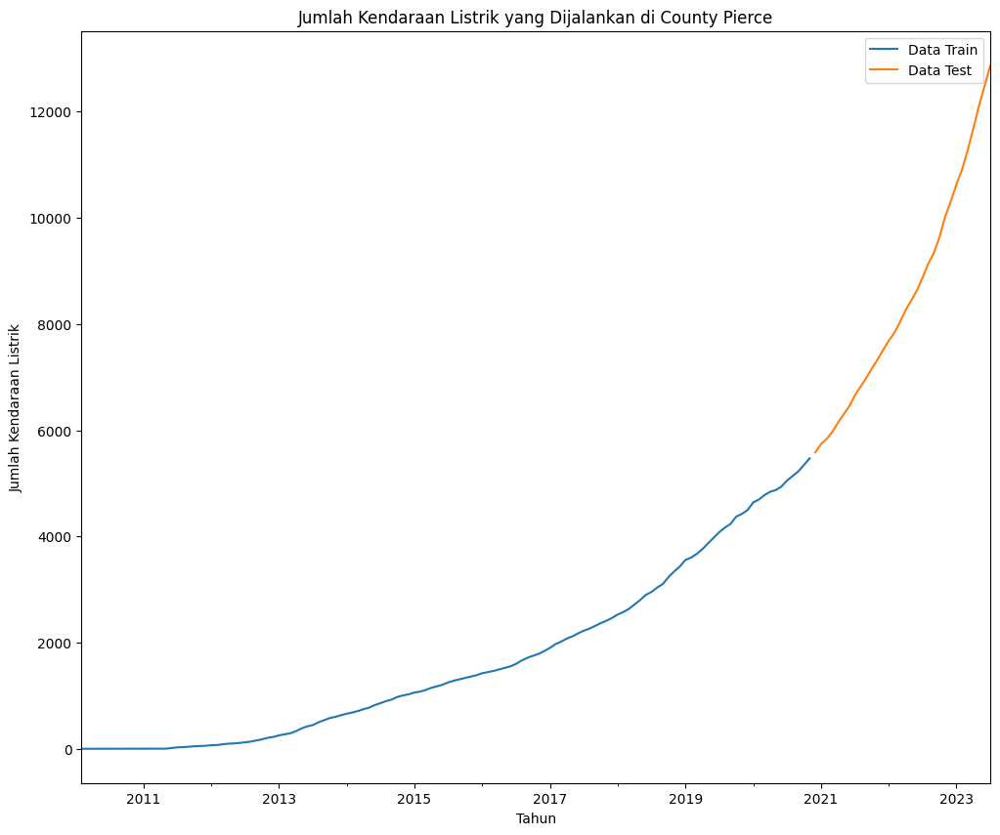

In [ ]:
plot_train_test_split(train_pierce, test_pierce, 'Pierce')

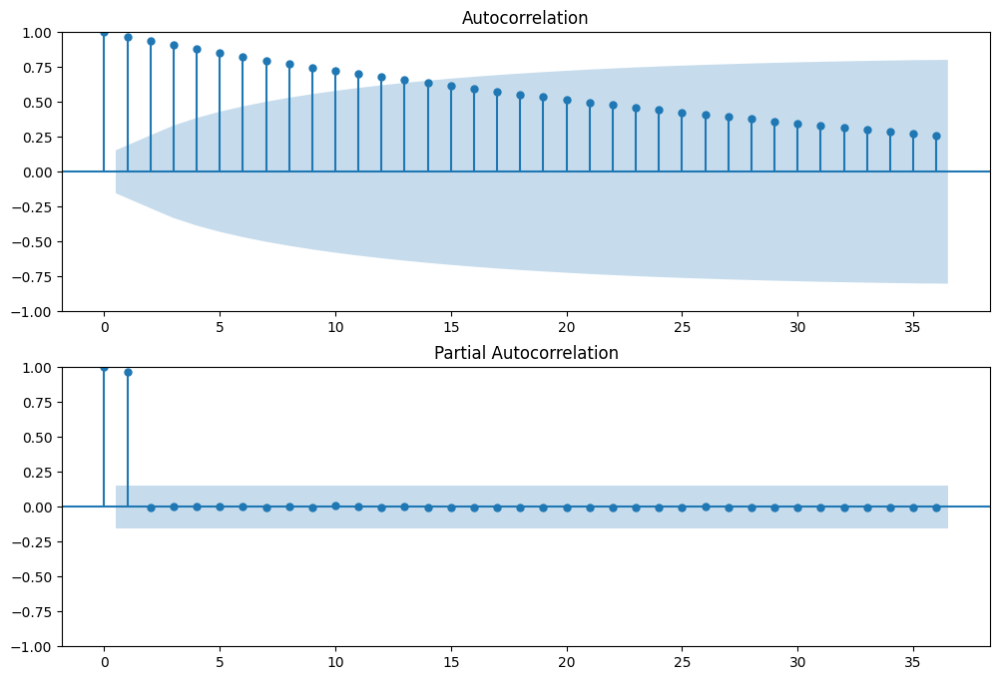

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Pierce']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Pierce']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_pierce, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  130
Model:             SARIMAX(1, 2, 2)x(0, 0, [1], 12)   Log Likelihood                -539.936
Date:                              Fri, 25 Aug 2023   AIC                           1091.872
Time:                                      19:04:30   BIC                           1108.984
Sample:                                  02-28-2010   HQIC                          1098.825
                                       - 11-30-2020                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.4320      0.849      1.686      0.092      -0.232       3.096
ar.L1         -0.7531      0.133     -5.656      0.000      -1.014      -0.492
ma.L1          0.1178      0.126      0.932      0.352      -0.130       0.366
ma.L2         -0.6943      0.073     -9.544      0.000      -0.837      -0.552
ma.S.L12       0.2721      0.076      3.595      0.000       0.124       0.420
sigma2       266.3303     20.987     12.690      0.000     225.197     307.464
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                51.46
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):              13.54   Skew:                             0.05
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                            Jumlah EV   No. Observations:                  130
Model:             SARIMAX(1, 2, 2)x(0, 0, [1], 12)   Log Likelihood                -484.550
Date:                              Fri, 25 Aug 2023   AIC                            979.100
Time:                                      19:04:39   BIC                            992.736
Sample:                                  02-28-2010   HQIC                           984.633
                                       - 11-30-2020                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7398      0.165     -4.479      0.000      -1.064      -0.416
ma.L1          0.1539      0.165      0.934      0.350      -0.169       0.477
ma.L2         -0.6398      0.088     -7.271      0.000      -0.812      -0.467
ma.S.L12       0.3154      0.091      3.480      0.001       0.138       0.493
sigma2       306.5332     27.691     11.070      0.000     252.260     360.807
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):                29.28
Prob(Q):                              0.63   Prob(JB):                         0.00
Heteroskedasticity (H):               7.92   Skew:                            -0.01
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

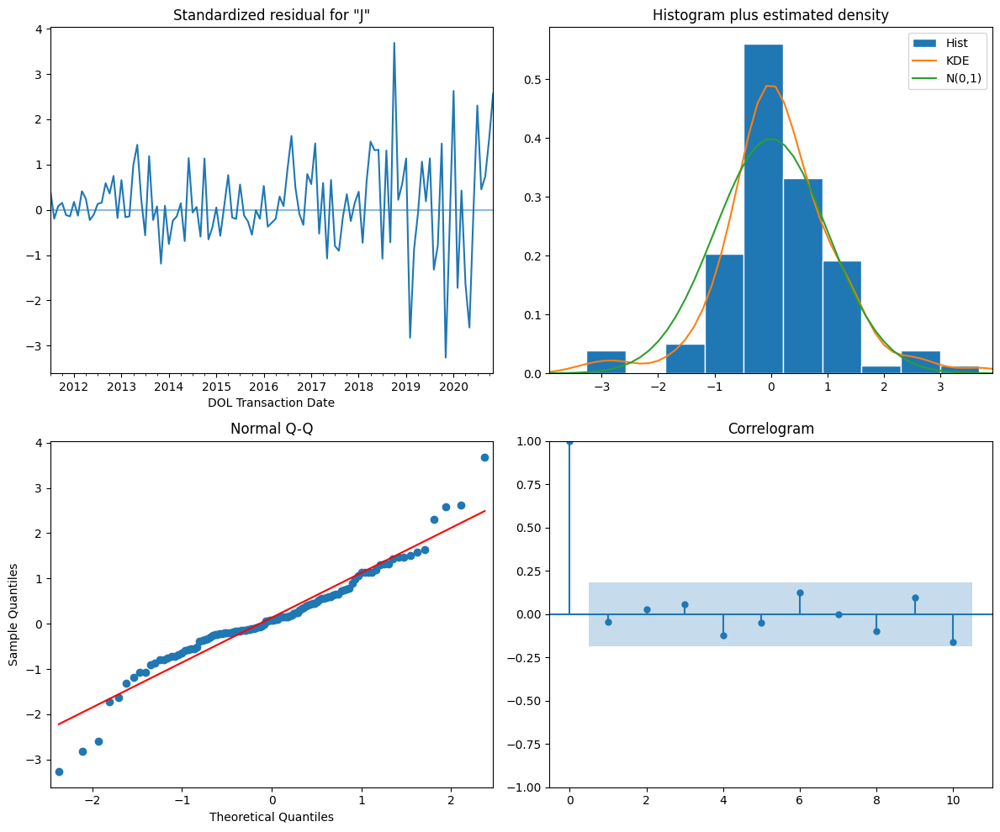

In [ ]:
model = SARIMAX(train_pierce, order = (1, 2, 2), seasonal_order = (0, 0, 1, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

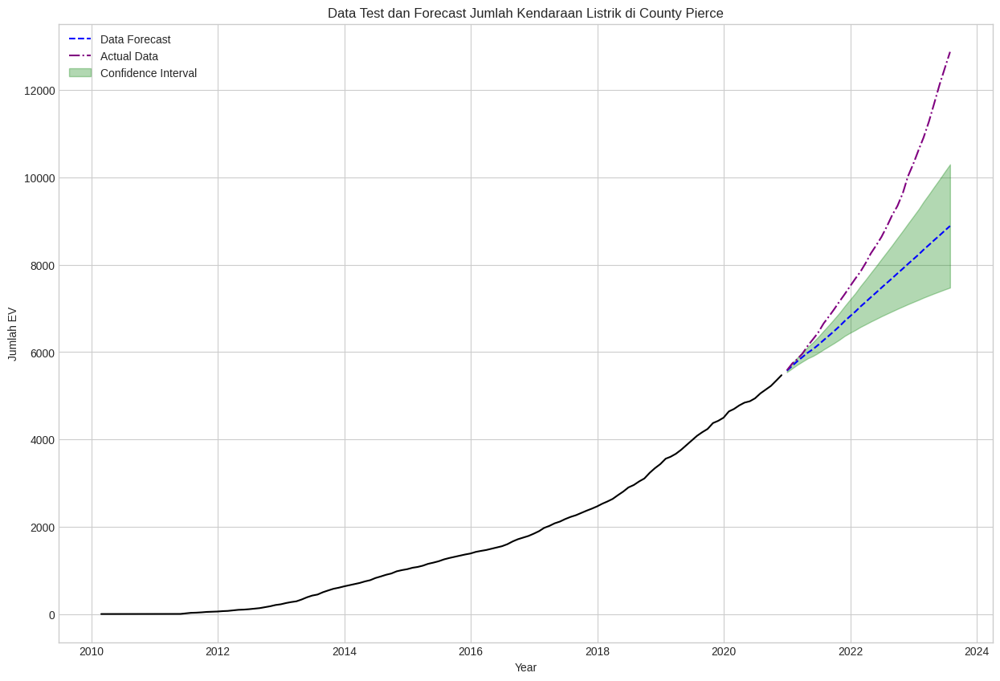


Mean Absolute Percentage Error: 0.1317337592944826

Mean Squared Error: 3035717.625288219

Root Mean Squared Error: 1742.3310894569433

R-squared: 0.32056266262923594


In [ ]:
df_pierce_forecast = get_forecast(model, train_pierce, test_pierce, 'Pierce', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_pierce, test_pierce = train_test_split_ts(pierce, 0.80, 0.20)

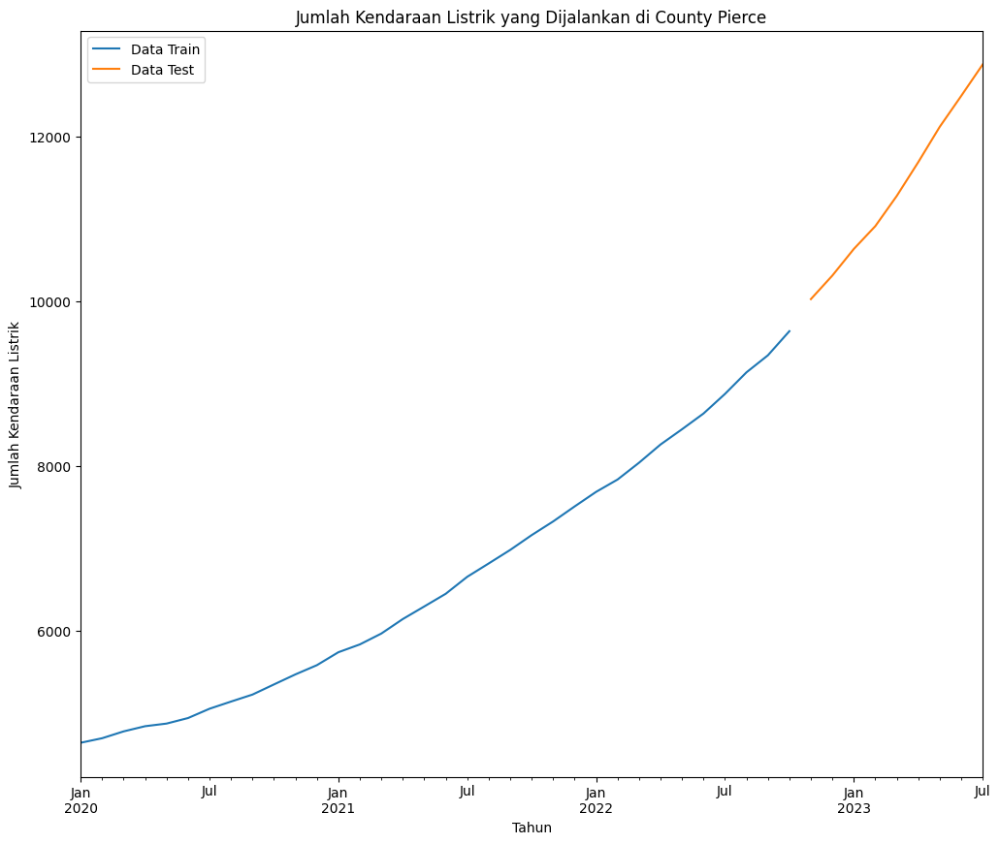

In [ ]:
plot_train_test_split(train_pierce, test_pierce, 'Pierce')

In [ ]:
auto_model = pm.auto_arima(train_pierce, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -147.014
Date:                Fri, 25 Aug 2023   AIC                            302.028
Time:                        19:06:21   BIC                            307.891
Sample:                    01-31-2020   HQIC                           303.972
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     15.2621      4.372      3.491      0.000       6.693      23.831
ar.L1         -0.6795      0.127     -5.356      0.000      -0.928      -0.431
ar.L2         -0.7074      0.192     -3.678      0.000      -1.084      -0.330
sigma2       544.3928    152.743      3.564      0.000     245.023     843.763
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):                 0.10
Prob(Q):                              0.61   Prob(JB):                         0.95
Heteroskedasticity (H):               1.90   Skew:                            -0.09
Prob(H) (two-sided):                  0.30   Kurtosis:                         2.79
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -142.703
Date:                Fri, 25 Aug 2023   AIC                            291.406
Time:                        19:06:27   BIC                            295.610
Sample:                    01-31-2020   HQIC                           292.751
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5928      0.148     -4.004      0.000      -0.883      -0.303
ar.L2         -0.6142      0.225     -2.727      0.006      -1.056      -0.173
sigma2       792.8681    230.653      3.437      0.001     340.797    1244.939
===================================================================================
Ljung-Box (L1) (Q):                   1.21   Jarque-Bera (JB):                 0.08
Prob(Q):                              0.27   Prob(JB):                         0.96
Heteroskedasticity (H):               1.47   Skew:                            -0.08
Prob(H) (two-sided):                  0.55   Kurtosis:                         2.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

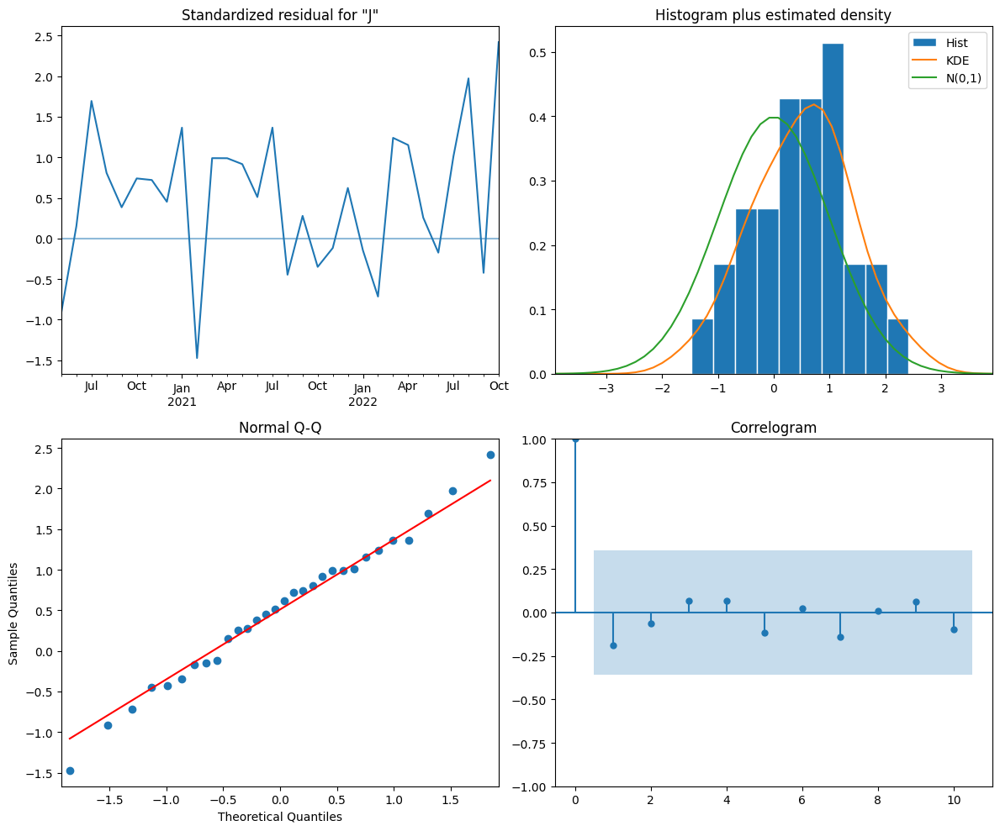

In [ ]:
model = SARIMAX(train_pierce, order = (2, 2, 0),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

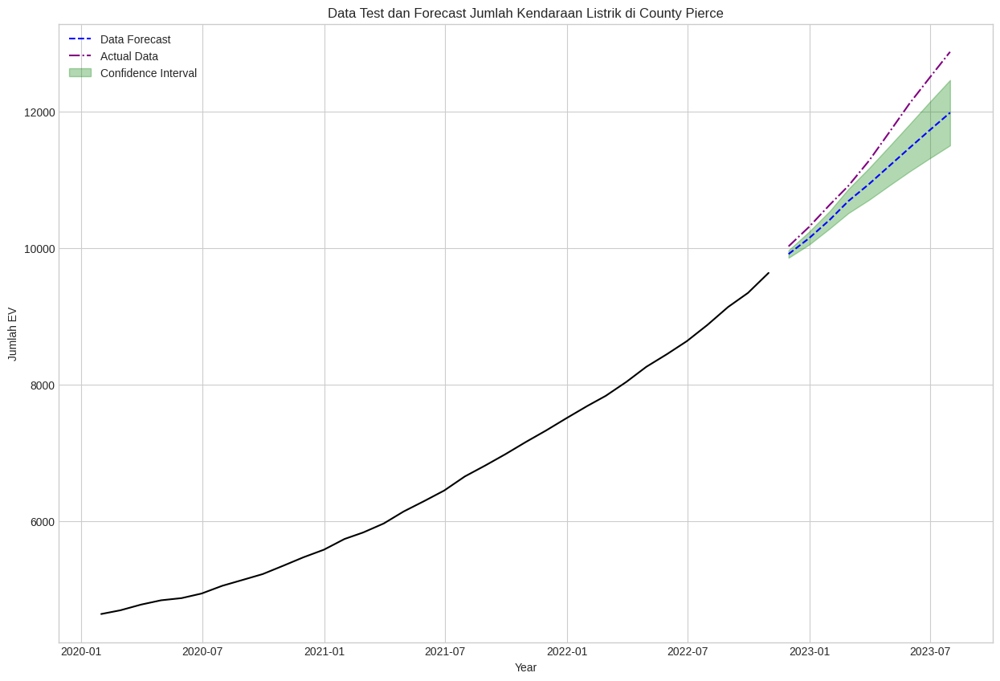


Mean Absolute Percentage Error: 0.0361198146992652

Mean Squared Error: 255835.62251706375

Root Mean Squared Error: 505.8019597797776

R-squared: 0.707481965976287


In [ ]:
df_pierce_forecast = get_forecast(model, train_pierce, test_pierce, 'Pierce', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -199.027
Date:                Fri, 25 Aug 2023   AIC                            404.053
Time:                        19:07:59   BIC                            409.044
Sample:                    01-31-2020   HQIC                           405.844
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3836      0.138     -2.773      0.006      -0.655      -0.112
ar.L2         -0.3559      0.140     -2.543      0.011      -0.630      -0.082
sigma2      1585.4327    370.829      4.275      0.000     858.622    2312.243
===================================================================================
Ljung-Box (L1) (Q):                   1.49   Jarque-Bera (JB):                 0.36
Prob(Q):                              0.22   Prob(JB):                         0.83
Heteroskedasticity (H):               4.25   Skew:                             0.24
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

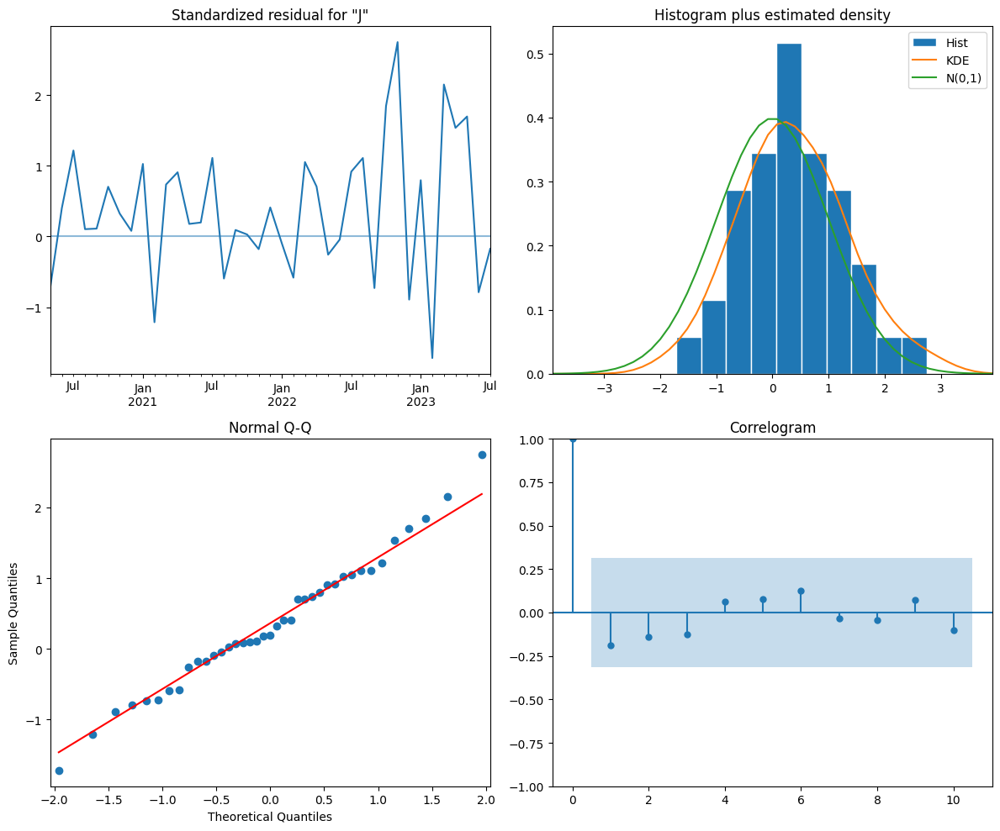

In [ ]:
model = SARIMAX(pierce, order = (2, 2, 0),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

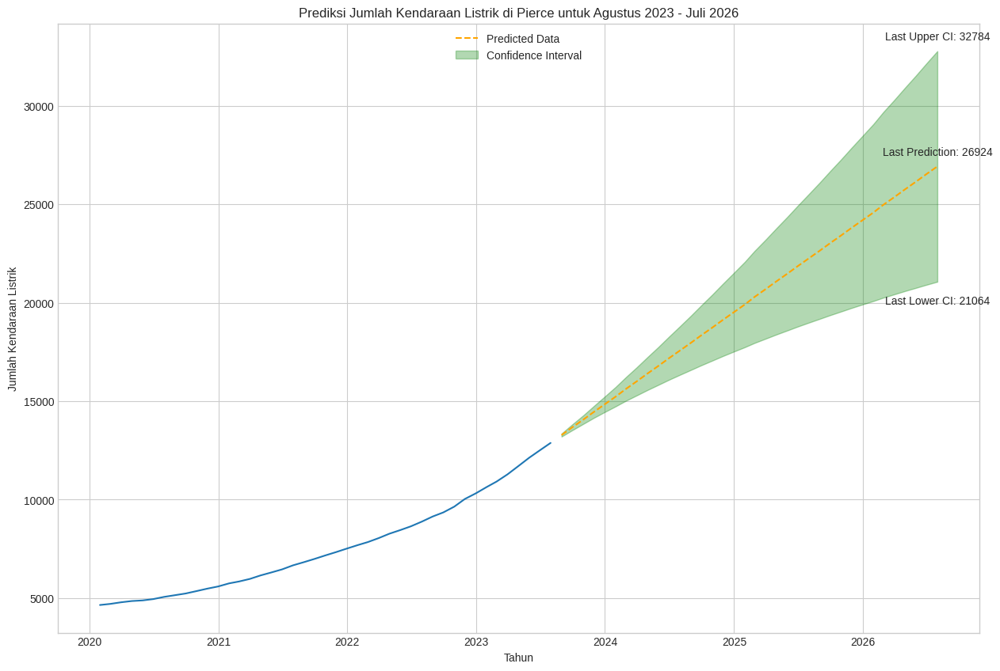

In [ ]:
df_pierce_preds = get_prediction(model, pierce['Jumlah EV'], test_pierce, 'Pierce', plot = True)

In [ ]:
county_information['Pierce']['Predictions'] = df_snohomish_preds

## ***County* Clark**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Clark']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,1.0
2010-04-30,1.0
2010-05-31,1.0
2010-06-30,1.0
...,...
2023-03-31,9305.0
2023-04-30,9589.0
2023-05-31,9896.0


In [ ]:
clark = county_dfs['Clark'].copy()
clark.reset_index(inplace=True)
mask = clark['DOL Transaction Date'] >= '2020-01-31'
clark = clark[mask]

clark.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_clark, test_clark = train_test_split_ts(county_information['Clark']['df'], 0.80, 0.20)

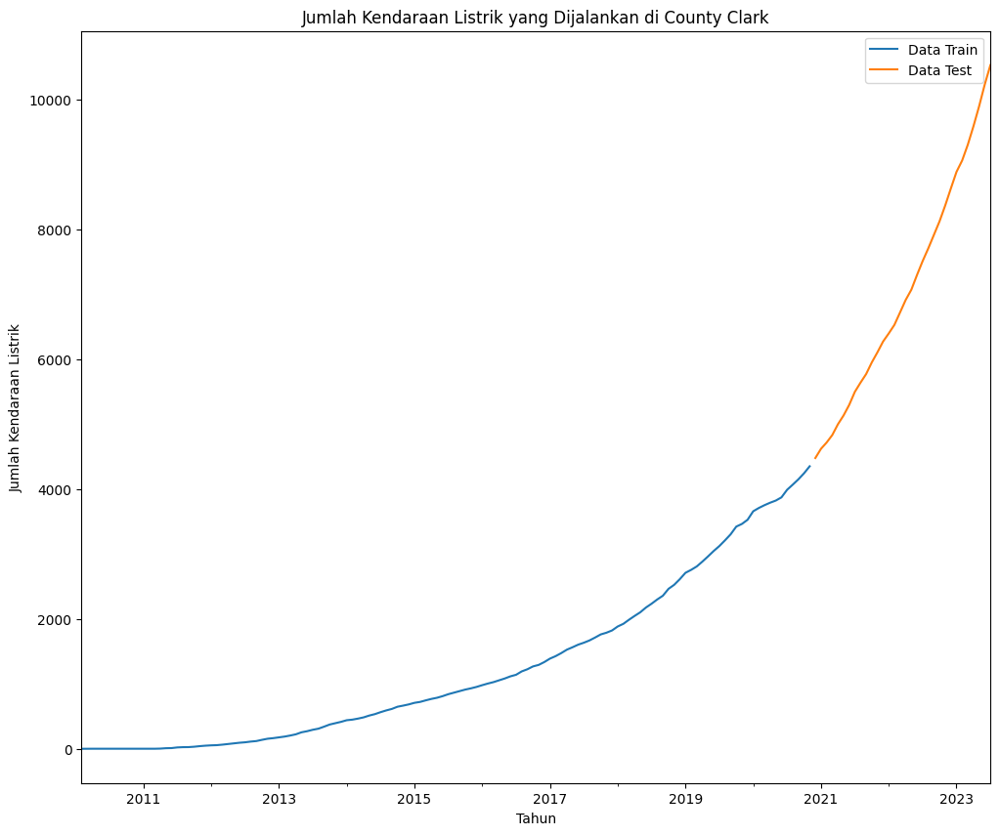

In [ ]:
plot_train_test_split(train_clark, test_clark, 'Clark')

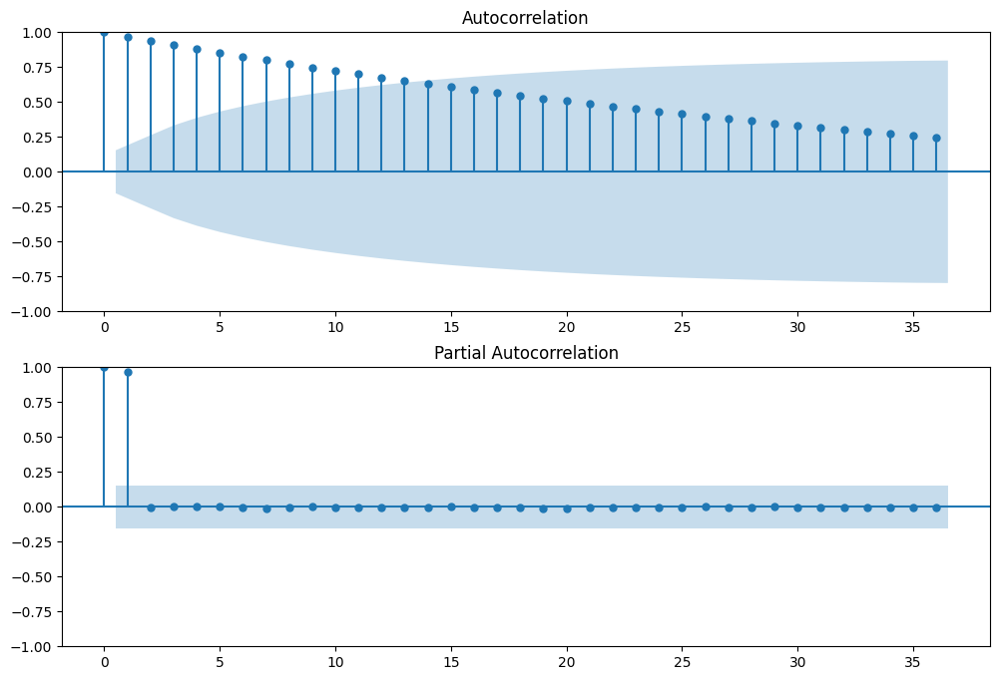

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Clark']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Clark']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_clark, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  130
Model:             SARIMAX(1, 2, 1)x(1, 0, [], 12)   Log Likelihood                -518.259
Date:                             Fri, 25 Aug 2023   AIC                           1046.518
Time:                                     19:42:15   BIC                           1060.778
Sample:                                 02-28-2010   HQIC                          1052.312
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2830      0.072      3.951      0.000       0.143       0.423
ar.L1          0.2898      0.072      4.000      0.000       0.148       0.432
ma.L1         -0.9568      0.030    -31.795      0.000      -1.016      -0.898
ar.S.L12       0.4032      0.071      5.688      0.000       0.264       0.542
sigma2       187.2825     16.226     11.542      0.000     155.480     219.085
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                97.76
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):              25.80   Skew:                             0.86
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                  130
Model:             SARIMAX(1, 2, 1)x(1, 0, [], 12)   Log Likelihood                -472.554
Date:                             Fri, 25 Aug 2023   AIC                            953.107
Time:                                     19:42:20   BIC                            964.087
Sample:                                 02-28-2010   HQIC                           957.564
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1833      0.113      1.626      0.104      -0.038       0.404
ma.L1         -0.8422      0.047    -18.040      0.000      -0.934      -0.751
ar.S.L12       0.4918      0.074      6.641      0.000       0.347       0.637
sigma2       215.8494     18.282     11.807      0.000     180.018     251.681
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                90.54
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):              18.57   Skew:                             0.64
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

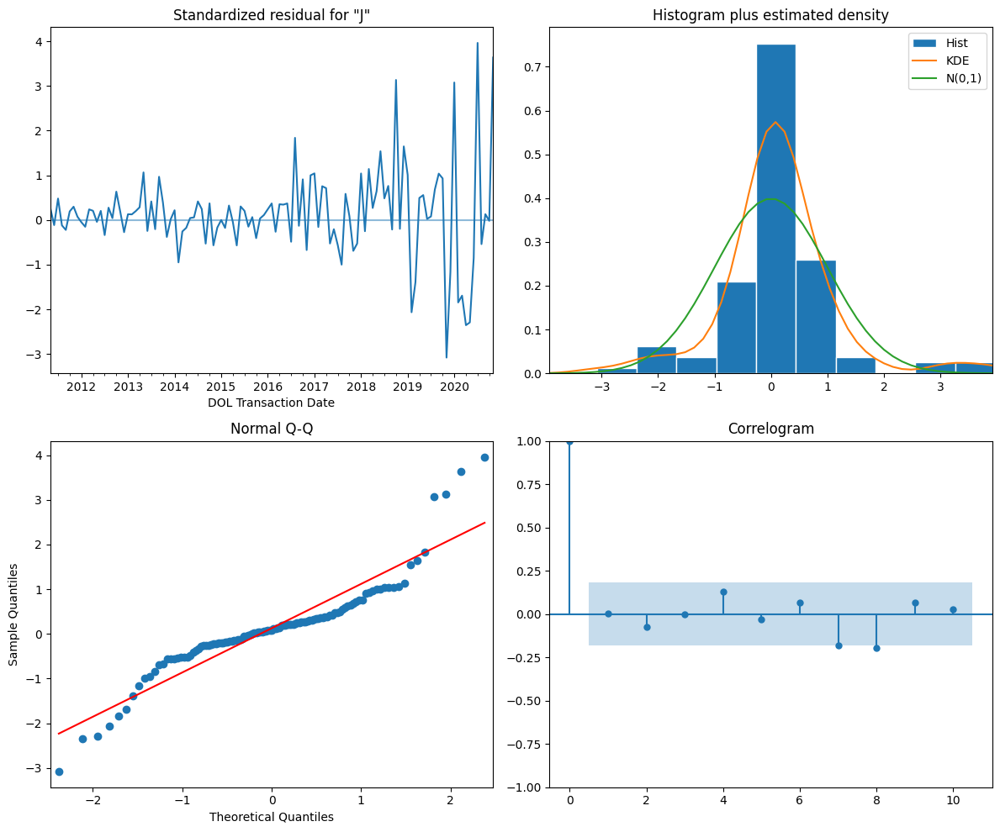

In [ ]:
model = SARIMAX(train_clark, order = (1, 2, 1), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

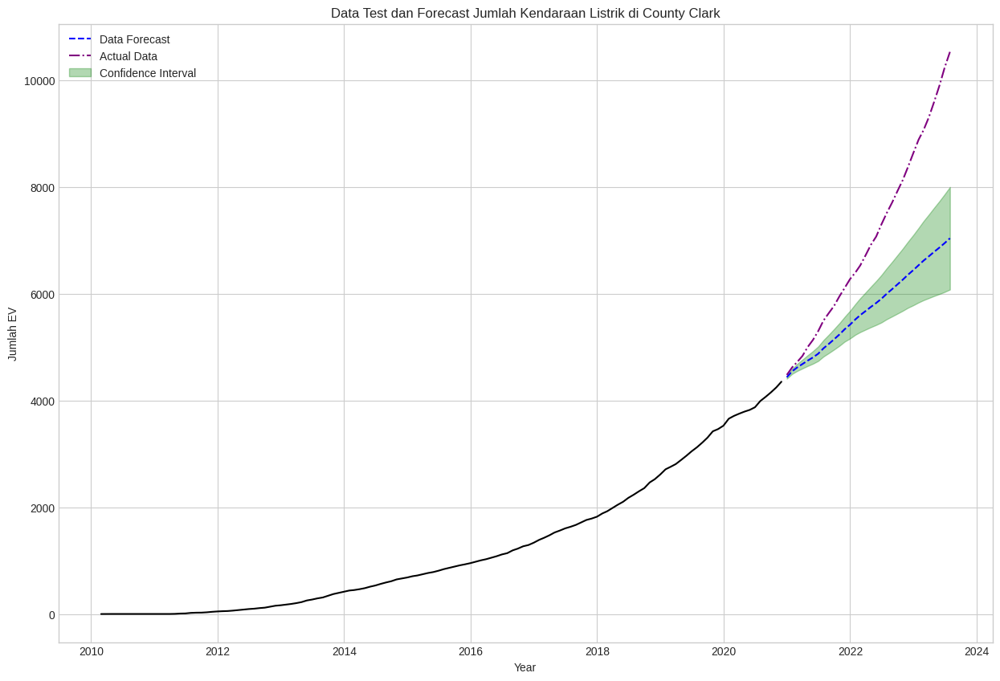


Mean Absolute Percentage Error: 0.16729033779917613

Mean Squared Error: 2794525.444902896

Root Mean Squared Error: 1671.6834164706236

R-squared: 0.10122202082907361


In [ ]:
df_clark_forecast = get_forecast(model, train_clark, test_clark, 'Clark', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_clark, test_clark = train_test_split_ts(clark, 0.80, 0.20)

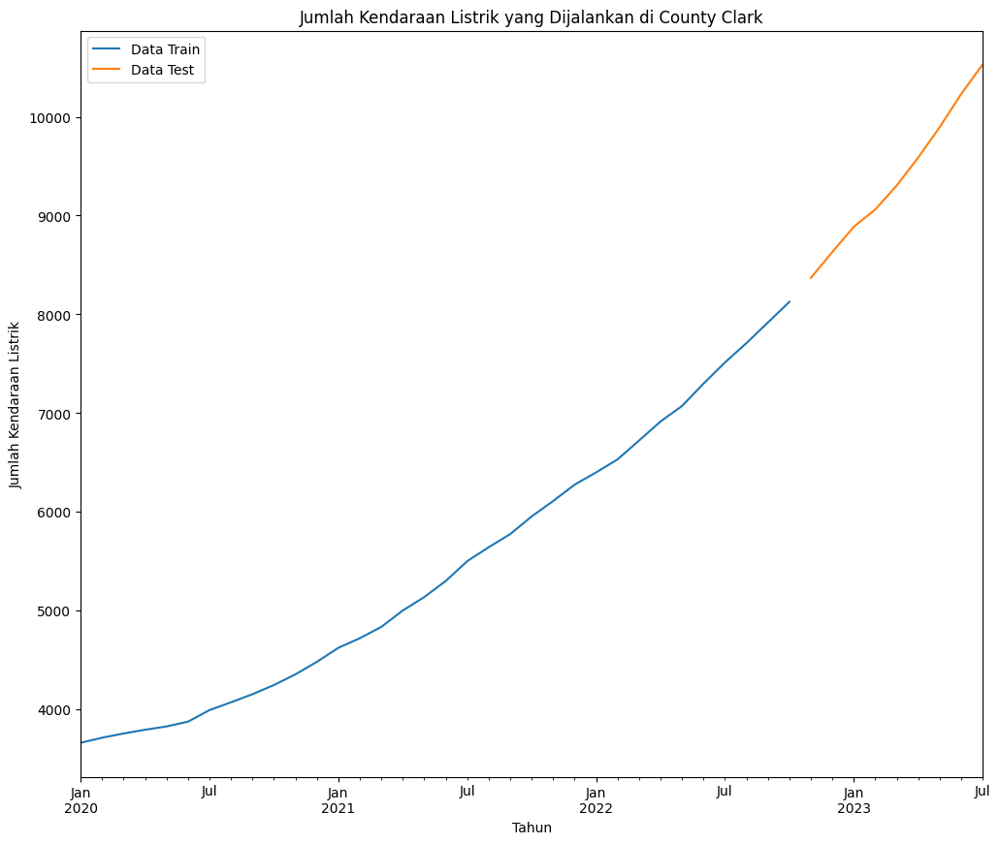

In [ ]:
plot_train_test_split(train_clark, test_clark, 'Clark')

In [ ]:
auto_model = pm.auto_arima(train_clark, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -150.155
Date:                Fri, 25 Aug 2023   AIC                            306.310
Time:                        19:43:38   BIC                            310.707
Sample:                    01-31-2020   HQIC                           307.768
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      5.2853      0.910      5.805      0.000       3.501       7.070
ma.L1         -0.8286      0.104     -7.929      0.000      -1.033      -0.624
sigma2       671.1752    182.912      3.669      0.000     312.674    1029.676
===================================================================================
Ljung-Box (L1) (Q):                   0.31   Jarque-Bera (JB):                 0.25
Prob(Q):                              0.58   Prob(JB):                         0.88
Heteroskedasticity (H):               1.41   Skew:                             0.15
Prob(H) (two-sided):                  0.58   Kurtosis:                         2.69
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -144.925
Date:                Fri, 25 Aug 2023   AIC                            293.850
Time:                        19:43:42   BIC                            296.653
Sample:                    01-31-2020   HQIC                           294.747
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4948      0.196     -2.523      0.012      -0.879      -0.110
sigma2       919.1475    245.742      3.740      0.000     437.502    1400.793
===================================================================================
Ljung-Box (L1) (Q):                   0.59   Jarque-Bera (JB):                 0.76
Prob(Q):                              0.44   Prob(JB):                         0.68
Heteroskedasticity (H):               1.08   Skew:                             0.27
Prob(H) (two-sided):                  0.90   Kurtosis:                         2.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

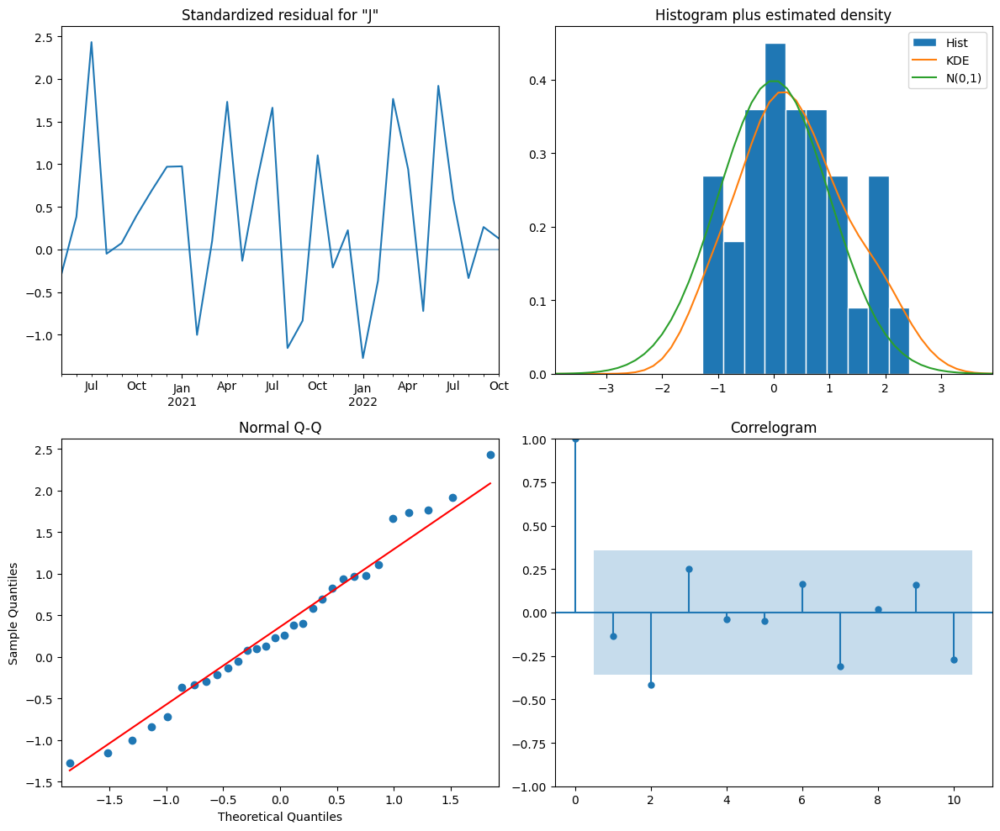

In [ ]:
model = SARIMAX(train_clark, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

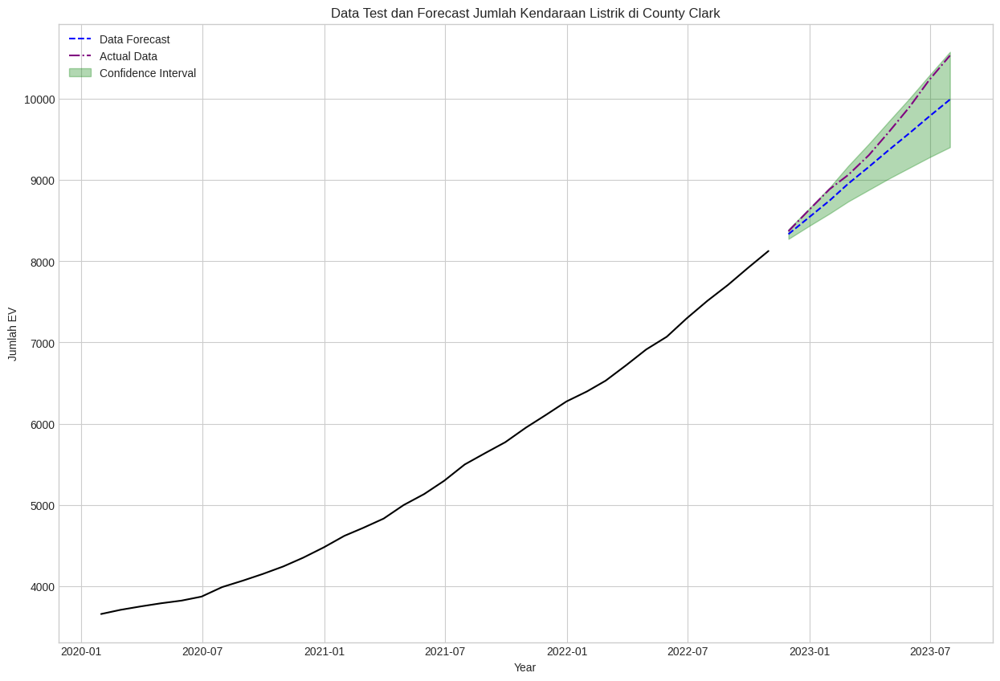


Mean Absolute Percentage Error: 0.023186308879907122

Mean Squared Error: 78694.79298330103

Root Mean Squared Error: 280.5259221236088

R-squared: 0.835014284290971


In [ ]:
df_clark_forecast = get_forecast(model, train_clark, test_clark, 'Clark', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -193.028
Date:                Fri, 25 Aug 2023   AIC                            390.055
Time:                        19:44:44   BIC                            393.383
Sample:                    01-31-2020   HQIC                           391.249
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4241      0.160     -2.655      0.008      -0.737      -0.111
sigma2      1165.4466    302.466      3.853      0.000     572.624    1758.270
===================================================================================
Ljung-Box (L1) (Q):                   0.20   Jarque-Bera (JB):                 0.90
Prob(Q):                              0.66   Prob(JB):                         0.64
Heteroskedasticity (H):               1.56   Skew:                            -0.37
Prob(H) (two-sided):                  0.43   Kurtosis:                         2.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

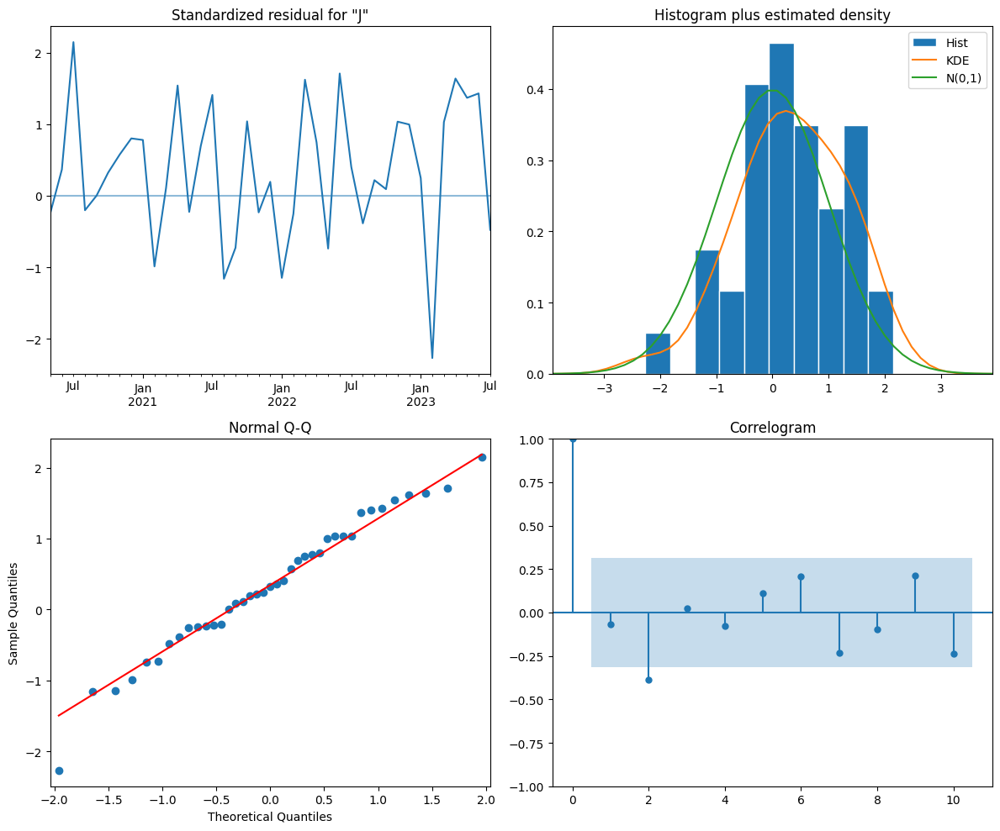

In [ ]:
model = SARIMAX(clark, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

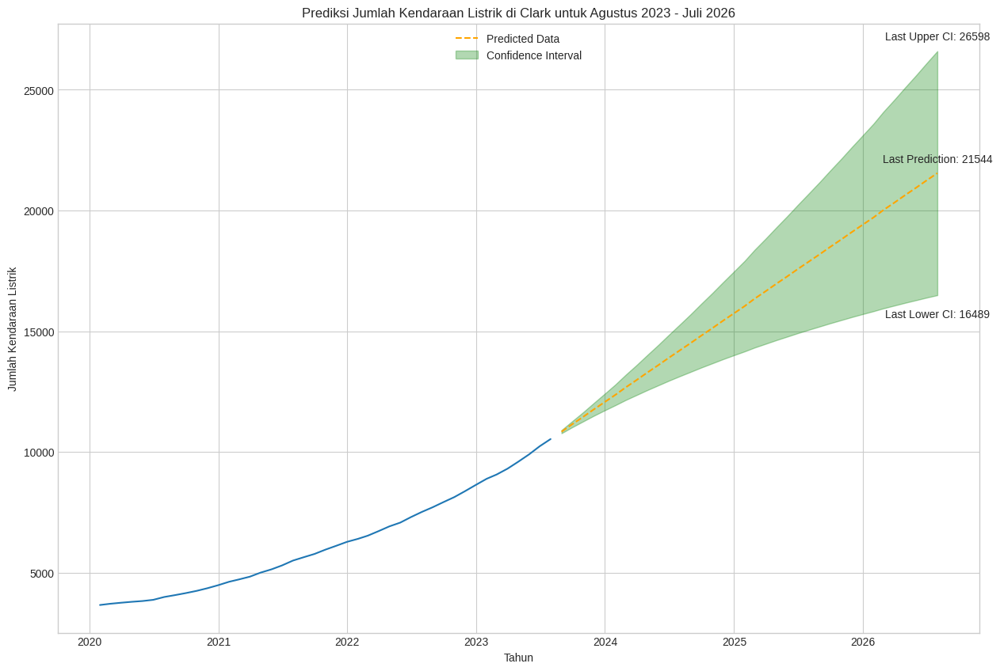

In [ ]:
df_clark_preds = get_prediction(model, clark['Jumlah EV'], test_clark, 'Clark', plot = True)

In [ ]:
county_information['Clark']['Predictions'] = df_clark_preds

## ***County* Thurston**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Thurston']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,0.0
2010-05-31,1.0
2010-06-30,1.0
...,...
2023-03-31,4970.0
2023-04-30,5114.0
2023-05-31,5260.0


In [ ]:
thurston = county_dfs['Thurston'].copy()
thurston.reset_index(inplace=True)
mask = thurston['DOL Transaction Date'] >= '2020-01-31'
thurston = thurston[mask]

thurston.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_thurston, test_thurston = train_test_split_ts(county_information['Thurston']['df'], 0.80, 0.20)

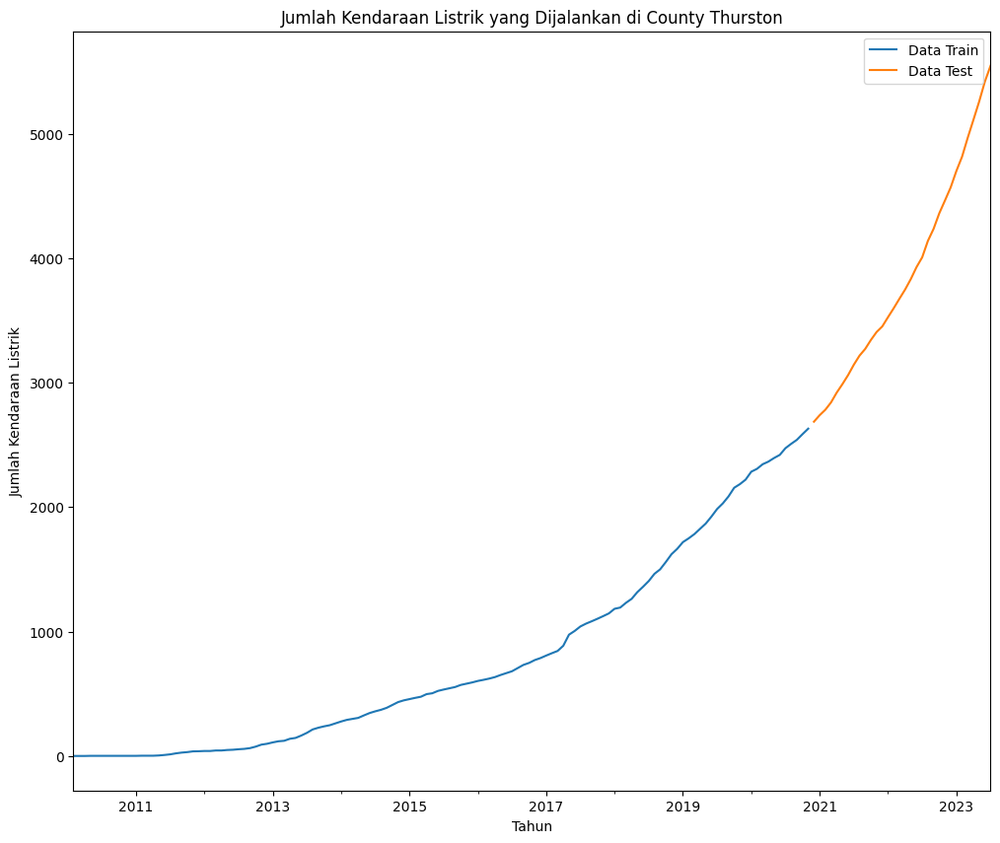

In [ ]:
plot_train_test_split(train_thurston, test_thurston, 'Thurston')

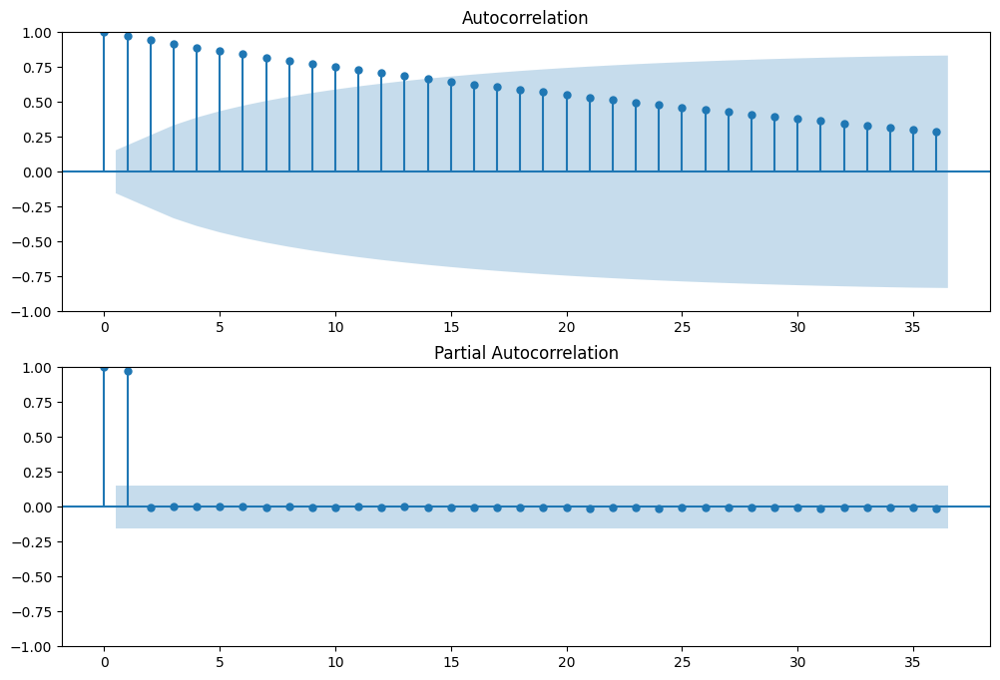

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Thurston']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Thurston']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_thurston, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  130
Model:             SARIMAX(0, 2, 1)x(1, 0, [], 12)   Log Likelihood                -482.512
Date:                             Fri, 25 Aug 2023   AIC                            971.024
Time:                                     09:50:57   BIC                            979.580
Sample:                                 02-28-2010   HQIC                           974.501
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7002      0.048    -14.556      0.000      -0.794      -0.606
ar.S.L12       0.1690      0.075      2.266      0.023       0.023       0.315
sigma2       109.2175      6.718     16.259      0.000      96.051     122.384
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):               436.31
Prob(Q):                              0.63   Prob(JB):                         0.00
Heteroskedasticity (H):              13.96   Skew:                             1.38
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                  130
Model:             SARIMAX(0, 2, 1)x(1, 0, [], 12)   Log Likelihood                -442.812
Date:                             Fri, 25 Aug 2023   AIC                            891.624
Time:                                     19:46:23   BIC                            899.885
Sample:                                 02-28-2010   HQIC                           894.978
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7016      0.053    -13.189      0.000      -0.806      -0.597
ar.S.L12       0.1878      0.084      2.223      0.026       0.022       0.353
sigma2       120.4280      8.226     14.640      0.000     104.305     136.551
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):               302.63
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):               6.64   Skew:                             1.29
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

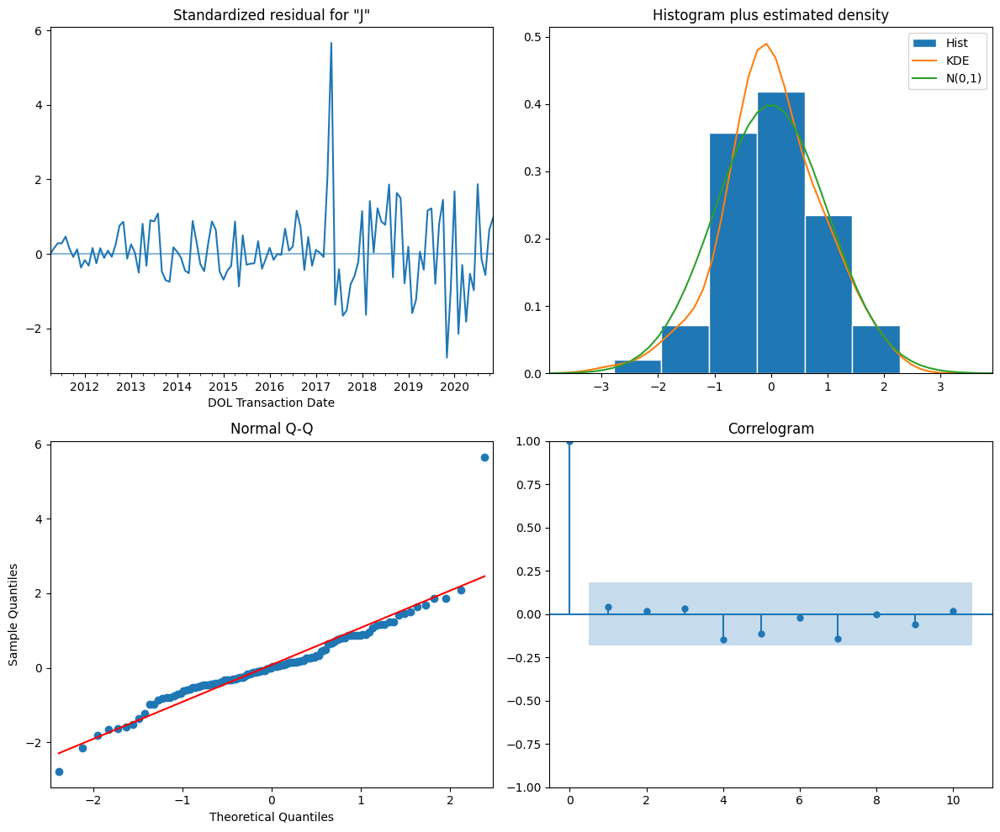

In [ ]:
model = SARIMAX(train_thurston, order = (0, 2, 1), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

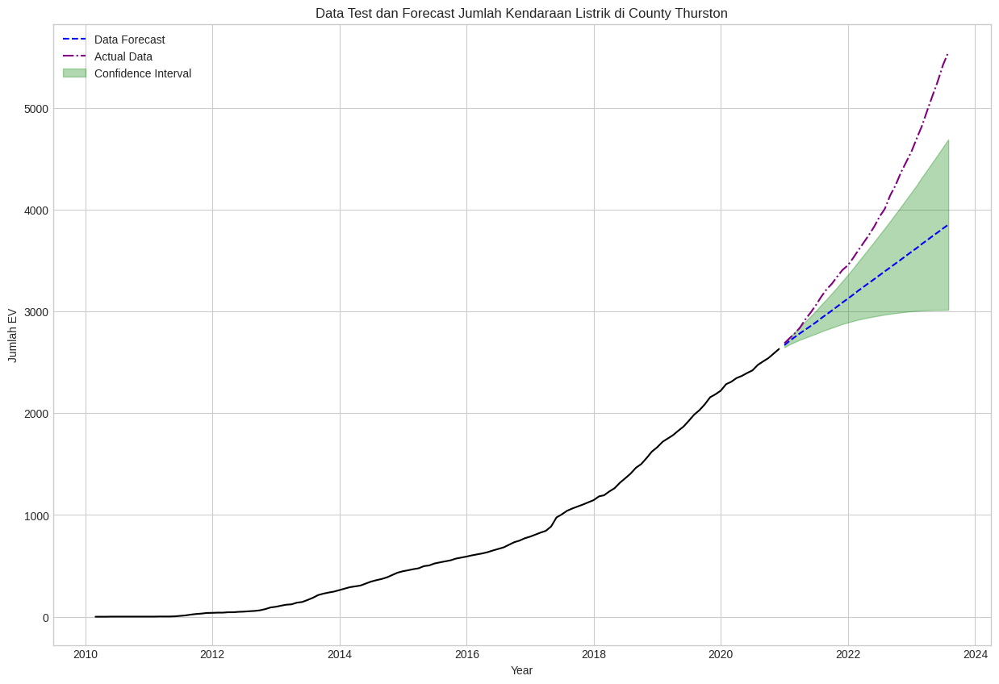


Mean Absolute Percentage Error: 0.13816395292108716

Mean Squared Error: 609168.1808653686

Root Mean Squared Error: 780.4922682931385

R-squared: 0.12495745736319219


In [ ]:
df_thurston_forecast = get_forecast(model, train_thurston, test_thurston, 'Thurston', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_thurston, test_thurston = train_test_split_ts(thurston, 0.80, 0.20)

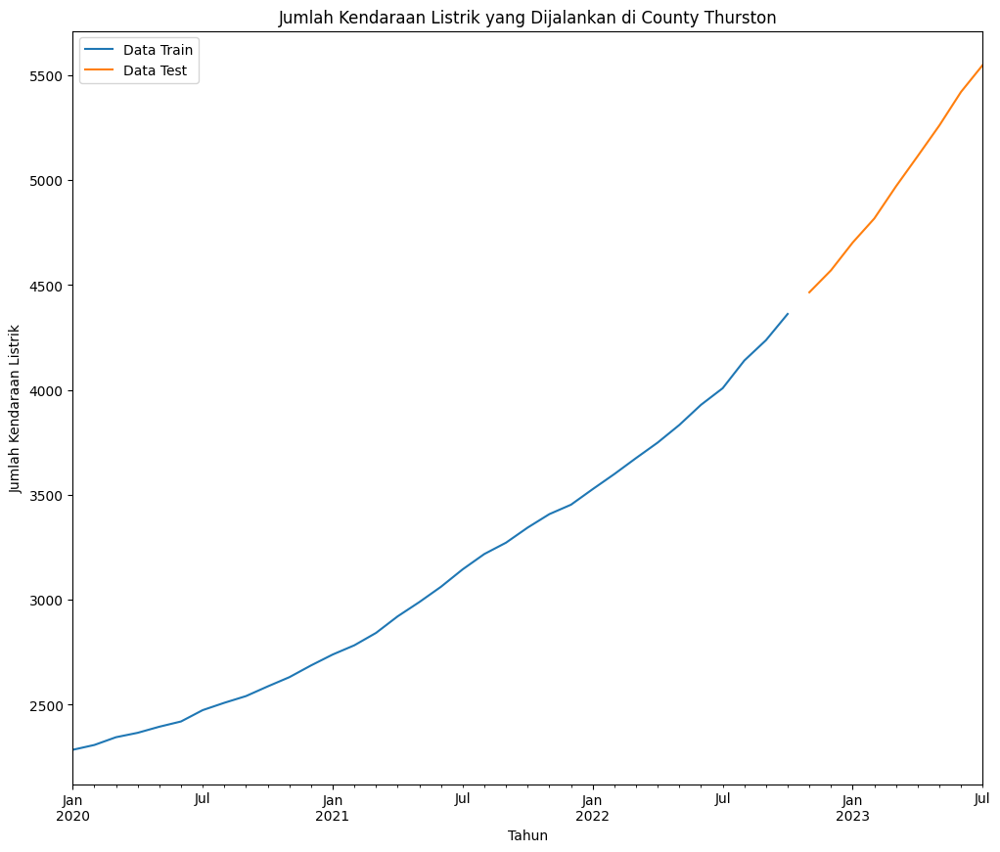

In [ ]:
plot_train_test_split(train_thurston, test_thurston, 'Thurston')

In [ ]:
auto_model = pm.auto_arima(train_thurston, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -128.258
Date:                Fri, 25 Aug 2023   AIC                            264.515
Time:                        09:51:09   BIC                            270.378
Sample:                    01-31-2020   HQIC                           266.459
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      6.1450      3.207      1.916      0.055      -0.141      12.431
ar.L1         -0.8111      0.305     -2.663      0.008      -1.408      -0.214
ar.L2         -0.3394      0.330     -1.028      0.304      -0.986       0.308
sigma2       173.5791     39.268      4.420      0.000      96.616     250.542
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 2.04
Prob(Q):                              0.81   Prob(JB):                         0.36
Heteroskedasticity (H):               2.33   Skew:                             0.37
Prob(H) (two-sided):                  0.18   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -123.066
Date:                Fri, 25 Aug 2023   AIC                            252.132
Time:                        19:47:31   BIC                            256.335
Sample:                    01-31-2020   HQIC                           253.476
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6977      0.297     -2.352      0.019      -1.279      -0.116
ar.L2         -0.2016      0.285     -0.706      0.480      -0.761       0.358
sigma2       214.1138     46.921      4.563      0.000     122.150     306.078
===================================================================================
Ljung-Box (L1) (Q):                   0.71   Jarque-Bera (JB):                 2.10
Prob(Q):                              0.40   Prob(JB):                         0.35
Heteroskedasticity (H):               2.41   Skew:                             0.38
Prob(H) (two-sided):                  0.18   Kurtosis:                         4.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

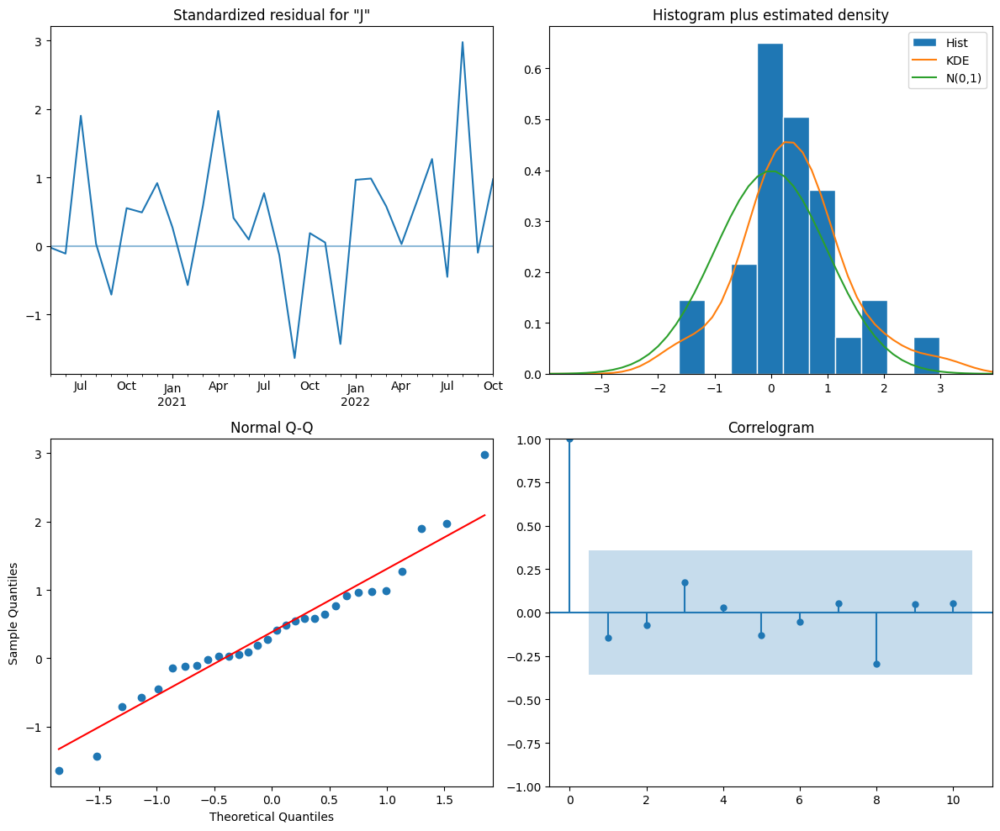

In [ ]:
model = SARIMAX(train_thurston, order = (2, 2, 0),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

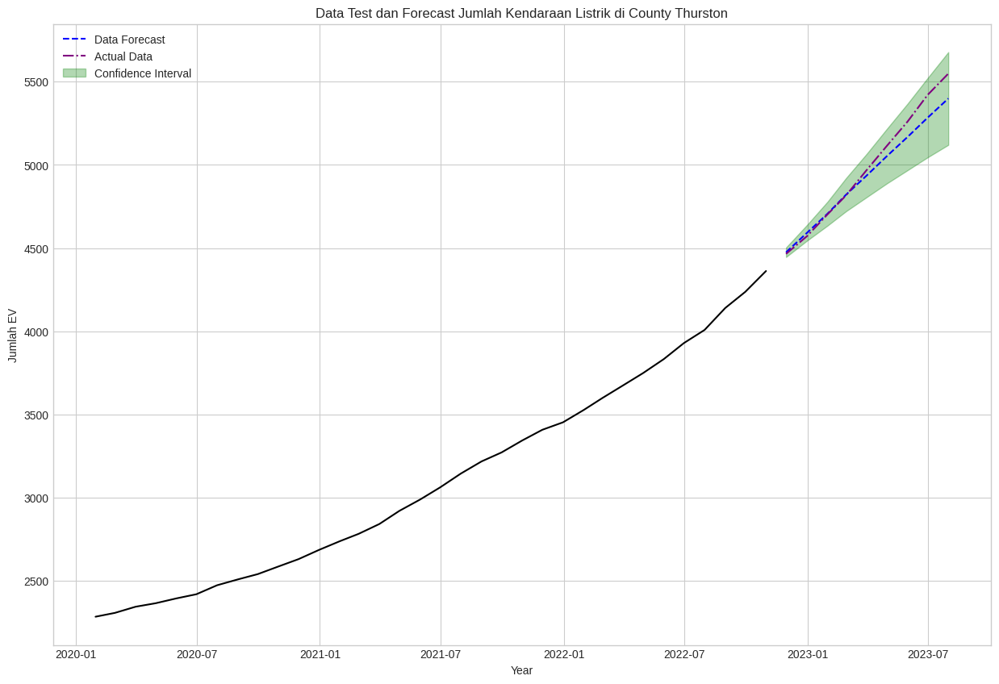


Mean Absolute Percentage Error: 0.010754101411773128

Mean Squared Error: 6118.102921225692

Root Mean Squared Error: 78.21830298098835

R-squared: 0.9521034881758056


In [ ]:
df_thurston_forecast = get_forecast(model, train_thurston, test_thurston, 'Thurston', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(2, 2, 0)   Log Likelihood                -161.477
Date:                Fri, 25 Aug 2023   AIC                            328.954
Time:                        19:48:38   BIC                            333.944
Sample:                    01-31-2020   HQIC                           330.744
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7202      0.247     -2.911      0.004      -1.205      -0.235
ar.L2         -0.2021      0.218     -0.927      0.354      -0.629       0.225
sigma2       231.1308     50.845      4.546      0.000     131.477     330.785
===================================================================================
Ljung-Box (L1) (Q):                   0.70   Jarque-Bera (JB):                 0.51
Prob(Q):                              0.40   Prob(JB):                         0.77
Heteroskedasticity (H):               2.08   Skew:                             0.21
Prob(H) (two-sided):                  0.20   Kurtosis:                         3.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

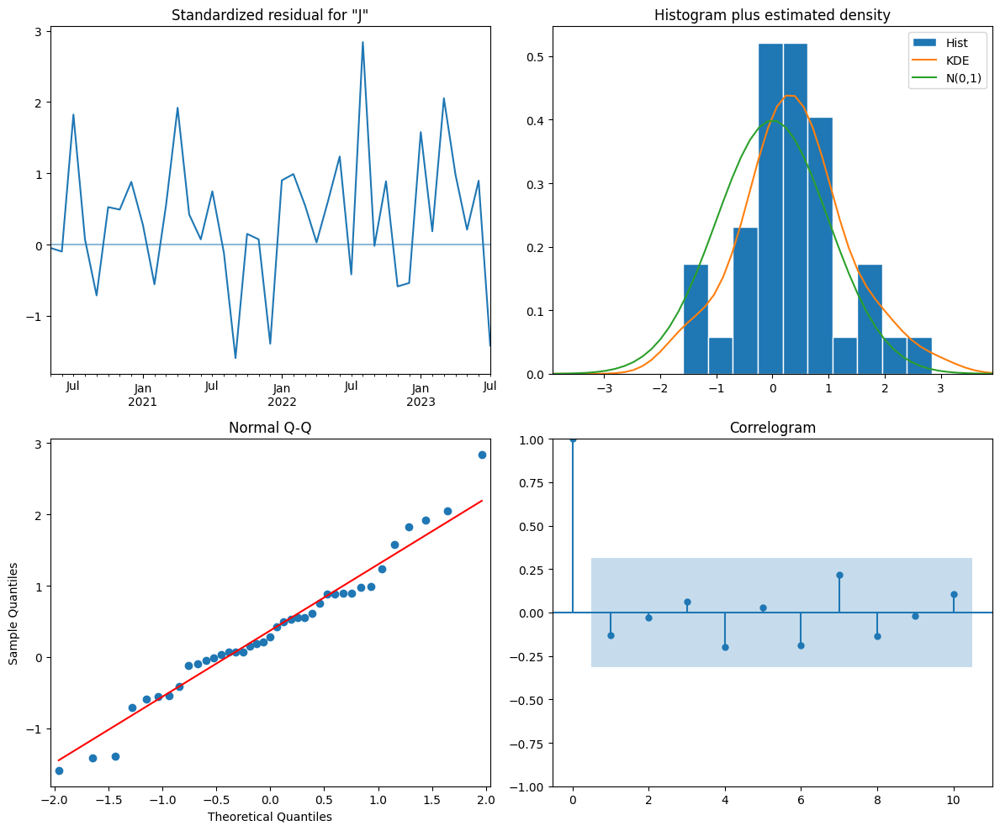

In [ ]:
model = SARIMAX(thurston, order = (2, 2, 0),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

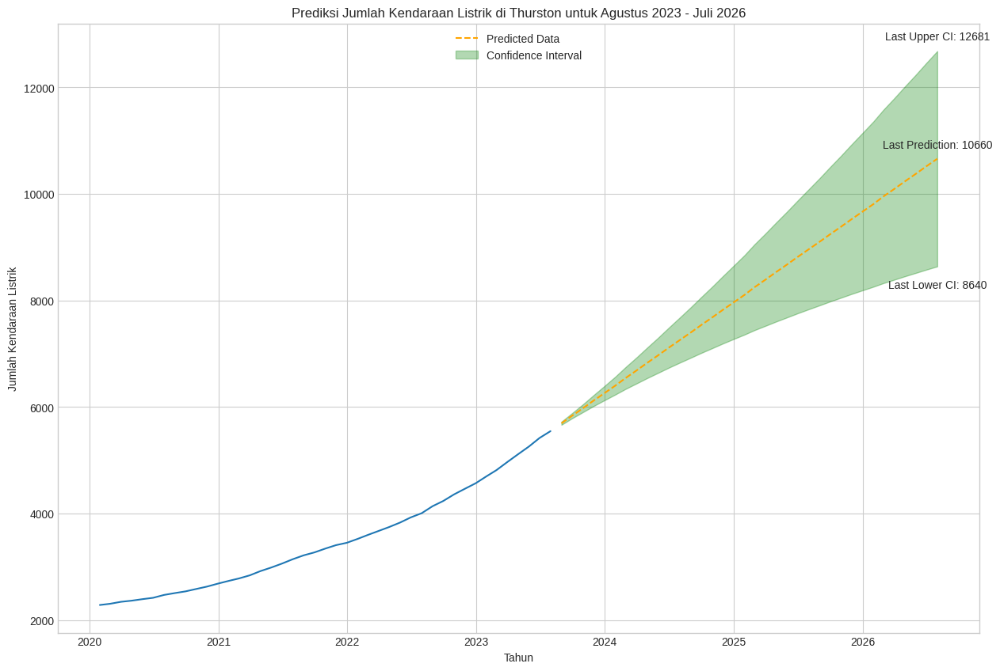

In [ ]:
df_thurston_preds = get_prediction(model, thurston['Jumlah EV'], test_thurston, 'Thurston', plot = True)

In [ ]:
county_information['Thurston']['Predictions'] = df_thurston_preds

## ***County* Kitsap**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Kitsap']

,Jumlah EV
DOL Transaction Date,
2010-02-28,1
2010-03-31,1
2010-04-30,1
2010-05-31,1
2010-06-30,1
...,...
2023-03-31,4899
2023-04-30,5025
2023-05-31,5151


In [ ]:
kitsap = county_dfs['Kitsap'].copy()
kitsap.reset_index(inplace=True)
mask = kitsap['DOL Transaction Date'] >= '2020-01-31'
kitsap = kitsap[mask]

kitsap.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_kitsap, test_kitsap = train_test_split_ts(county_information['Kitsap']['df'], 0.80, 0.20)

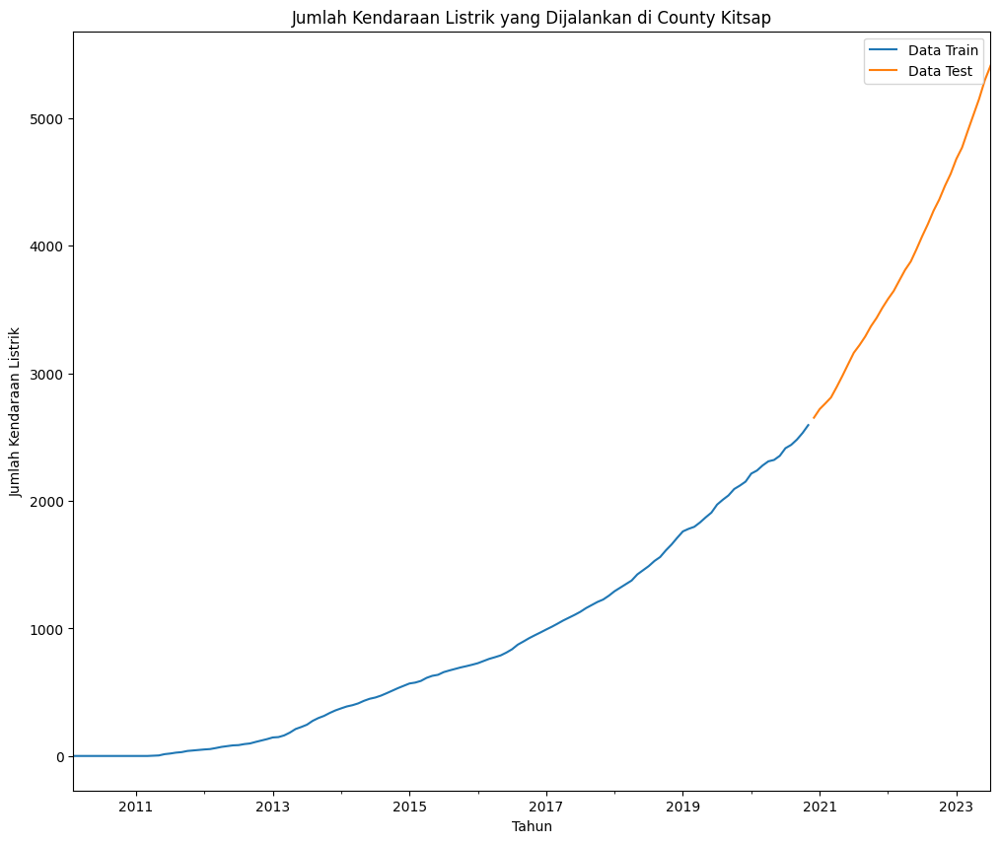

In [ ]:
plot_train_test_split(train_kitsap, test_kitsap, 'Kitsap')

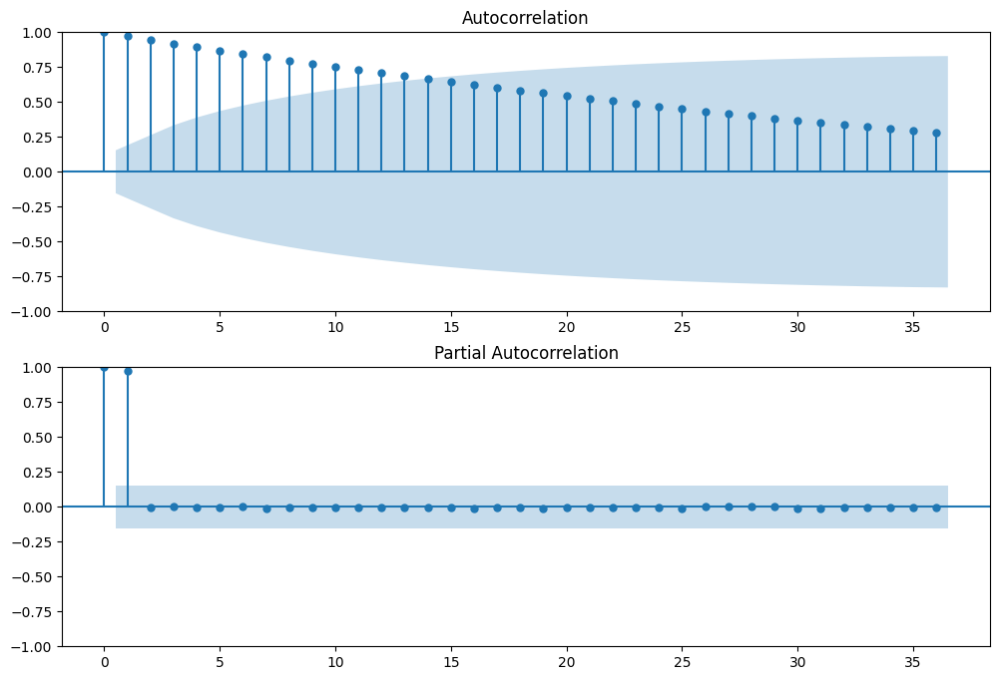

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Kitsap']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Kitsap']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_kitsap, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  130
Model:               SARIMAX(2, 2, 4)   Log Likelihood                -443.412
Date:                Fri, 25 Aug 2023   AIC                            902.825
Time:                        09:52:18   BIC                            925.641
Sample:                    02-28-2010   HQIC                           912.095
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0833      0.362      2.991      0.003       0.374       1.793
ar.L1         -1.0314      0.189     -5.443      0.000      -1.403      -0.660
ar.L2         -0.9520      0.109     -8.758      0.000      -1.165      -0.739
ma.L1          0.3973      0.222      1.793      0.073      -0.037       0.832
ma.L2          0.0006      0.159      0.004      0.997      -0.312       0.313
ma.L3         -0.7626      0.184     -4.155      0.000      -1.122      -0.403
ma.L4         -0.3181      0.103     -3.098      0.002      -0.519      -0.117
sigma2        58.6161      5.846     10.027      0.000      47.158      70.074
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                52.61
Prob(Q):                              0.75   Prob(JB):                         0.00
Heteroskedasticity (H):               6.30   Skew:                             0.80
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                  130
Model:               SARIMAX(2, 2, 4)   Log Likelihood                -431.370
Date:                Fri, 25 Aug 2023   AIC                            876.740
Time:                        19:49:21   BIC                            896.426
Sample:                    02-28-2010   HQIC                           884.737
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1453      0.129     -8.882      0.000      -1.398      -0.893
ar.L2         -0.9679      0.100     -9.727      0.000      -1.163      -0.773
ma.L1          0.6046      0.175      3.461      0.001       0.262       0.947
ma.L2          0.0572      0.147      0.388      0.698      -0.231       0.346
ma.L3         -0.6447      0.162     -3.982      0.000      -0.962      -0.327
ma.L4         -0.1712      0.115     -1.495      0.135      -0.396       0.053
sigma2        64.5216      5.768     11.187      0.000      53.217      75.826
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                54.88
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               6.11   Skew:                             0.64
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.01
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

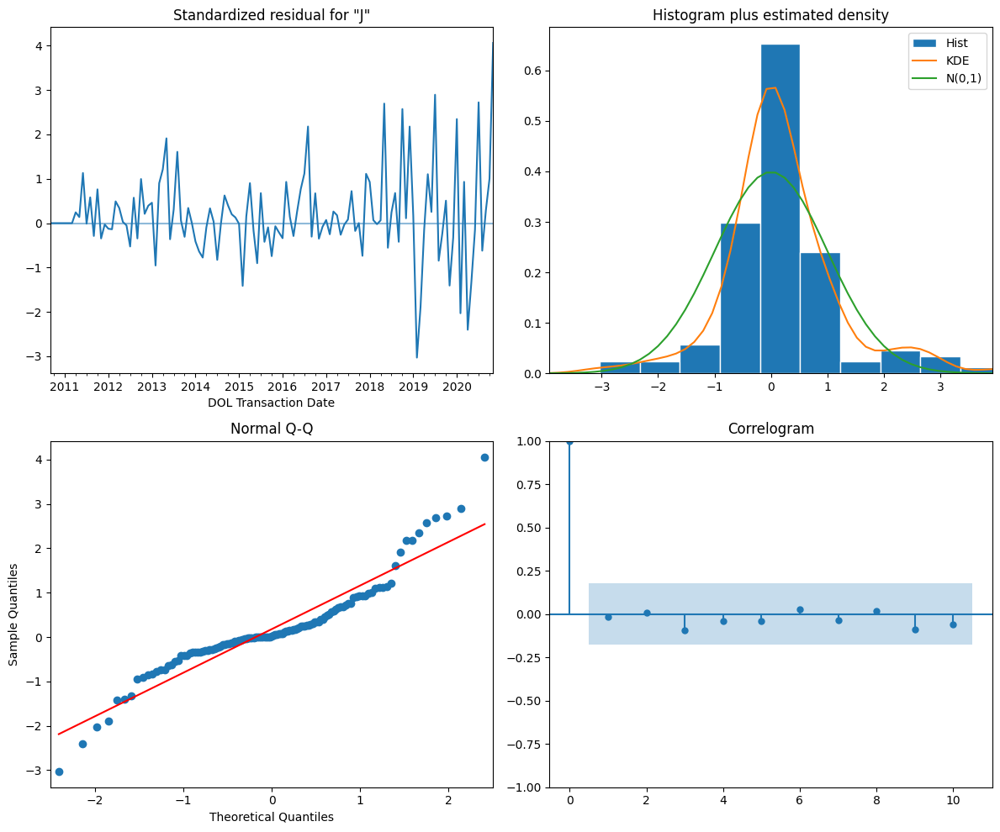

In [ ]:
model = SARIMAX(train_kitsap, order = (2, 2, 4),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

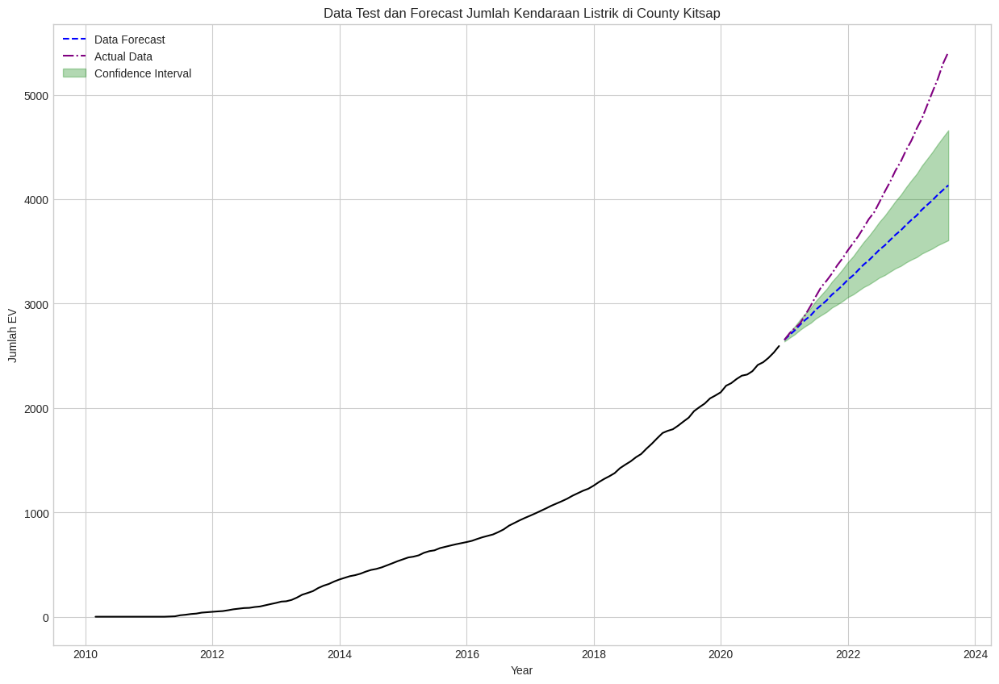


Mean Absolute Percentage Error: 0.1070715374503407

Mean Squared Error: 357051.7742437116

Root Mean Squared Error: 597.5380943870538

R-squared: 0.4511837164041266


In [ ]:
df_kitsap_forecast = get_forecast(model, train_kitsap, test_kitsap, 'Kitsap', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_kitsap, test_kitsap = train_test_split_ts(kitsap, 0.80, 0.20)

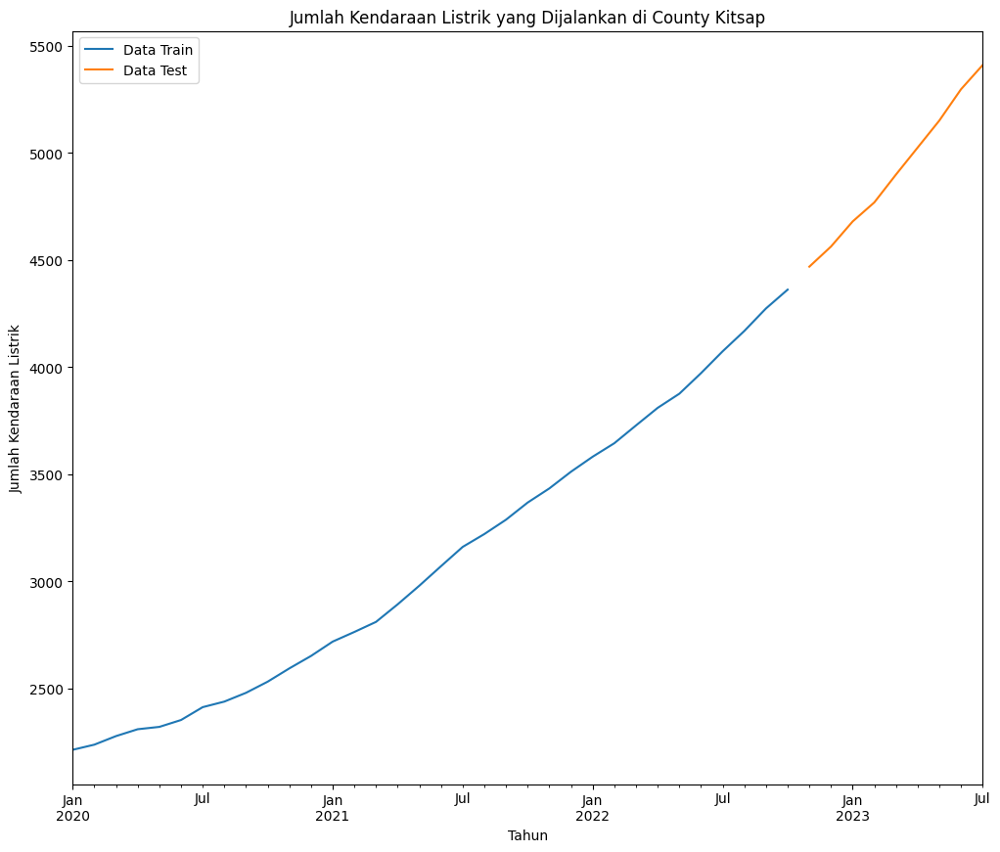

In [ ]:
plot_train_test_split(train_kitsap, test_kitsap, 'Kitsap')

In [ ]:
auto_model = pm.auto_arima(train_kitsap, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -130.619
Date:                Fri, 25 Aug 2023   AIC                            267.238
Time:                        09:52:31   BIC                            271.636
Sample:                    01-31-2020   HQIC                           268.696
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.1575      0.552      3.906      0.000       1.075       3.240
ma.L1         -0.8233      0.106     -7.757      0.000      -1.031      -0.615
sigma2       198.5490     75.839      2.618      0.009      49.907     347.191
===================================================================================
Ljung-Box (L1) (Q):                   0.98   Jarque-Bera (JB):                 1.72
Prob(Q):                              0.32   Prob(JB):                         0.42
Heteroskedasticity (H):               0.72   Skew:                             0.00
Prob(H) (two-sided):                  0.60   Kurtosis:                         1.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -125.069
Date:                Fri, 25 Aug 2023   AIC                            254.137
Time:                        19:50:43   BIC                            256.940
Sample:                    01-31-2020   HQIC                           255.034
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5212      0.171     -3.044      0.002      -0.857      -0.186
sigma2       244.5064     81.788      2.989      0.003      84.204     404.809
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 0.71
Prob(Q):                              0.88   Prob(JB):                         0.70
Heteroskedasticity (H):               0.58   Skew:                            -0.13
Prob(H) (two-sided):                  0.40   Kurtosis:                         2.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

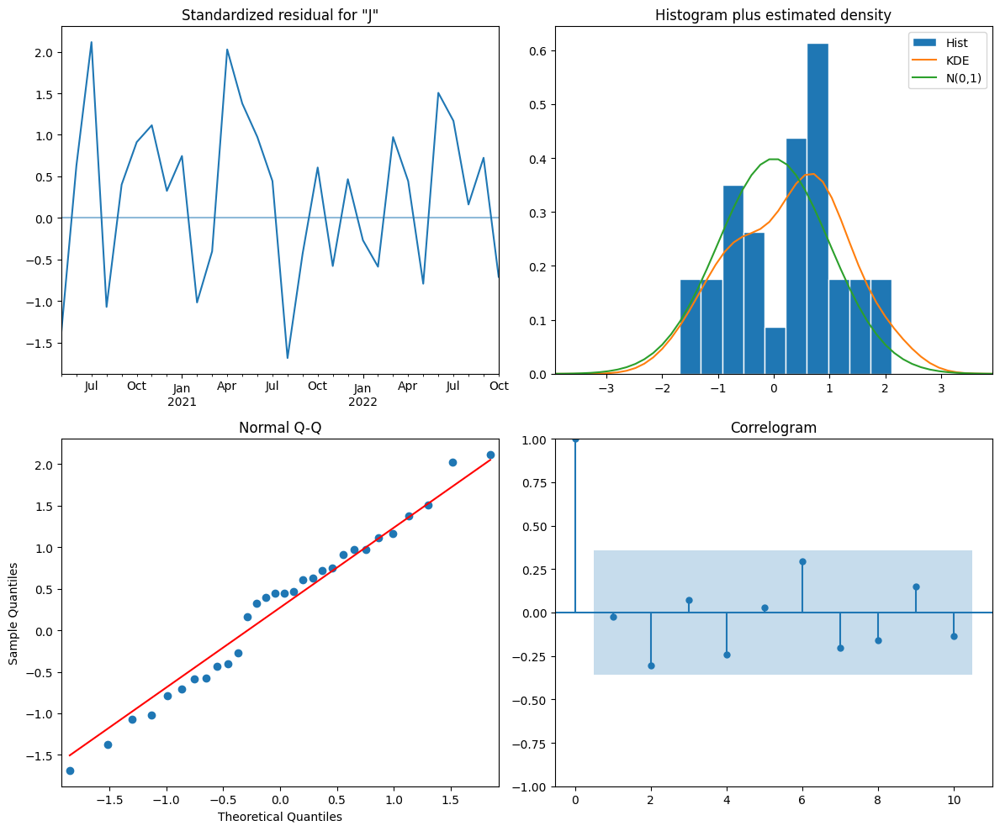

In [ ]:
model = SARIMAX(train_kitsap, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

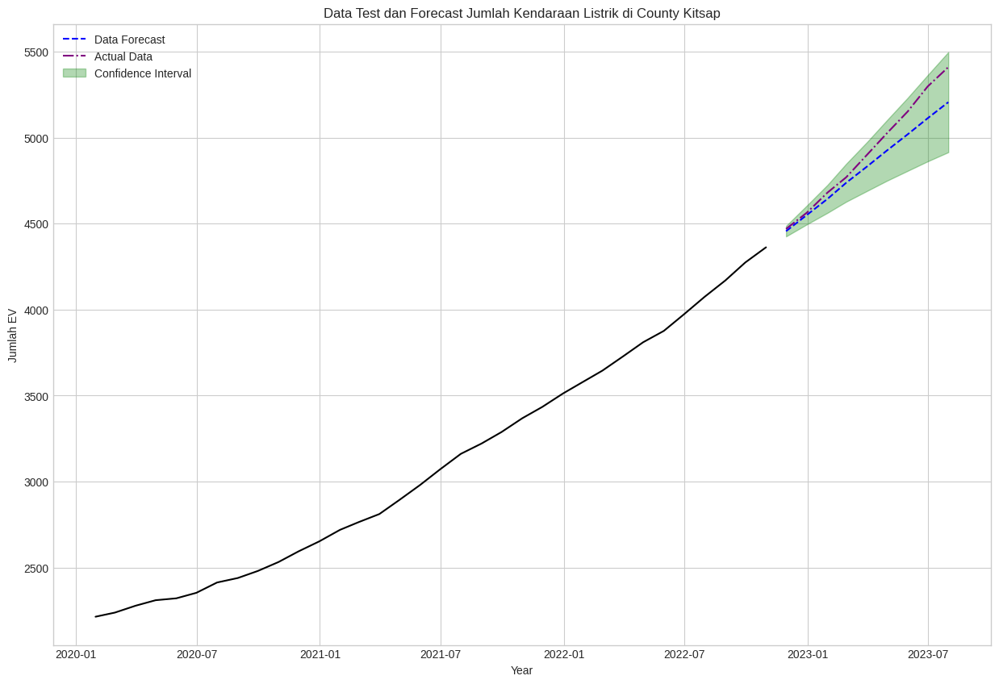


Mean Absolute Percentage Error: 0.0169490993719556

Mean Squared Error: 12294.940793737209

Root Mean Squared Error: 110.88255405489724

R-squared: 0.8710733955098154


In [ ]:
df_kitsap_forecast = get_forecast(model, train_kitsap, test_kitsap, 'Kitsap', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -164.348
Date:                Fri, 25 Aug 2023   AIC                            332.695
Time:                        19:51:27   BIC                            336.022
Sample:                    01-31-2020   HQIC                           333.889
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5402      0.146     -3.695      0.000      -0.827      -0.254
sigma2       267.6043     83.895      3.190      0.001     103.173     432.035
===================================================================================
Ljung-Box (L1) (Q):                   1.26   Jarque-Bera (JB):                 1.45
Prob(Q):                              0.26   Prob(JB):                         0.48
Heteroskedasticity (H):               0.84   Skew:                            -0.17
Prob(H) (two-sided):                  0.76   Kurtosis:                         2.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

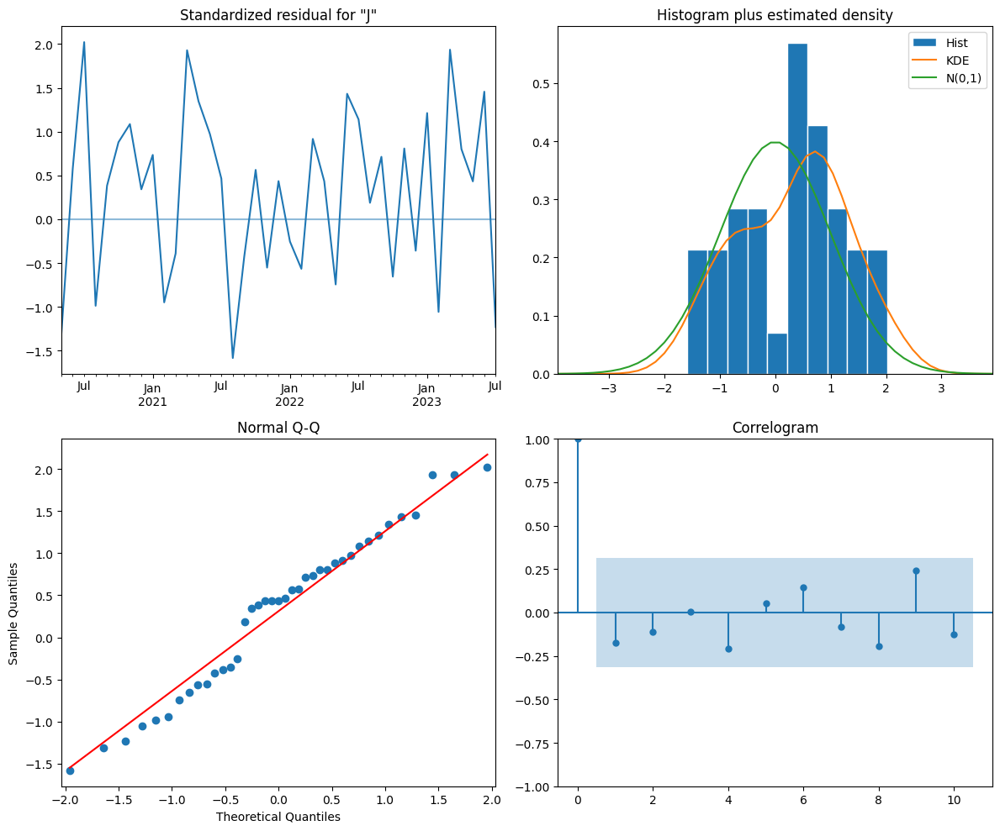

In [ ]:
model = SARIMAX(kitsap, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

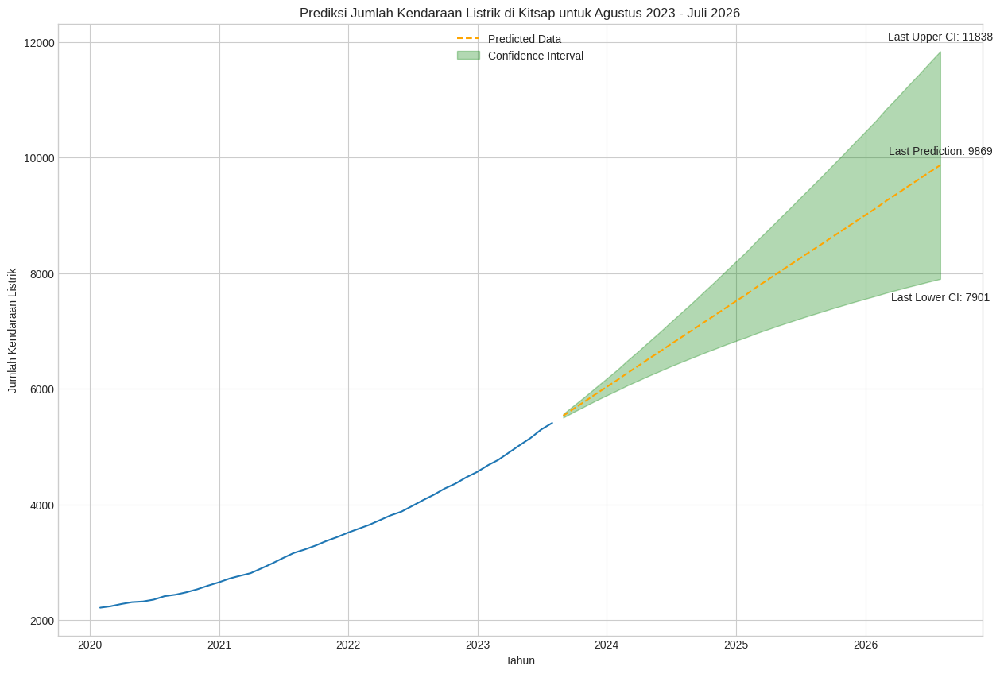

In [ ]:
df_kitsap_preds = get_prediction(model, kitsap['Jumlah EV'], test_kitsap, 'Kitsap', plot = True)

In [ ]:
county_information['Kitsap']['Predictions'] = df_kitsap_preds

## ***County* Spokane**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Spokane']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,1.0
2010-05-31,1.0
2010-06-30,1.0
...,...
2023-03-31,3609.0
2023-04-30,3712.0
2023-05-31,3830.0


In [ ]:
spokane = county_dfs['Spokane'].copy()
spokane.reset_index(inplace=True)
mask = spokane['DOL Transaction Date'] >= '2020-01-31'
spokane = spokane[mask]

spokane.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_spokane, test_spokane = train_test_split_ts(county_information['Spokane']['df'], 0.80, 0.20)

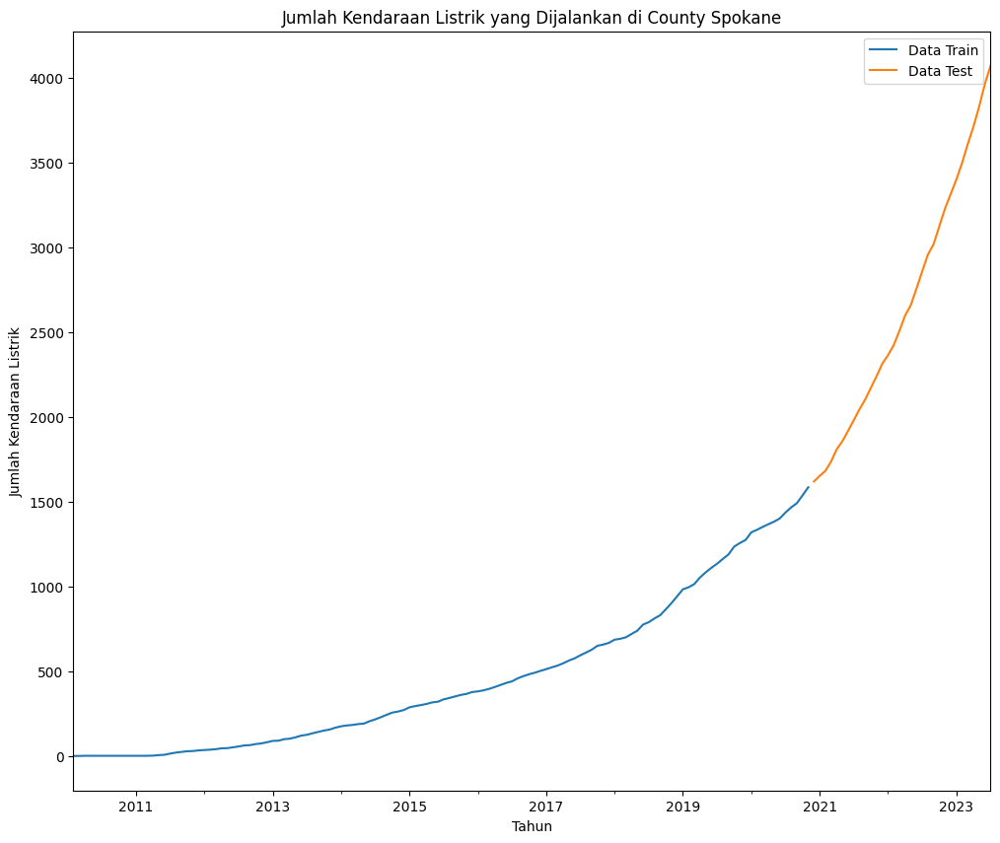

In [ ]:
plot_train_test_split(train_spokane, test_spokane, 'Spokane')

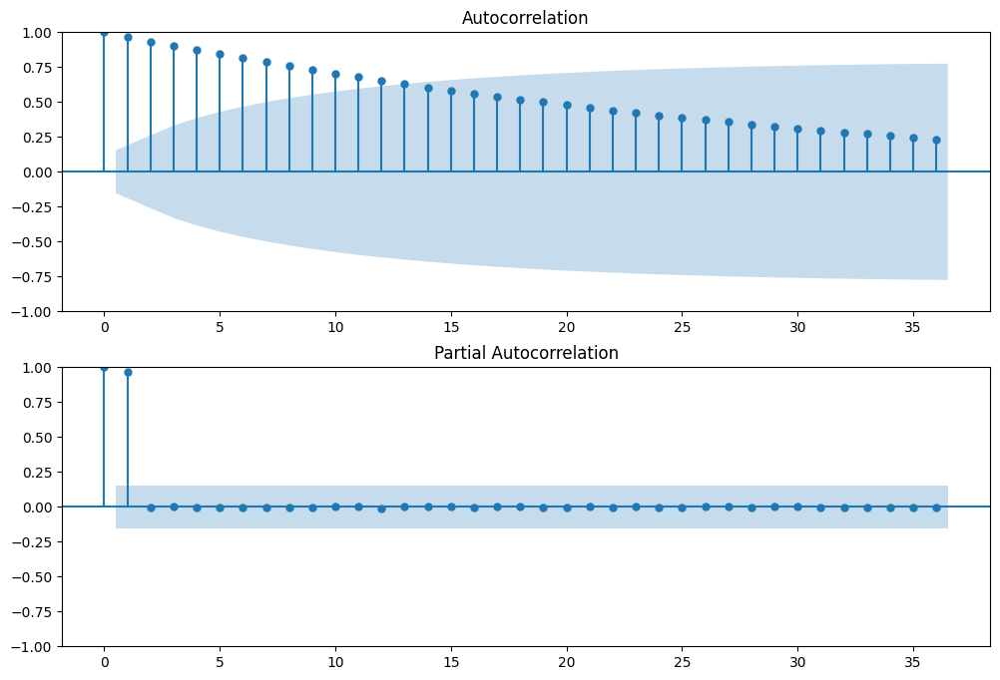

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Spokane']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Spokane']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_kitsap, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -130.619
Date:                Fri, 25 Aug 2023   AIC                            267.238
Time:                        09:52:54   BIC                            271.636
Sample:                    01-31-2020   HQIC                           268.696
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.1575      0.552      3.906      0.000       1.075       3.240
ma.L1         -0.8233      0.106     -7.757      0.000      -1.031      -0.615
sigma2       198.5490     75.839      2.618      0.009      49.907     347.191
===================================================================================
Ljung-Box (L1) (Q):                   0.98   Jarque-Bera (JB):                 1.72
Prob(Q):                              0.32   Prob(JB):                         0.42
Heteroskedasticity (H):               0.72   Skew:                             0.00
Prob(H) (two-sided):                  0.60   Kurtosis:                         1.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                  130
Model:               SARIMAX(2, 2, 4)   Log Likelihood                -400.284
Date:                Fri, 25 Aug 2023   AIC                            814.568
Time:                        19:52:10   BIC                            834.253
Sample:                    02-28-2010   HQIC                           822.564
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6678      0.044    -15.052      0.000      -0.755      -0.581
ar.L2         -0.8716      0.049    -17.672      0.000      -0.968      -0.775
ma.L1          0.0873    119.803      0.001      0.999    -234.723     234.897
ma.L2          0.4596    438.182      0.001      0.999    -858.361     859.281
ma.L3         -0.5729    237.949     -0.002      0.998    -466.944     465.798
ma.L4         -0.3410    166.004     -0.002      0.998    -325.703     325.021
sigma2        37.2045   1.81e+04      0.002      0.998   -3.55e+04    3.55e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.21   Jarque-Bera (JB):                15.49
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):              15.73   Skew:                            -0.03
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

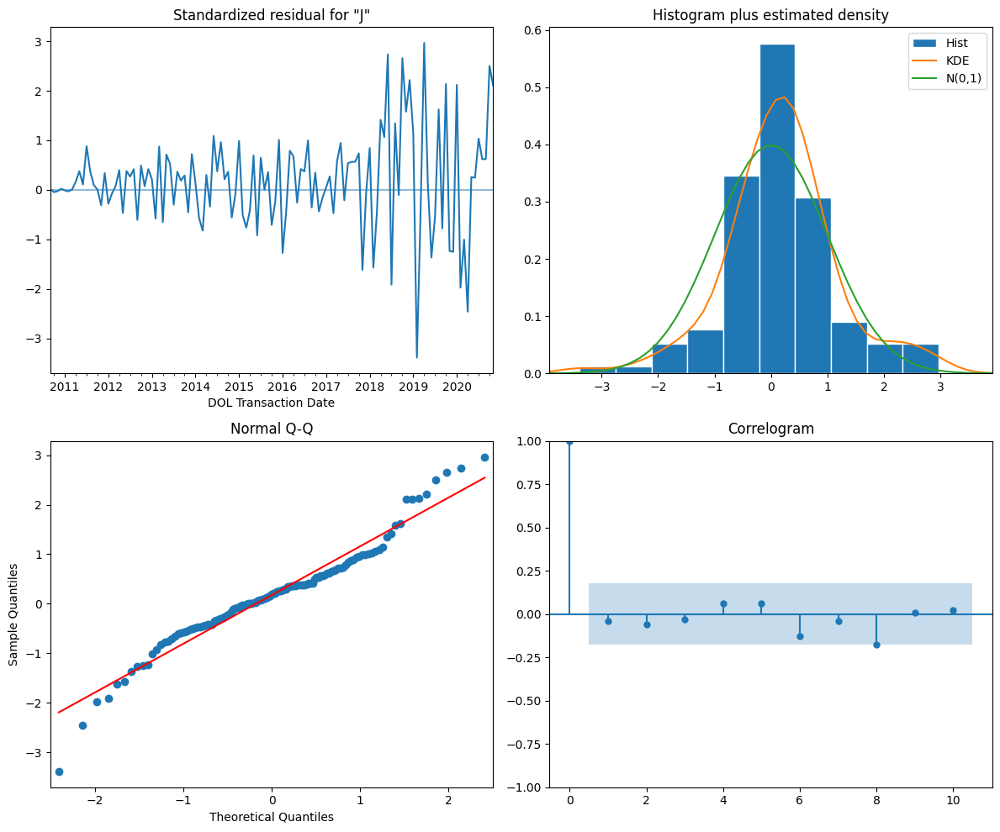

In [ ]:
model = SARIMAX(train_spokane, order = (2, 2, 4),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

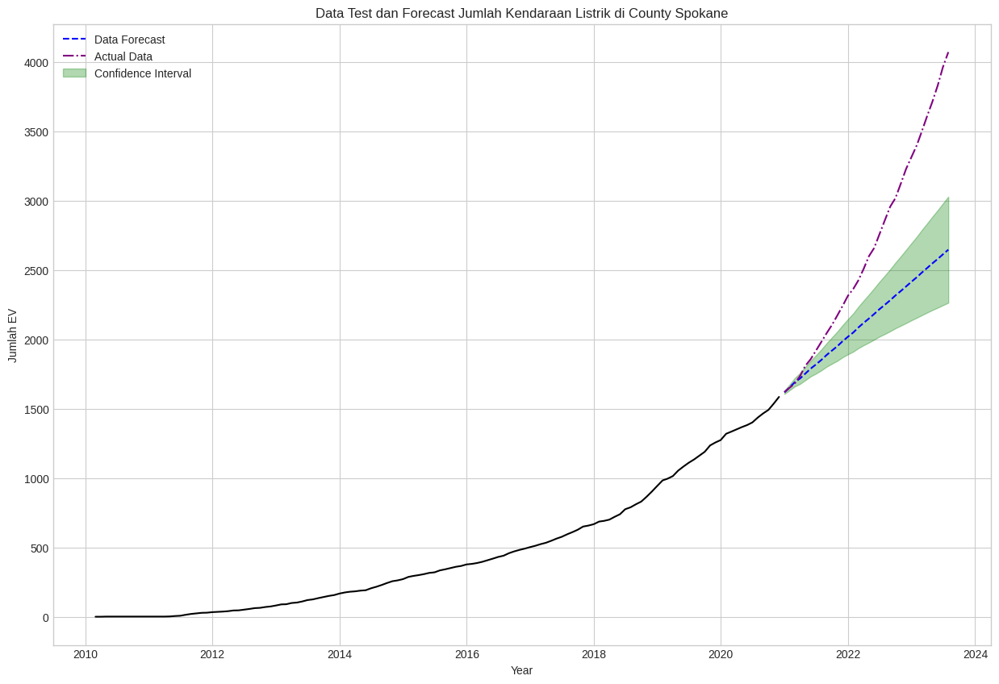


Mean Absolute Percentage Error: 0.1671106299218674

Mean Squared Error: 460540.04621232476

Root Mean Squared Error: 678.6310088791439

R-squared: 0.14461380616831476


In [ ]:
df_spokane_forecast = get_forecast(model, train_spokane, test_spokane, 'Spokane', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_spokane, test_spokane = train_test_split_ts(spokane, 0.80, 0.20)

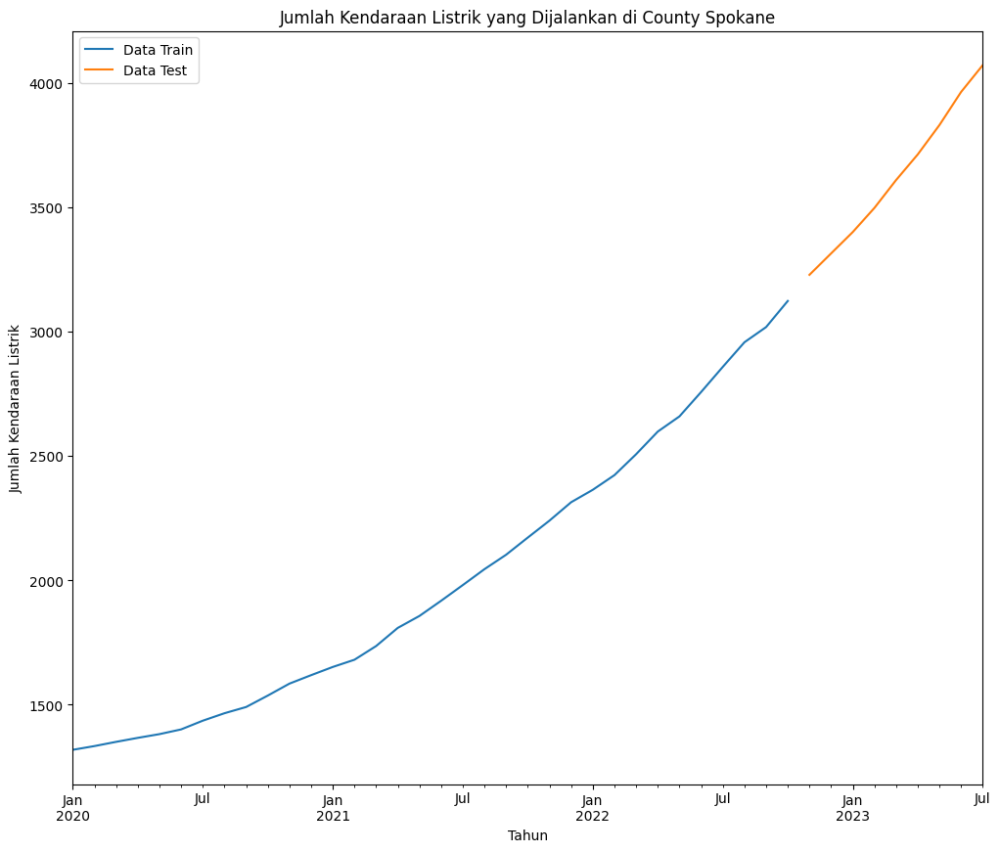

In [ ]:
plot_train_test_split(train_spokane, test_spokane, 'Spokane')

In [ ]:
auto_model = pm.auto_arima(train_kitsap, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -130.619
Date:                Fri, 25 Aug 2023   AIC                            267.238
Time:                        09:53:07   BIC                            271.636
Sample:                    01-31-2020   HQIC                           268.696
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.1575      0.552      3.906      0.000       1.075       3.240
ma.L1         -0.8233      0.106     -7.757      0.000      -1.031      -0.615
sigma2       198.5490     75.839      2.618      0.009      49.907     347.191
===================================================================================
Ljung-Box (L1) (Q):                   0.98   Jarque-Bera (JB):                 1.72
Prob(Q):                              0.32   Prob(JB):                         0.42
Heteroskedasticity (H):               0.72   Skew:                             0.00
Prob(H) (two-sided):                  0.60   Kurtosis:                         1.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -125.209
Date:                Fri, 25 Aug 2023   AIC                            254.418
Time:                        19:53:55   BIC                            257.221
Sample:                    01-31-2020   HQIC                           255.315
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5838      0.155     -3.778      0.000      -0.887      -0.281
sigma2       246.7196     78.288      3.151      0.002      93.278     400.161
===================================================================================
Ljung-Box (L1) (Q):                   1.14   Jarque-Bera (JB):                 1.21
Prob(Q):                              0.29   Prob(JB):                         0.55
Heteroskedasticity (H):               4.29   Skew:                            -0.49
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

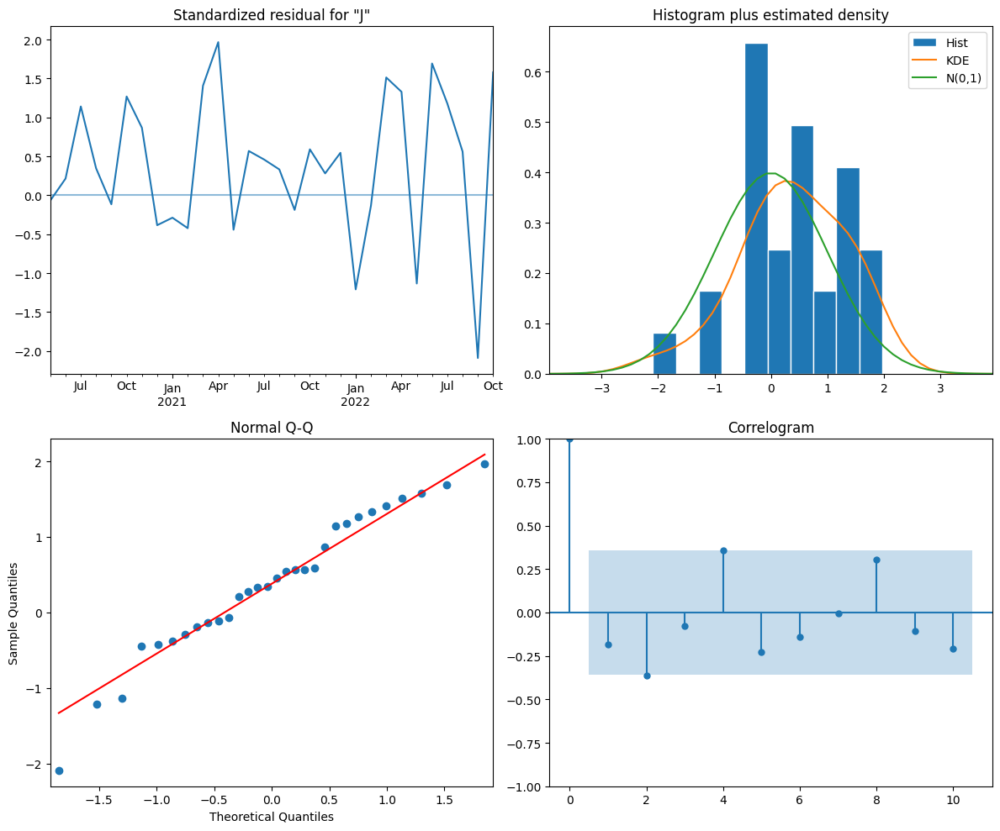

In [ ]:
model = SARIMAX(train_spokane, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

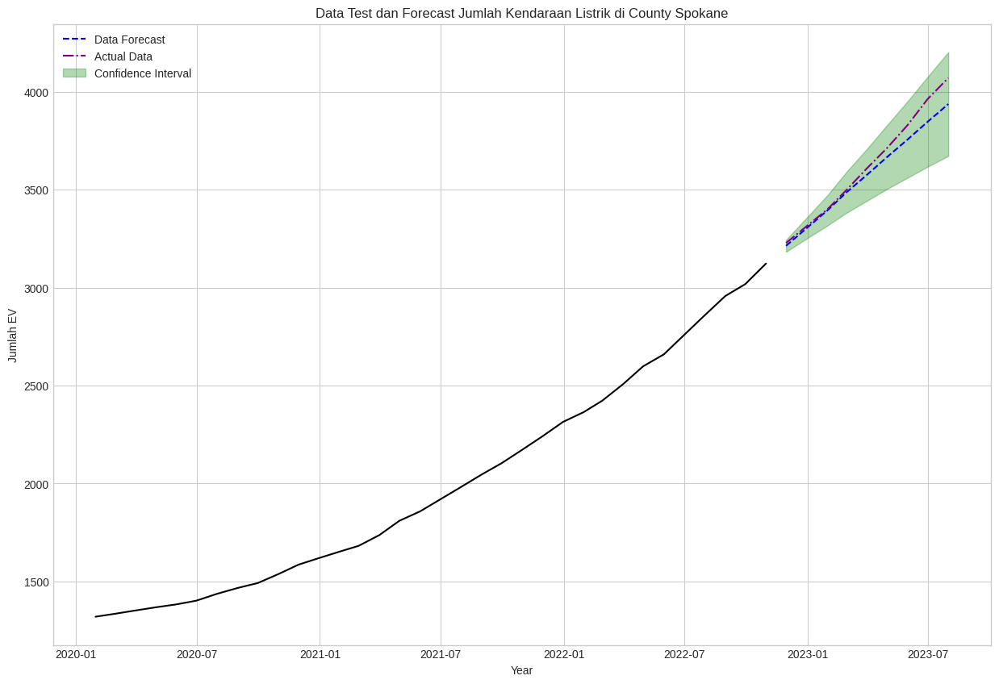


Mean Absolute Percentage Error: 0.01281857877930003

Mean Squared Error: 4482.155223533024

Root Mean Squared Error: 66.94890009203306

R-squared: 0.9410543398743696


In [ ]:
df_spokane_forecast = get_forecast(model, train_spokane, test_spokane, 'Spokane', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -161.817
Date:                Fri, 25 Aug 2023   AIC                            327.634
Time:                        19:54:34   BIC                            330.961
Sample:                    01-31-2020   HQIC                           328.827
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5596      0.133     -4.218      0.000      -0.820      -0.300
sigma2       235.0135     65.476      3.589      0.000     106.682     363.345
===================================================================================
Ljung-Box (L1) (Q):                   1.04   Jarque-Bera (JB):                 1.28
Prob(Q):                              0.31   Prob(JB):                         0.53
Heteroskedasticity (H):               1.55   Skew:                            -0.44
Prob(H) (two-sided):                  0.44   Kurtosis:                         2.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

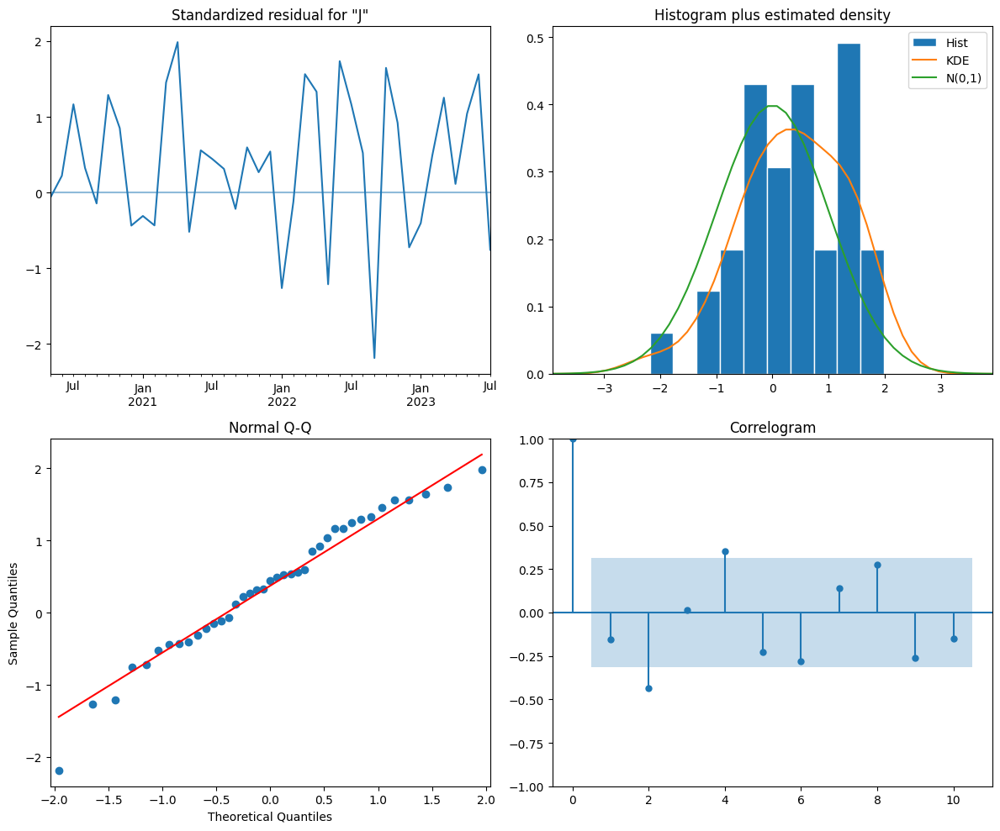

In [ ]:
model = SARIMAX(spokane, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

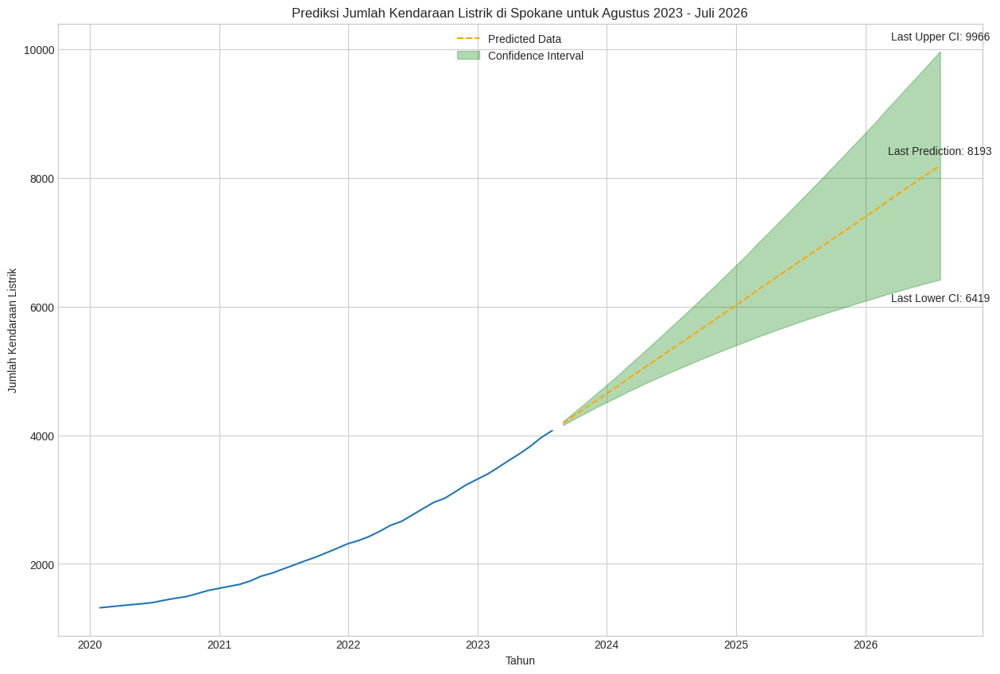

In [ ]:
df_spokane_preds = get_prediction(model, spokane['Jumlah EV'], test_spokane, 'Spokane', plot = True)

In [ ]:
county_information['Spokane']['Predictions'] = df_spokane_preds

## ***County* Whatcom**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Whatcom']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,1.0
2010-05-31,1.0
2010-06-30,1.0
...,...
2023-03-31,3224.0
2023-04-30,3302.0
2023-05-31,3399.0


In [ ]:
whatcom = county_dfs['Whatcom'].copy()
whatcom.reset_index(inplace=True)
mask = whatcom['DOL Transaction Date'] >= '2020-01-31'
whatcom = whatcom[mask]

whatcom.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_whatcom, test_whatcom = train_test_split_ts(county_information['Whatcom']['df'], 0.80, 0.20)

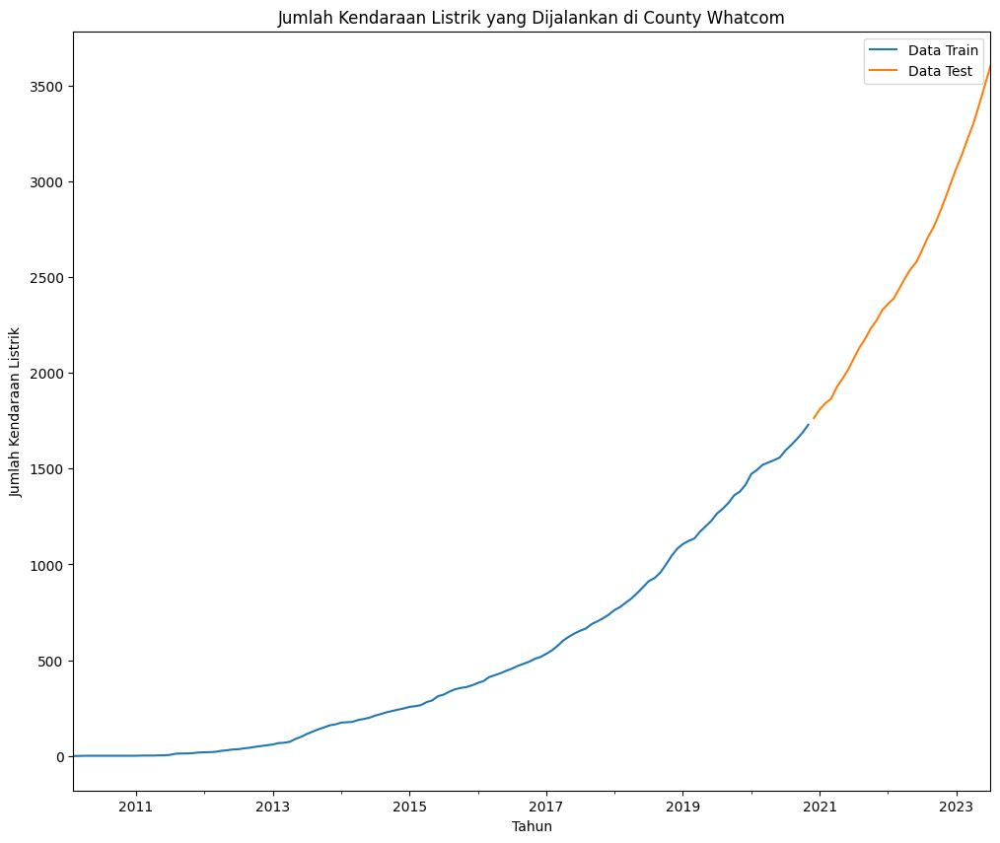

In [ ]:
plot_train_test_split(train_whatcom, test_whatcom, 'Whatcom')

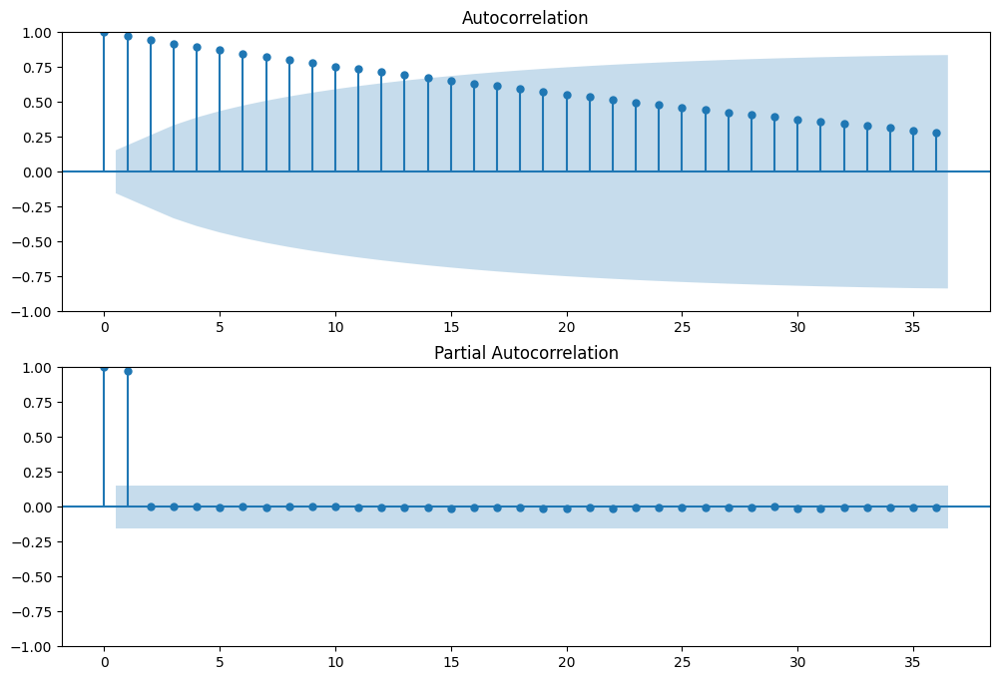

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Whatcom']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Whatcom']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_whatcom, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  130
Model:               SARIMAX(1, 2, 1)   Log Likelihood                -418.124
Date:                Fri, 25 Aug 2023   AIC                            844.248
Time:                        09:53:27   BIC                            855.656
Sample:                    02-28-2010   HQIC                           848.883
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1817      0.029      6.286      0.000       0.125       0.238
ar.L1          0.3207      0.056      5.767      0.000       0.212       0.430
ma.L1         -0.9656      0.026    -37.347      0.000      -1.016      -0.915
sigma2        39.6159      3.676     10.777      0.000      32.411      46.820
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                31.48
Prob(Q):                              0.82   Prob(JB):                         0.00
Heteroskedasticity (H):              16.82   Skew:                             0.61
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                  130
Model:               SARIMAX(1, 2, 1)   Log Likelihood                -416.707
Date:                Fri, 25 Aug 2023   AIC                            839.414
Time:                        19:55:19   BIC                            847.923
Sample:                    02-28-2010   HQIC                           842.871
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2635      0.082      3.209      0.001       0.103       0.424
ma.L1         -0.8488      0.052    -16.350      0.000      -0.951      -0.747
sigma2        43.4112      3.928     11.052      0.000      35.713      51.110
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                19.72
Prob(Q):                              0.69   Prob(JB):                         0.00
Heteroskedasticity (H):              14.69   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

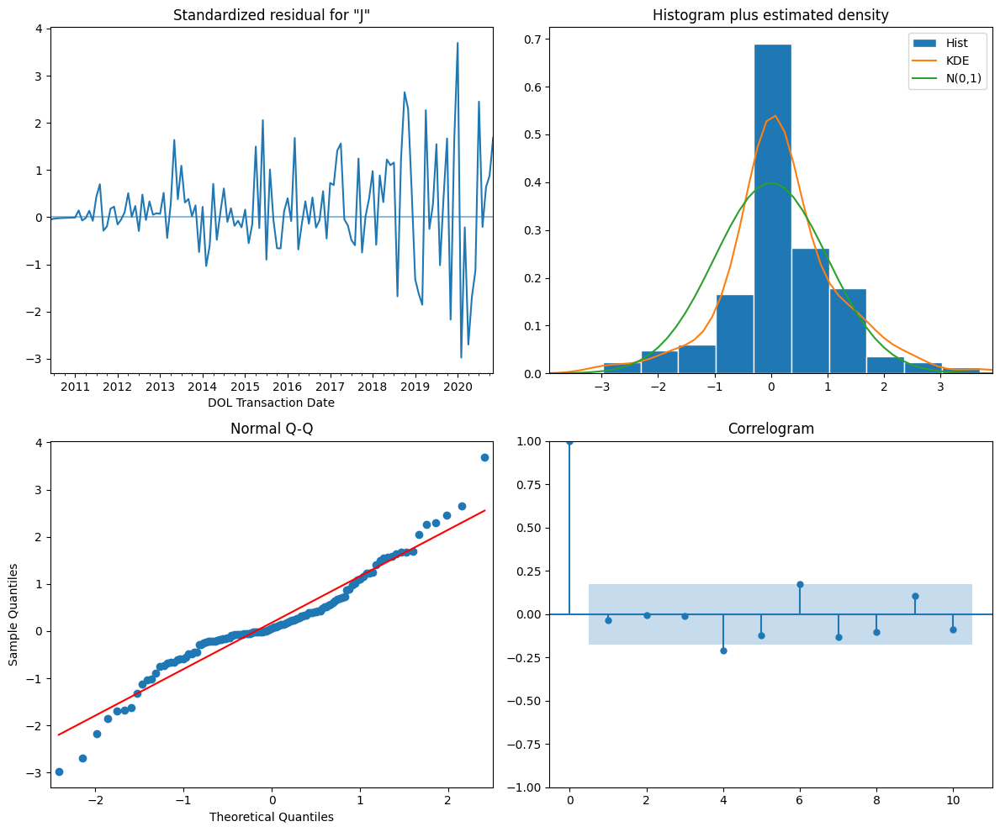

In [ ]:
model = SARIMAX(train_whatcom, order = (1, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

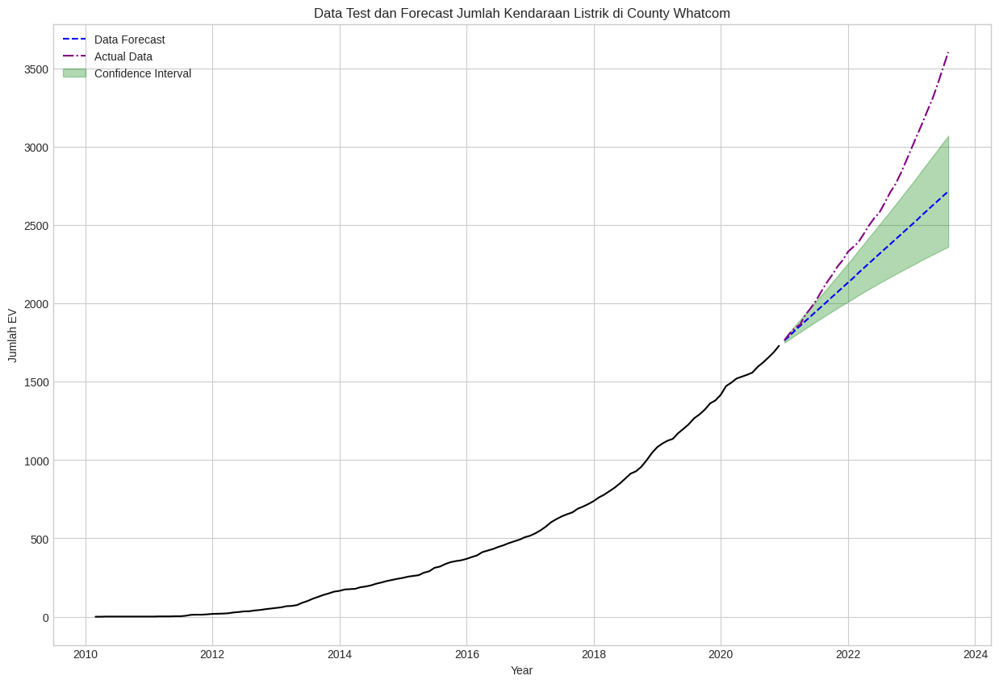


Mean Absolute Percentage Error: 0.10418470435157454

Mean Squared Error: 152136.06653066305

Root Mean Squared Error: 390.0462364011003

R-squared: 0.44919851681000045


In [ ]:
df_whatcom_forecast = get_forecast(model, train_whatcom, test_whatcom, 'Whatcom', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_whatcom, test_whatcom = train_test_split_ts(whatcom, 0.80, 0.20)

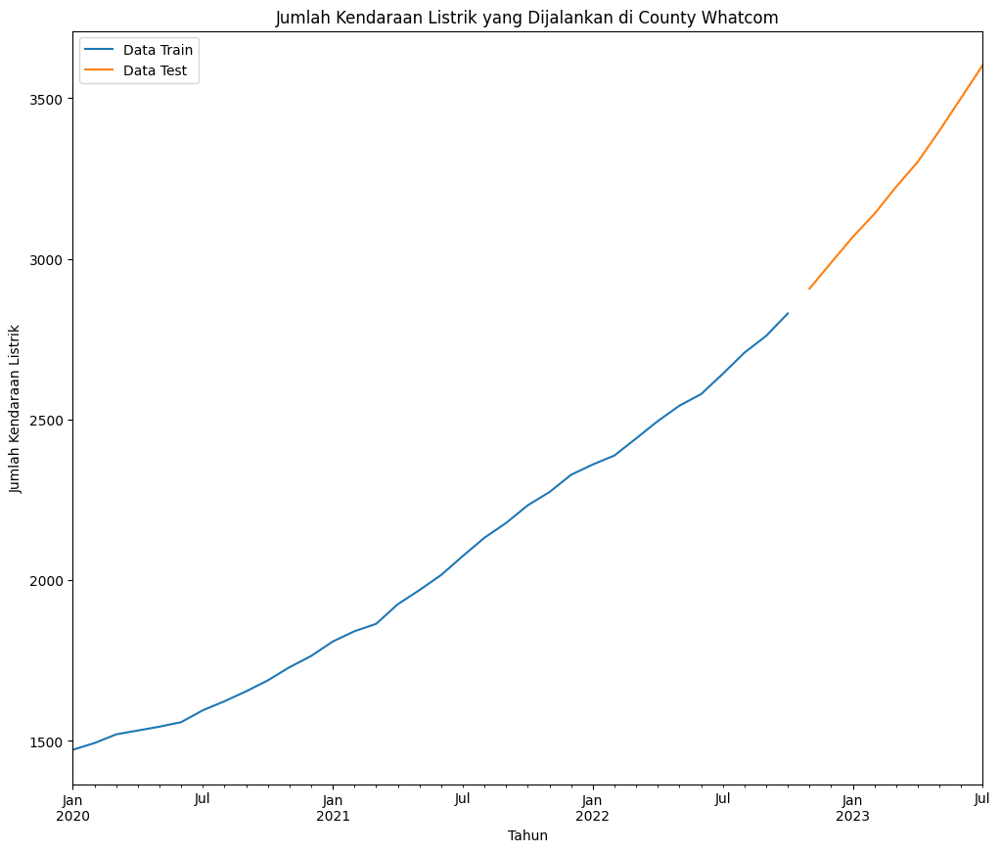

In [ ]:
plot_train_test_split(train_whatcom, test_whatcom, 'Whatcom')

In [ ]:
auto_model = pm.auto_arima(train_whatcom, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -123.010
Date:                Fri, 25 Aug 2023   AIC                            252.021
Time:                        19:57:17   BIC                            256.418
Sample:                    01-31-2020   HQIC                           253.478
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2599      0.387      3.255      0.001       0.501       2.019
ma.L1         -0.8439      0.129     -6.521      0.000      -1.098      -0.590
sigma2       122.8852     35.416      3.470      0.001      53.470     192.300
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):                 0.71
Prob(Q):                              0.72   Prob(JB):                         0.70
Heteroskedasticity (H):               2.33   Skew:                            -0.32
Prob(H) (two-sided):                  0.18   Kurtosis:                         2.67
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   34
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -117.368
Date:                Fri, 25 Aug 2023   AIC                            238.736
Time:                        19:56:39   BIC                            241.539
Sample:                    01-31-2020   HQIC                           239.633
                         - 10-31-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6076      0.201     -3.023      0.002      -1.001      -0.214
sigma2       146.1943     46.450      3.147      0.002      55.154     237.235
===================================================================================
Ljung-Box (L1) (Q):                   0.60   Jarque-Bera (JB):                 0.40
Prob(Q):                              0.44   Prob(JB):                         0.82
Heteroskedasticity (H):               2.19   Skew:                             0.08
Prob(H) (two-sided):                  0.23   Kurtosis:                         2.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

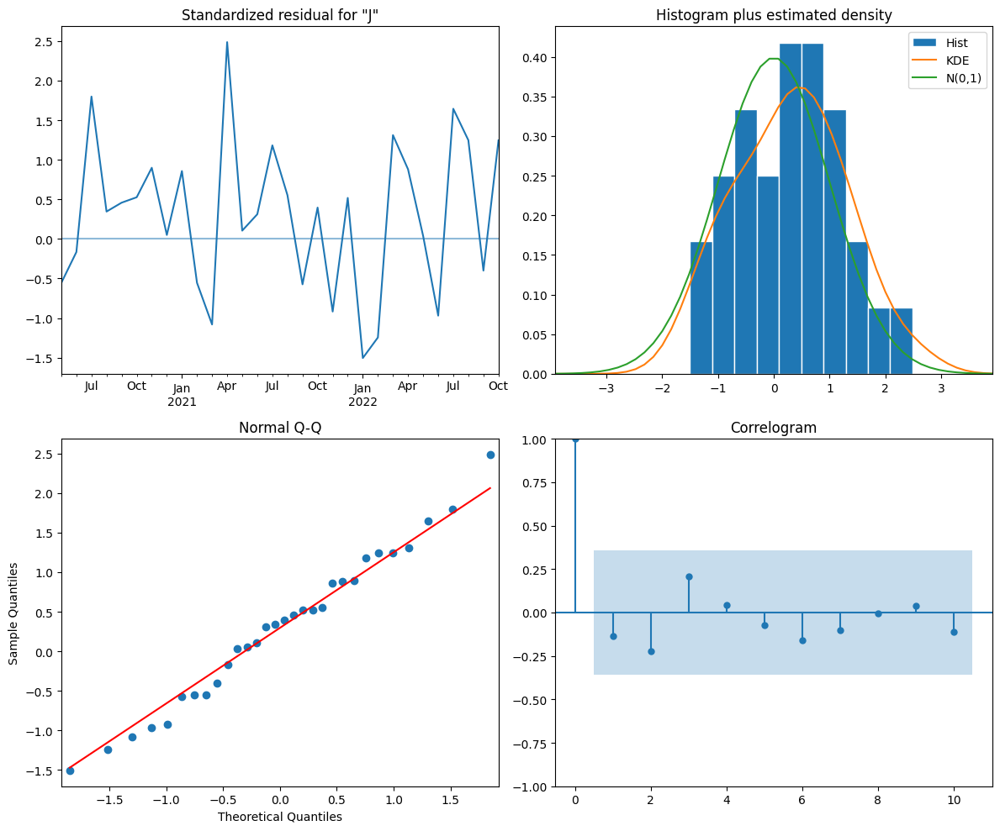

In [ ]:
model = SARIMAX(train_whatcom, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

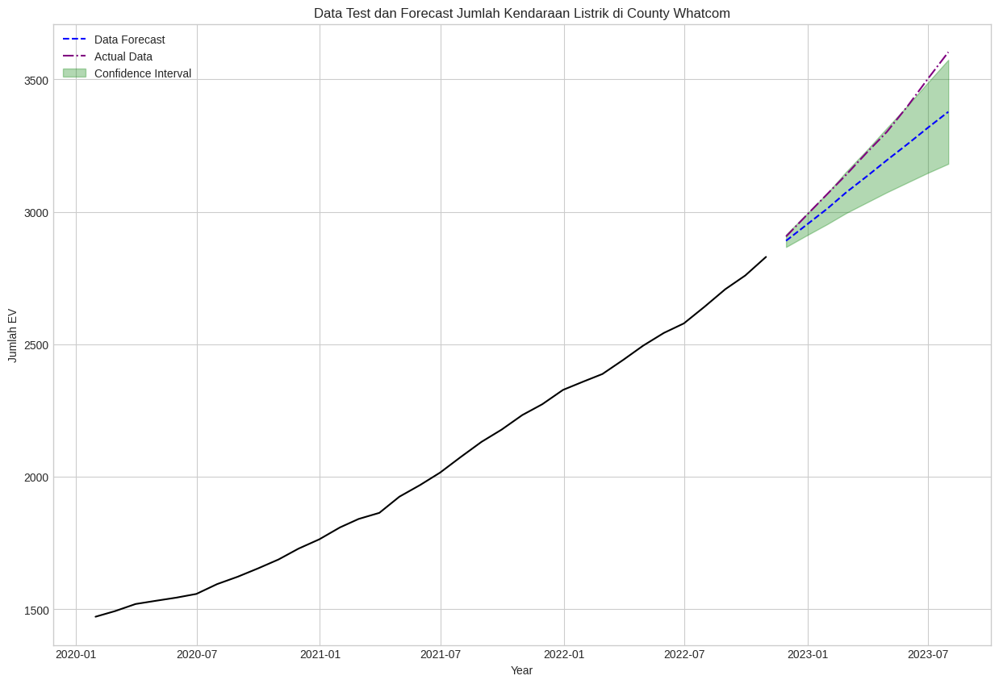


Mean Absolute Percentage Error: 0.030493507272570837

Mean Squared Error: 14860.436821399066

Root Mean Squared Error: 121.90339134494604

R-squared: 0.6982045691624099


In [ ]:
df_whatcom_forecast = get_forecast(model, train_whatcom, test_whatcom, 'Whatcom', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                   43
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -151.872
Date:                Fri, 25 Aug 2023   AIC                            307.745
Time:                        19:59:59   BIC                            311.072
Sample:                    01-31-2020   HQIC                           308.938
                         - 07-31-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4665      0.187     -2.500      0.012      -0.832      -0.101
sigma2       141.2003     40.176      3.515      0.000      62.456     219.944
===================================================================================
Ljung-Box (L1) (Q):                   0.95   Jarque-Bera (JB):                 0.38
Prob(Q):                              0.33   Prob(JB):                         0.83
Heteroskedasticity (H):               0.92   Skew:                             0.14
Prob(H) (two-sided):                  0.88   Kurtosis:                         2.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

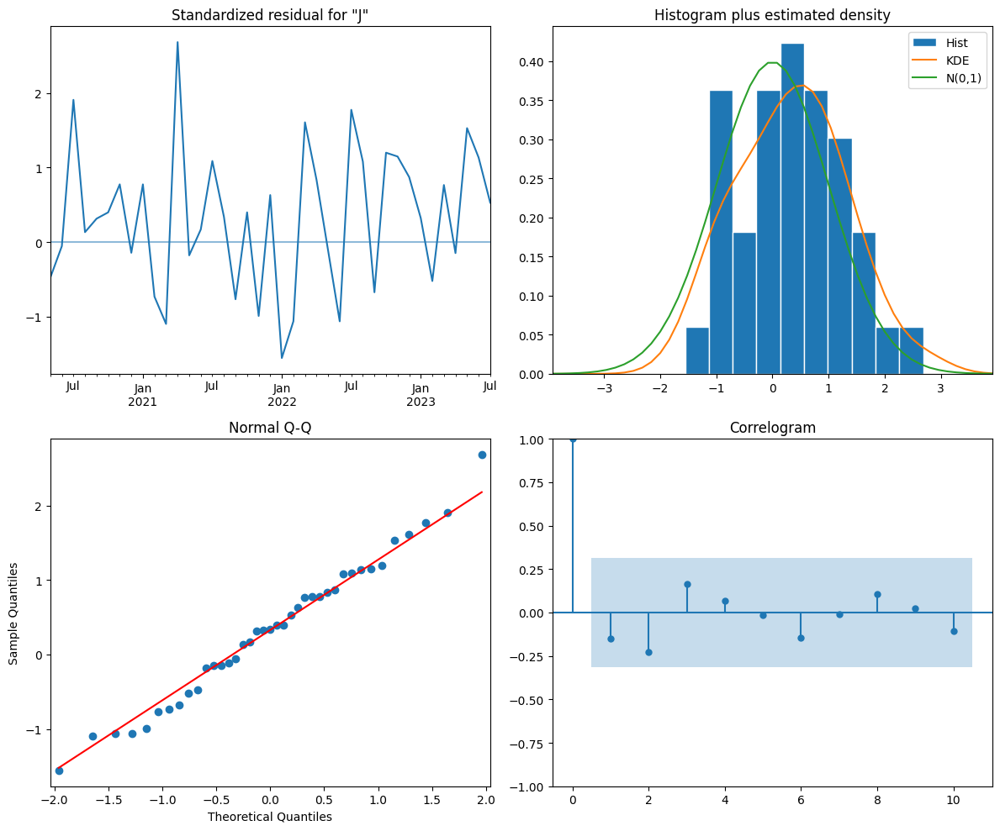

In [ ]:
model = SARIMAX(whatcom, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

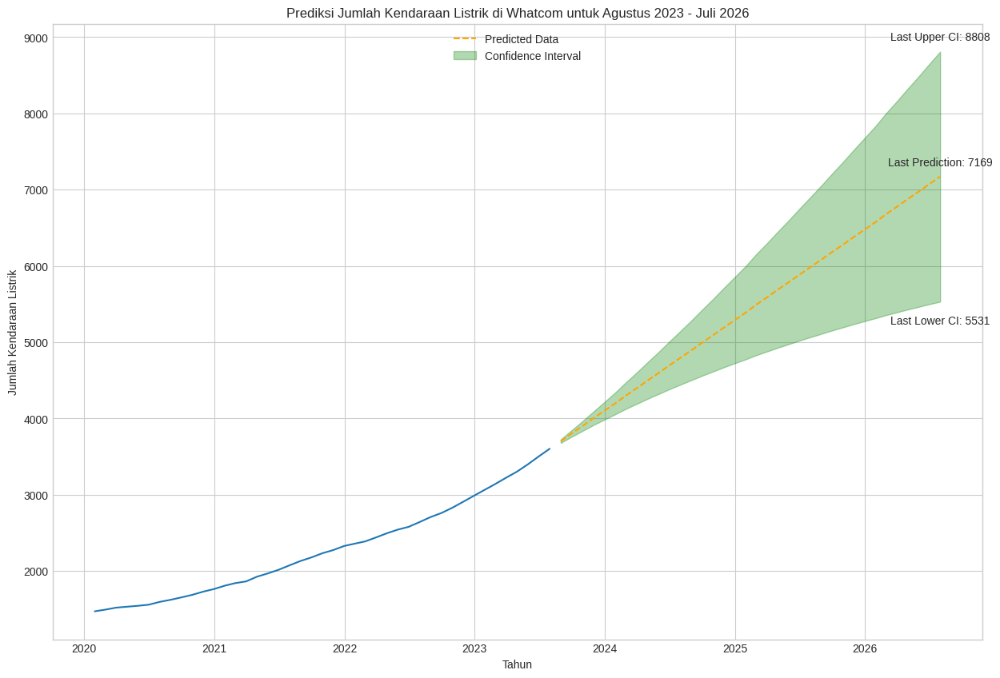

In [ ]:
df_whatcom_preds = get_prediction(model, whatcom['Jumlah EV'], test_whatcom, 'Whatcom', plot = True)

In [ ]:
county_information['Whatcom']['Predictions'] = df_whatcom_preds

## ***County* Benton**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Benton']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,0.0
2010-05-31,0.0
2010-06-30,0.0
...,...
2023-03-31,1755.0
2023-04-30,1819.0
2023-05-31,1865.0


In [ ]:
benton = county_dfs['Benton'].copy()
benton.reset_index(inplace=True)
mask = benton['DOL Transaction Date'] >= '2020-01-31'
benton = benton[mask]

benton.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_benton, test_benton = train_test_split_ts(county_information['Benton']['df'], 0.80, 0.20)

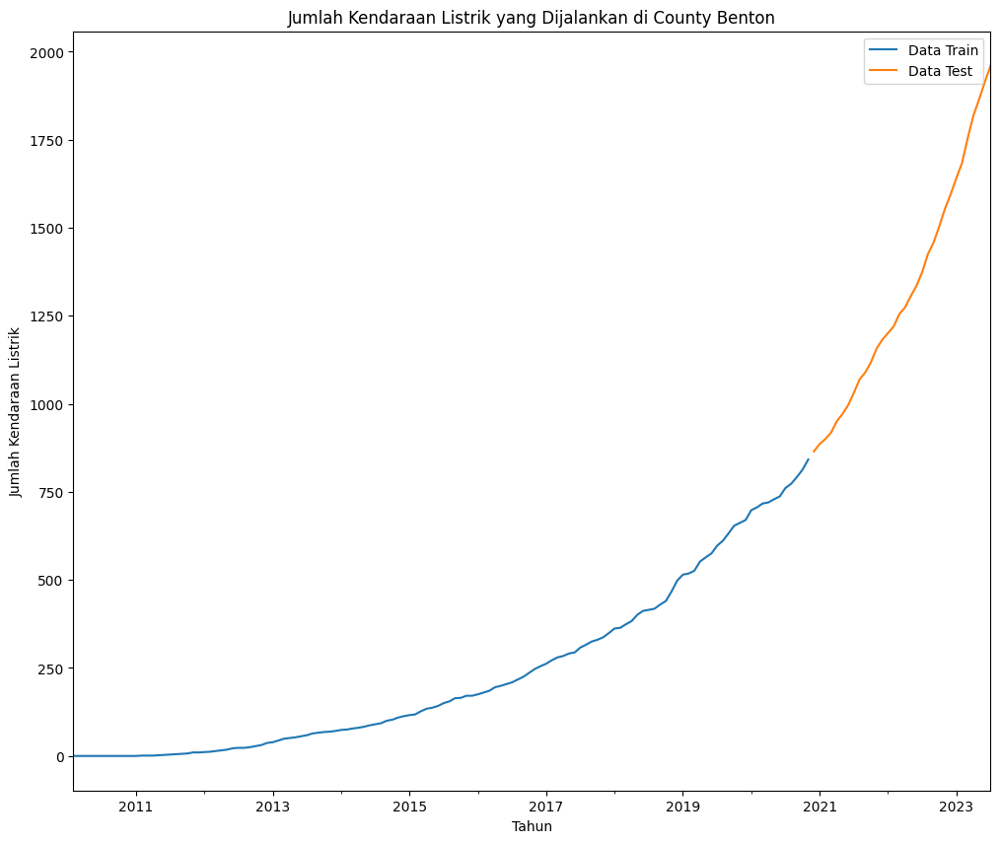

In [ ]:
plot_train_test_split(train_benton, test_benton, 'Benton')

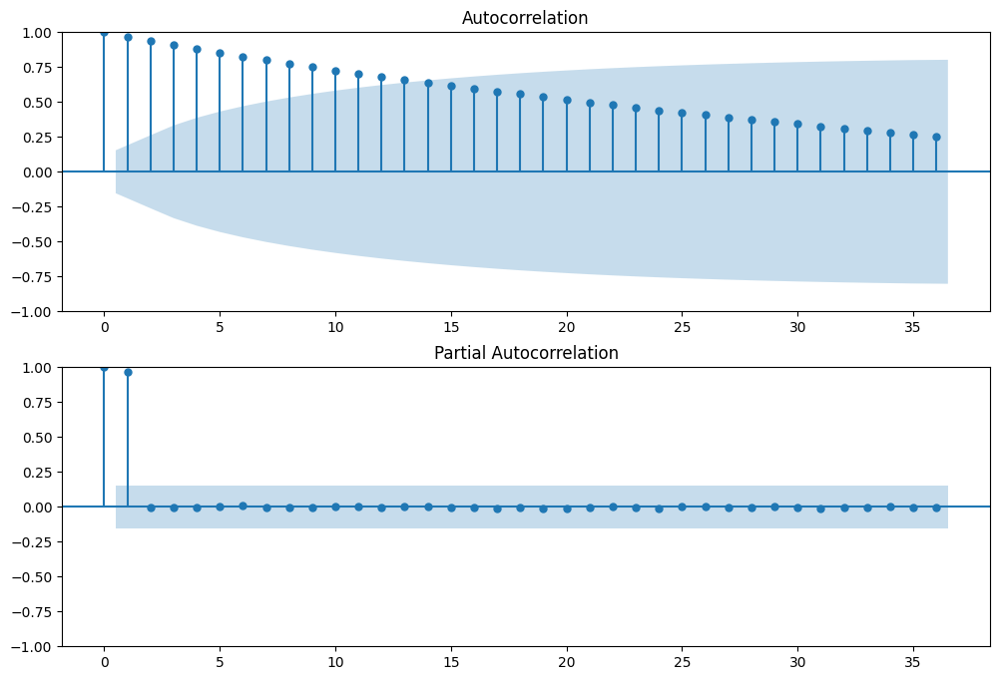

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Benton']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Benton']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_benton, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  130
Model:             SARIMAX(1, 2, 4)x(1, 0, [], 12)   Log Likelihood                -370.807
Date:                             Fri, 25 Aug 2023   AIC                            757.615
Time:                                     09:54:16   BIC                            780.431
Sample:                                 02-28-2010   HQIC                           766.885
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2978      0.077      3.892      0.000       0.148       0.448
ar.L1         -0.8700      0.075    -11.659      0.000      -1.016      -0.724
ma.L1          0.1714      0.097      1.764      0.078      -0.019       0.362
ma.L2         -0.9632      0.084    -11.403      0.000      -1.129      -0.798
ma.L3         -0.3186      0.059     -5.428      0.000      -0.434      -0.204
ma.L4          0.2557      0.066      3.874      0.000       0.126       0.385
ar.S.L12      -0.1488      0.080     -1.864      0.062      -0.305       0.008
sigma2        18.7877      1.789     10.501      0.000      15.281      22.294
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               101.34
Prob(Q):                              0.87   Prob(JB):                         0.00
Heteroskedasticity (H):              32.78   Skew:                             1.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                  130
Model:             SARIMAX(1, 2, 4)x(1, 0, [], 12)   Log Likelihood                -343.074
Date:                             Fri, 25 Aug 2023   AIC                            700.148
Time:                                     20:03:46   BIC                            719.362
Sample:                                 02-28-2010   HQIC                           707.947
                                      - 11-30-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8564      0.079    -10.868      0.000      -1.011      -0.702
ma.L1          0.2234      0.101      2.215      0.027       0.026       0.421
ma.L2         -0.8706      0.090     -9.639      0.000      -1.048      -0.694
ma.L3         -0.2891      0.064     -4.500      0.000      -0.415      -0.163
ma.L4          0.2669      0.070      3.831      0.000       0.130       0.403
ar.S.L12      -0.1323      0.086     -1.544      0.123      -0.300       0.036
sigma2        22.4639      2.171     10.345      0.000      18.208      26.720
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):                40.36
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):              26.28   Skew:                             0.81
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

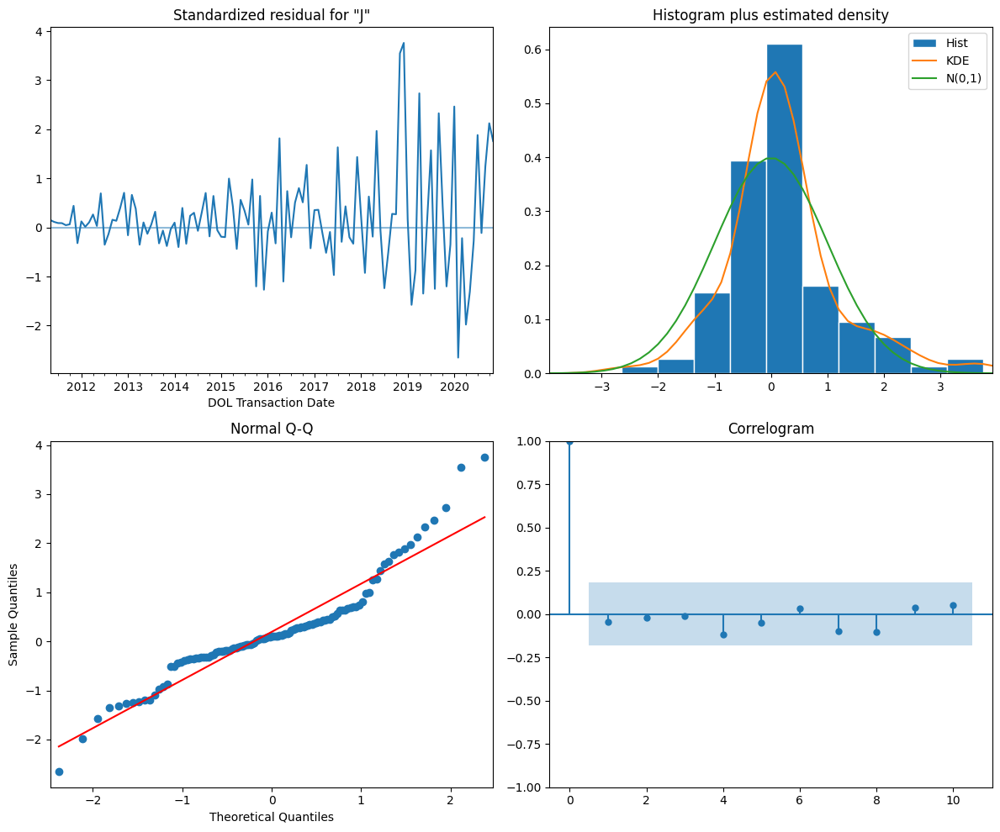

In [ ]:
model = SARIMAX(train_benton, order = (1, 2, 4), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

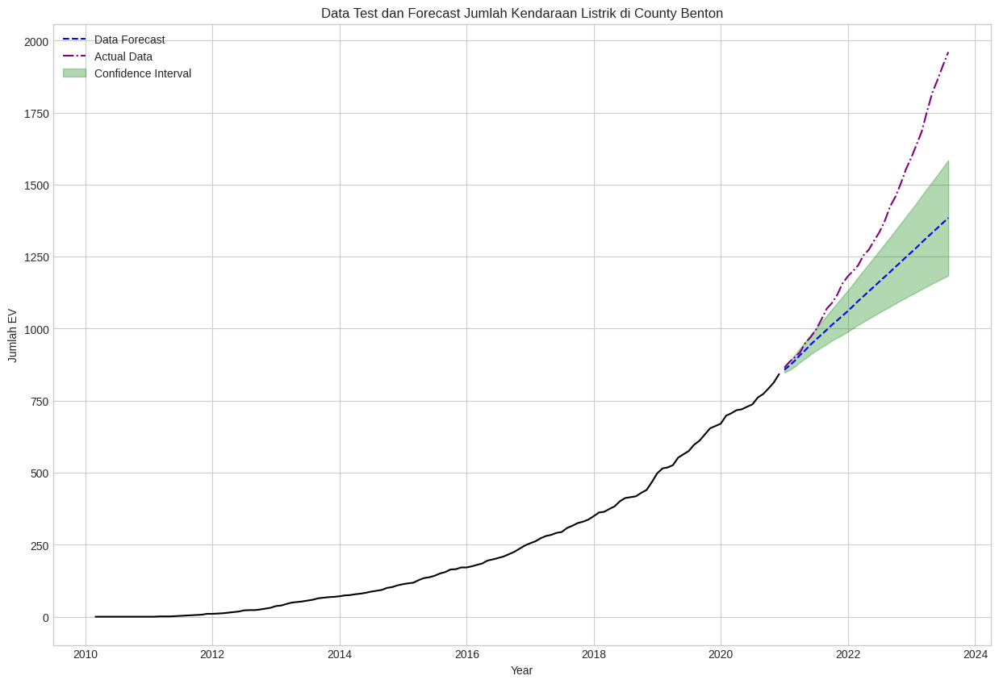


Mean Absolute Percentage Error: 0.129787488439577

Mean Squared Error: 68820.2024701758

Root Mean Squared Error: 262.33604874316416

R-squared: 0.3415714888650684


In [ ]:
df_benton_forecast = get_forecast(model, train_benton, test_benton, 'Benton', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_benton, test_benton = train_test_split_ts(benton, 0.80, 0.20)

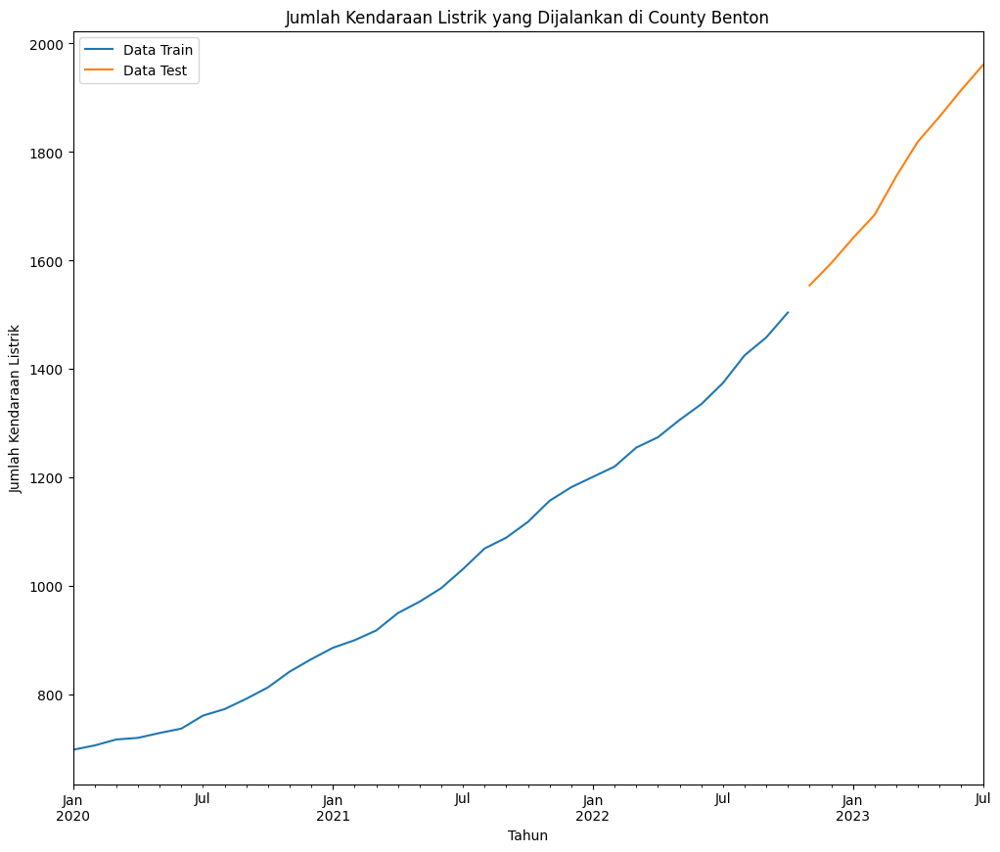

In [ ]:
plot_train_test_split(train_benton, test_benton, 'Benton')

In [ ]:
auto_model = pm.auto_arima(train_benton, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   34
Model:             SARIMAX(0, 1, 2)x(1, 1, [], 12)   Log Likelihood                 -71.425
Date:                             Fri, 25 Aug 2023   AIC                            152.849
Time:                                     20:07:52   BIC                            158.072
Sample:                                 01-31-2020   HQIC                           153.983
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     18.5141      2.905      6.372      0.000      12.820      24.209
ma.L1         -0.5630      0.241     -2.334      0.020      -1.036      -0.090
ma.L2          0.6789      0.250      2.717      0.007       0.189       1.169
ar.S.L12      -0.7704      0.149     -5.169      0.000      -1.063      -0.478
sigma2        29.7320     14.329      2.075      0.038       1.649      57.815
===================================================================================
Ljung-Box (L1) (Q):                   1.40   Jarque-Bera (JB):                 2.04
Prob(Q):                              0.24   Prob(JB):                         0.36
Heteroskedasticity (H):               0.85   Skew:                             0.71
Prob(H) (two-sided):                  0.84   Kurtosis:                         2.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
model = SARIMAX(train_benton, order = (0, 1, 2), seasonal_order = (1, 1, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   34
Model:             SARIMAX(0, 1, 2)x(1, 1, [], 12)   Log Likelihood                 -33.788
Date:                             Fri, 25 Aug 2023   AIC                             75.576
Time:                                     20:06:19   BIC                             76.364
Sample:                                 01-31-2020   HQIC                            73.873
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3273      0.362     -0.903      0.366      -1.038       0.383
ma.L2          1.0000      0.965      1.036      0.300      -0.891       2.891
ar.S.L12      -0.0370      0.245     -0.151      0.880      -0.517       0.443
sigma2        78.2486      0.013   6181.742      0.000      78.224      78.273
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                 0.69
Prob(Q):                              0.74   Prob(JB):                         0.71
Heteroskedasticity (H):               0.83   Skew:                            -0.63
Prob(H) (two-sided):                  0.88   Kurtosis:                         2.50
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.07e+19. Standard errors may be unstable.
"""

ValueError: ignored

<Figure size 1200x1000 with 0 Axes>

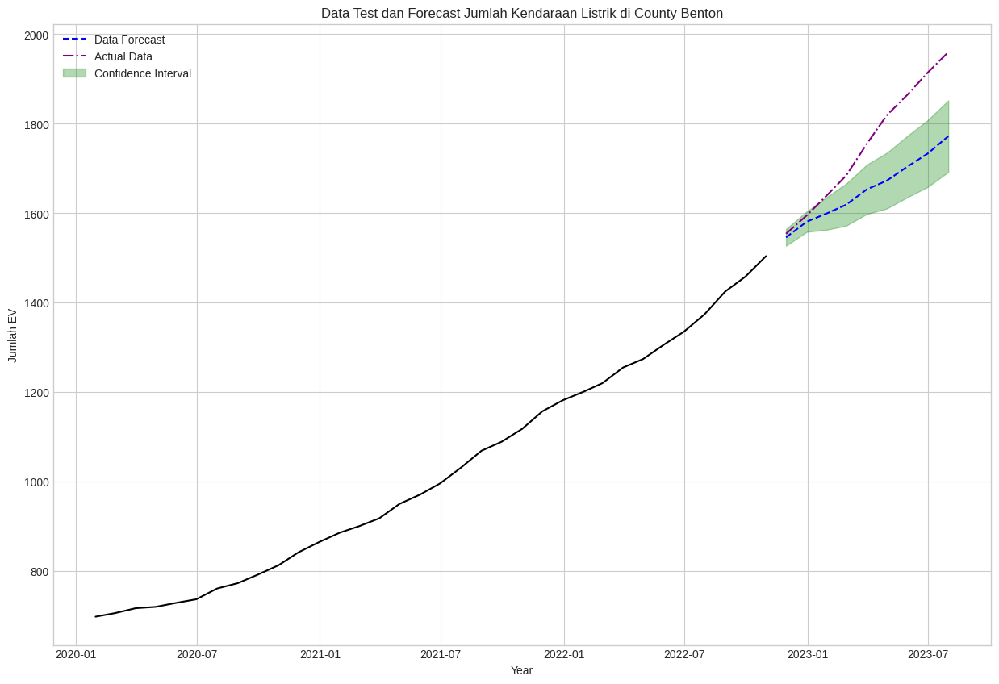


Mean Absolute Percentage Error: 0.054728085423617165

Mean Squared Error: 14640.58984235711

Root Mean Squared Error: 120.99830512183676

R-squared: 0.2134958726306968


In [ ]:
df_benton_forecast = get_forecast(model, train_benton, test_benton, 'Benton', plot = True)

### **Prediksi Masa Depan** ###

In [ ]:
model = SARIMAX(benton, order = (0, 1, 2), seasonal_order = (1, 1, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   43
Model:             SARIMAX(0, 1, 2)x(1, 1, [], 12)   Log Likelihood                 -71.941
Date:                             Fri, 25 Aug 2023   AIC                            151.881
Time:                                     20:08:09   BIC                            155.443
Sample:                                 01-31-2020   HQIC                           152.372
                                      - 07-31-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6050      0.258      2.345      0.019       0.099       1.111
ma.L2          0.7055      0.402      1.756      0.079      -0.082       1.493
ar.S.L12      -0.4335      0.283     -1.533      0.125      -0.988       0.121
sigma2       158.9824     93.633      1.698      0.090     -24.535     342.500
===================================================================================
Ljung-Box (L1) (Q):                   2.14   Jarque-Bera (JB):                 0.50
Prob(Q):                              0.14   Prob(JB):                         0.78
Heteroskedasticity (H):               2.38   Skew:                            -0.39
Prob(H) (two-sided):                  0.32   Kurtosis:                         2.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

ValueError: ignored

<Figure size 1200x1000 with 0 Axes>

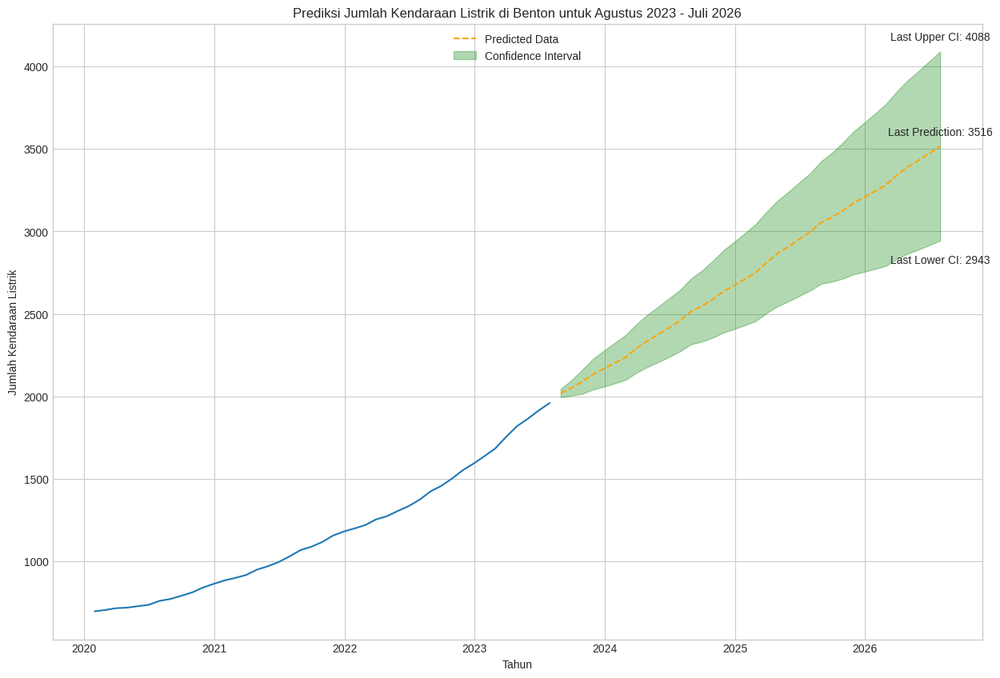

In [ ]:
df_benton_preds = get_prediction(model, benton['Jumlah EV'], test_benton, 'Benton', plot = True)

In [ ]:
county_information['Benton']['Predictions'] = df_benton_preds

## ***County* Island**

### **Inisialisasi Dataset** ###

In [ ]:
county_dfs['Island']

,Jumlah EV
DOL Transaction Date,
2010-02-28,0.0
2010-03-31,0.0
2010-04-30,0.0
2010-05-31,0.0
2010-06-30,0.0
...,...
2023-03-31,1476.0
2023-04-30,1510.0
2023-05-31,1546.0


In [ ]:
island = county_dfs['Island'].copy()
island.reset_index(inplace=True)
mask = island['DOL Transaction Date'] >= '2020-01-31'
island = island[mask]

island.set_index('DOL Transaction Date', inplace = True)

In [ ]:
train_island, test_island = train_test_split_ts(county_information['Island']['df'], 0.80, 0.20)

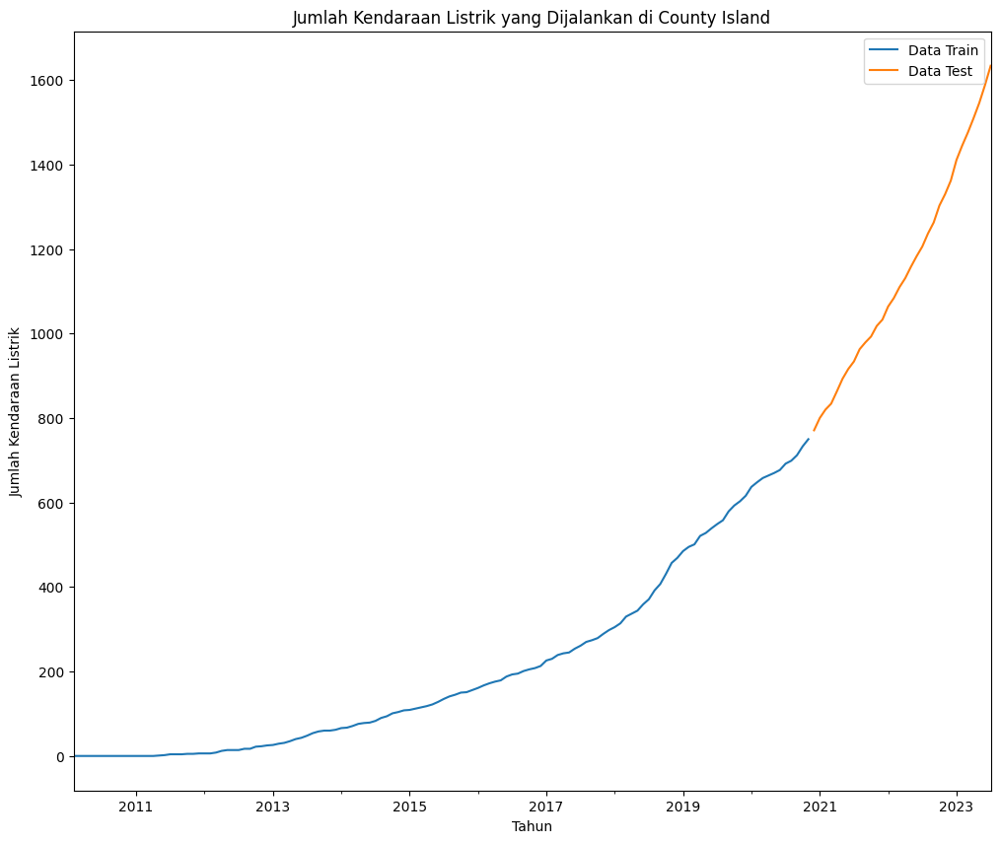

In [ ]:
plot_train_test_split(train_island, test_island, 'Island')

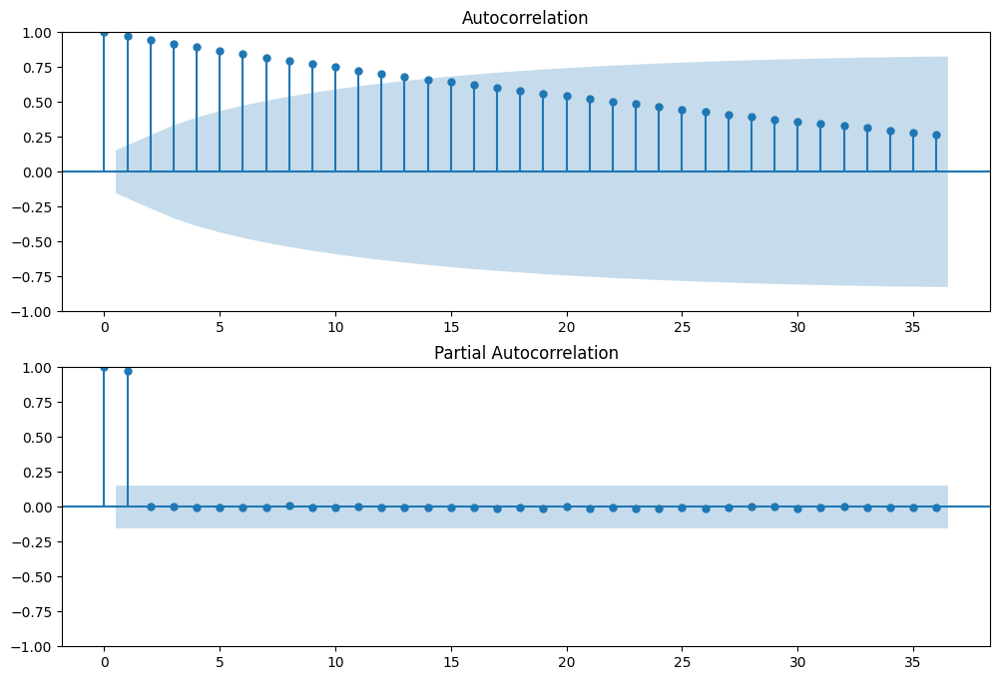

In [ ]:
fig = plt.figure(figsize = (12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(county_information['Island']['df'], lags = 36, ax = ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(county_information['Island']['df'], lags = 36, ax = ax2)

In [ ]:
auto_model = pm.auto_arima(train_island, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  130
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -344.158
Date:                Fri, 25 Aug 2023   AIC                            692.317
Time:                        09:55:34   BIC                            698.021
Sample:                    02-28-2010   HQIC                           694.634
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7197      0.039    -18.575      0.000      -0.796      -0.644
sigma2        12.6025      1.180     10.676      0.000      10.289      14.916
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                18.07
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):              17.23   Skew:                             0.60
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Jumlah EV   No. Observations:                  130
Model:               SARIMAX(0, 2, 1)   Log Likelihood                -339.487
Date:                Fri, 25 Aug 2023   AIC                            682.973
Time:                        20:09:01   BIC                            688.646
Sample:                    02-28-2010   HQIC                           685.278
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7250      0.039    -18.653      0.000      -0.801      -0.649
sigma2        12.8014      1.221     10.484      0.000      10.408      15.194
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                16.76
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):              14.48   Skew:                             0.60
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

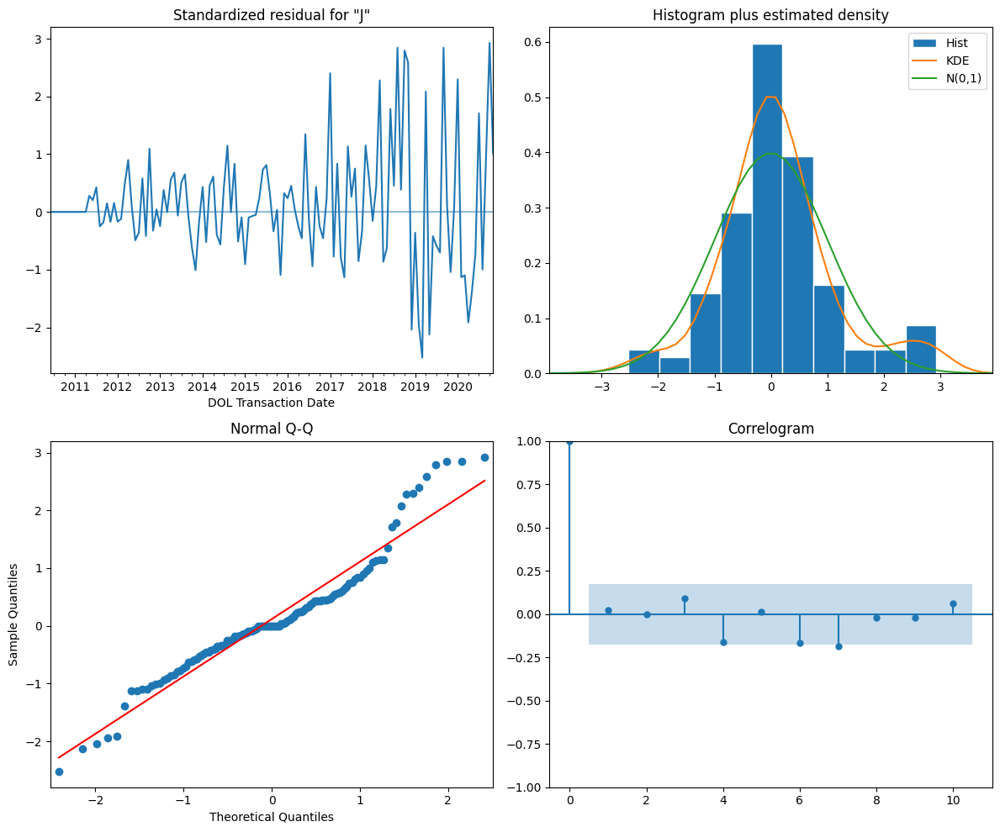

In [ ]:
model = SARIMAX(train_island, order = (0, 2, 1),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

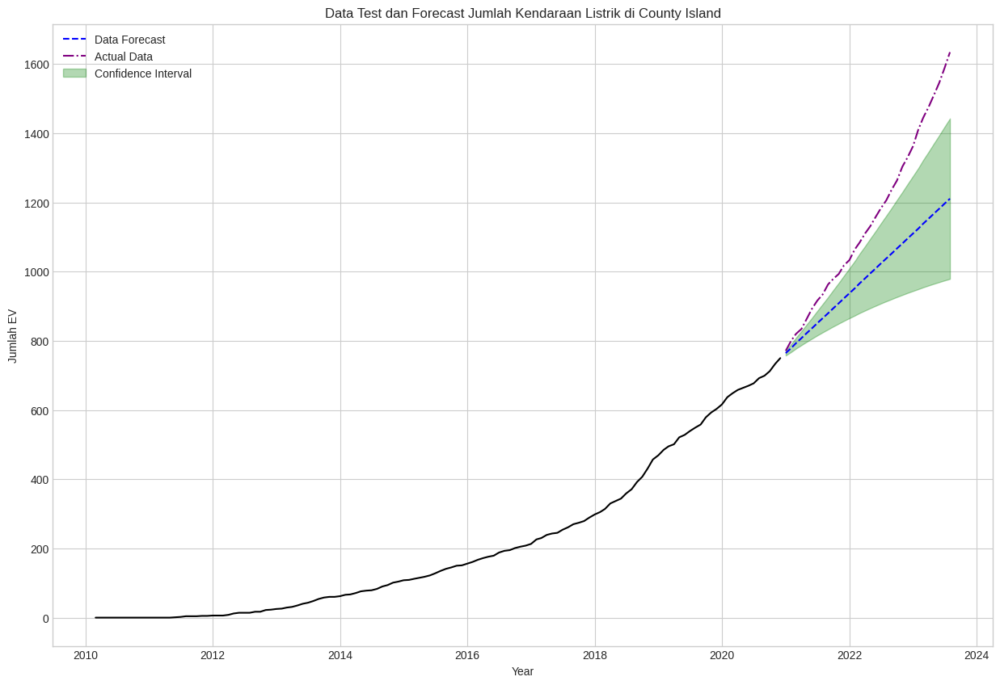


Mean Absolute Percentage Error: 0.12794473089930986

Mean Squared Error: 40528.2565204465

Root Mean Squared Error: 201.3163096235536

R-squared: 0.3375113765581427


In [ ]:
df_island_forecast = get_forecast(model, train_island, test_island, 'Island', plot = True)

### **Menggunakan Data dari Tahun 2020 Saja** ###

In [ ]:
train_island, test_island = train_test_split_ts(island, 0.80, 0.20)

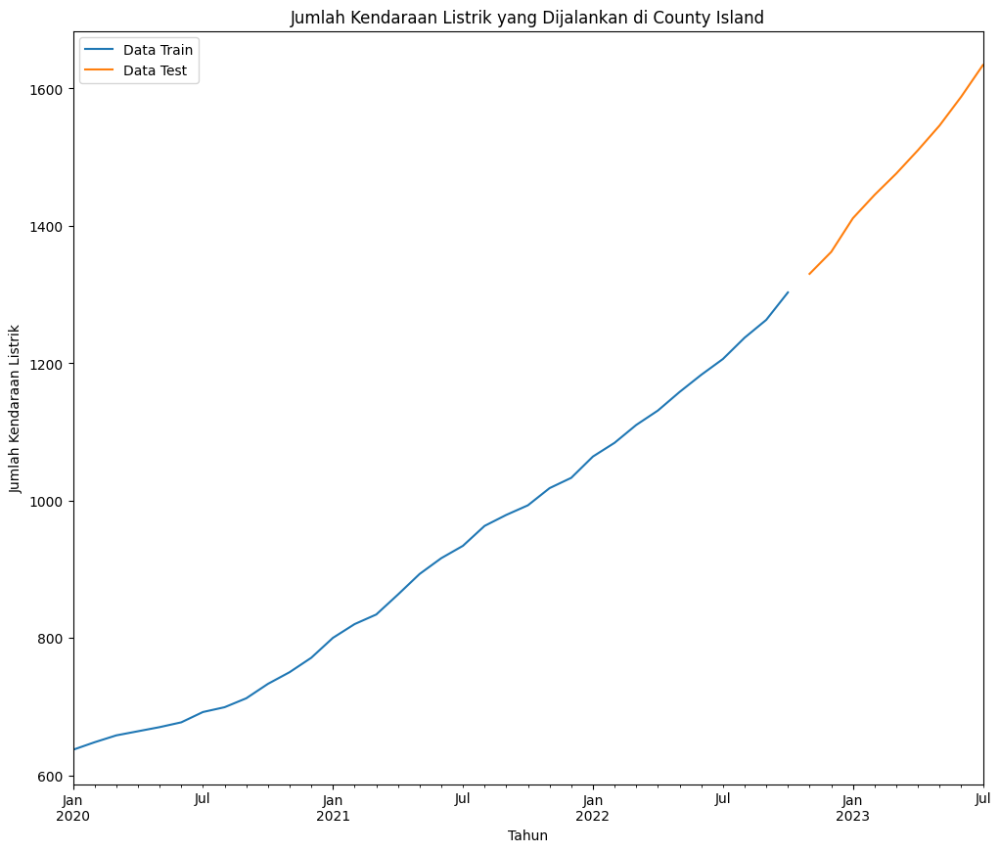

In [ ]:
plot_train_test_split(train_island, test_island, 'Island')

In [ ]:
auto_model = pm.auto_arima(train_island, start_p = 0, start_d = 0, start_q = 0, max_p = 4,
                           max_d = 3, max_q = 4, start_P = 0, start_D = 0, start_Q = 0, max_P = 3,
                           max_D = 3, max_Q = 3, m = 12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   34
Model:             SARIMAX(0, 2, 2)x(1, 0, [], 12)   Log Likelihood                -101.788
Date:                             Fri, 25 Aug 2023   AIC                            213.576
Time:                                     09:55:53   BIC                            220.904
Sample:                                 01-31-2020   HQIC                           216.005
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.9127      0.429      2.126      0.033       0.071       1.754
ma.L1         -0.9783      0.312     -3.137      0.002      -1.590      -0.367
ma.L2          0.2920      0.297      0.984      0.325      -0.289       0.873
ar.S.L12      -0.3362      0.167     -2.010      0.044      -0.664      -0.008
sigma2        31.3874     11.144      2.817      0.005       9.546      53.228
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.79
Prob(Q):                              0.98   Prob(JB):                         0.67
Heteroskedasticity (H):               1.15   Skew:                             0.22
Prob(H) (two-sided):                  0.82   Kurtosis:                         2.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   34
Model:             SARIMAX(0, 2, 2)x(1, 0, [], 12)   Log Likelihood                 -65.749
Date:                             Fri, 25 Aug 2023   AIC                            139.499
Time:                                     20:09:54   BIC                            143.482
Sample:                                 01-31-2020   HQIC                           140.276
                                      - 10-31-2022                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9803      0.462     -2.121      0.034      -1.886      -0.074
ma.L2          0.3091      0.332      0.932      0.351      -0.341       0.959
ar.S.L12      -0.2954      0.186     -1.588      0.112      -0.660       0.069
sigma2        39.9056     15.000      2.660      0.008      10.506      69.305
===================================================================================
Ljung-Box (L1) (Q):                   0.53   Jarque-Bera (JB):                 0.84
Prob(Q):                              0.47   Prob(JB):                         0.66
Heteroskedasticity (H):               0.78   Skew:                             0.36
Prob(H) (two-sided):                  0.75   Kurtosis:                         2.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

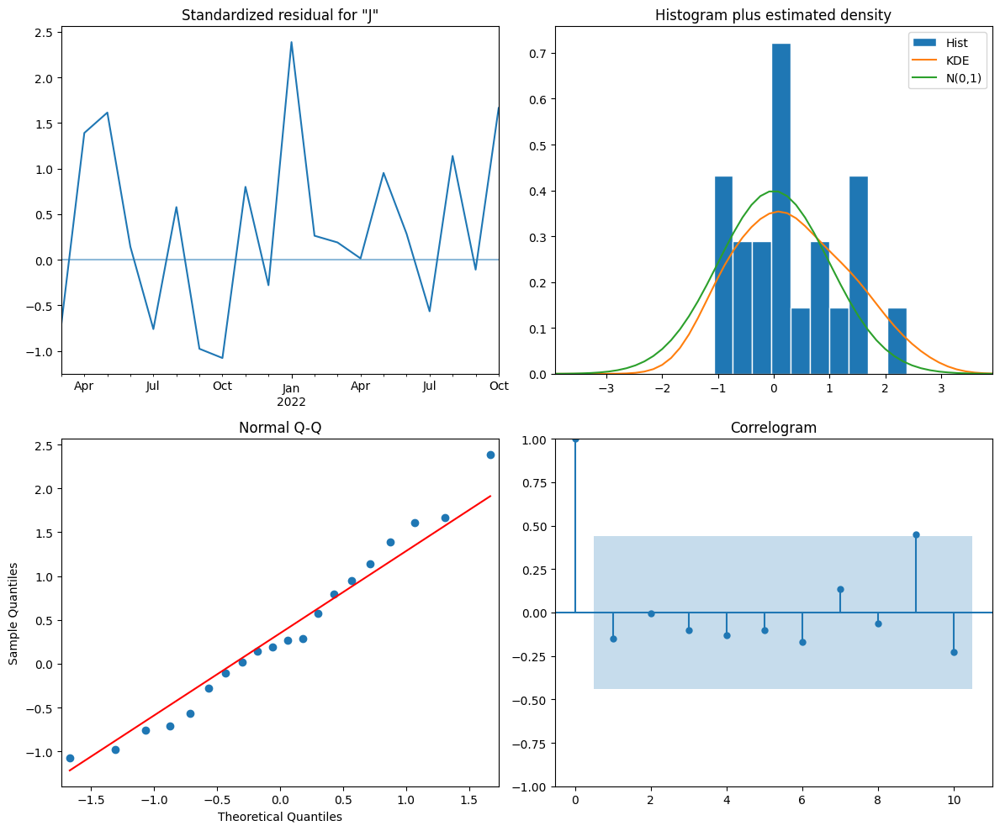

In [ ]:
model = SARIMAX(train_island, order = (0, 2, 2), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

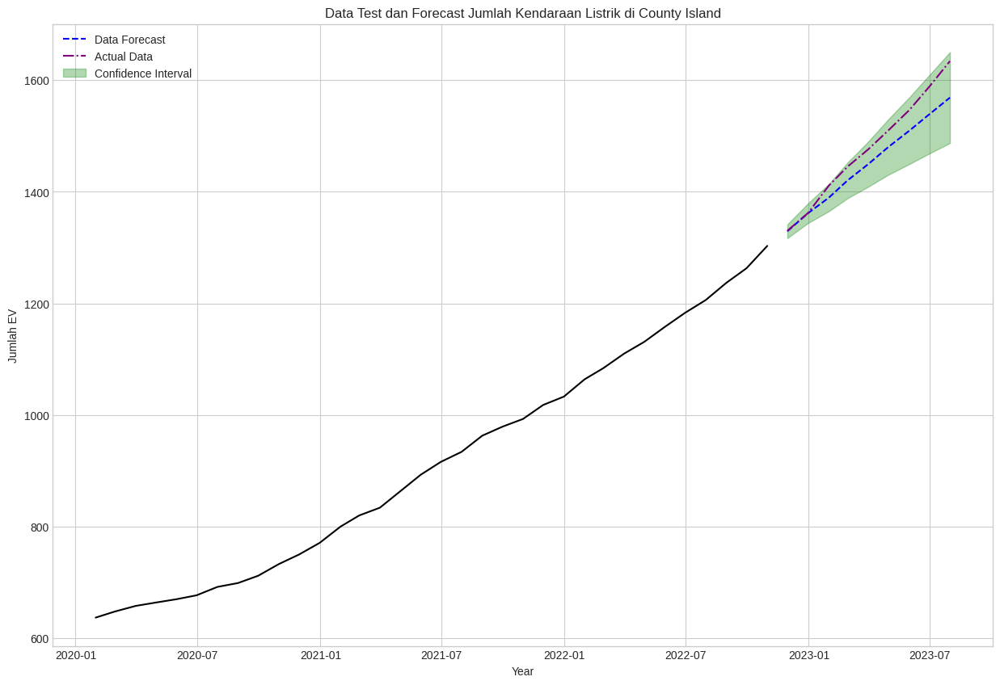


Mean Absolute Percentage Error: 0.018433867571239253

Mean Squared Error: 1193.9563958647745

Root Mean Squared Error: 34.5536741297474

R-squared: 0.8705753912896808


In [ ]:
df_island_forecast = get_forecast(model, train_island, test_island, 'Island', plot = True)

### **Prediksi Masa Depan** ###

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency M will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                           Jumlah EV   No. Observations:                   43
Model:             SARIMAX(0, 2, 2)x(1, 0, [], 12)   Log Likelihood                 -97.525
Date:                             Fri, 25 Aug 2023   AIC                            203.050
Time:                                     20:11:27   BIC                            208.519
Sample:                                 01-31-2020   HQIC                           204.763
                                      - 07-31-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9069      0.327     -2.776      0.006      -1.547      -0.267
ma.L2          0.2385      0.254      0.940      0.347      -0.259       0.736
ar.S.L12       0.0012      0.019      0.062      0.951      -0.036       0.038
sigma2        48.6983     14.941      3.259      0.001      19.414      77.983
===================================================================================
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                 0.51
Prob(Q):                              0.75   Prob(JB):                         0.78
Heteroskedasticity (H):               1.50   Skew:                             0.30
Prob(H) (two-sided):                  0.54   Kurtosis:                         2.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

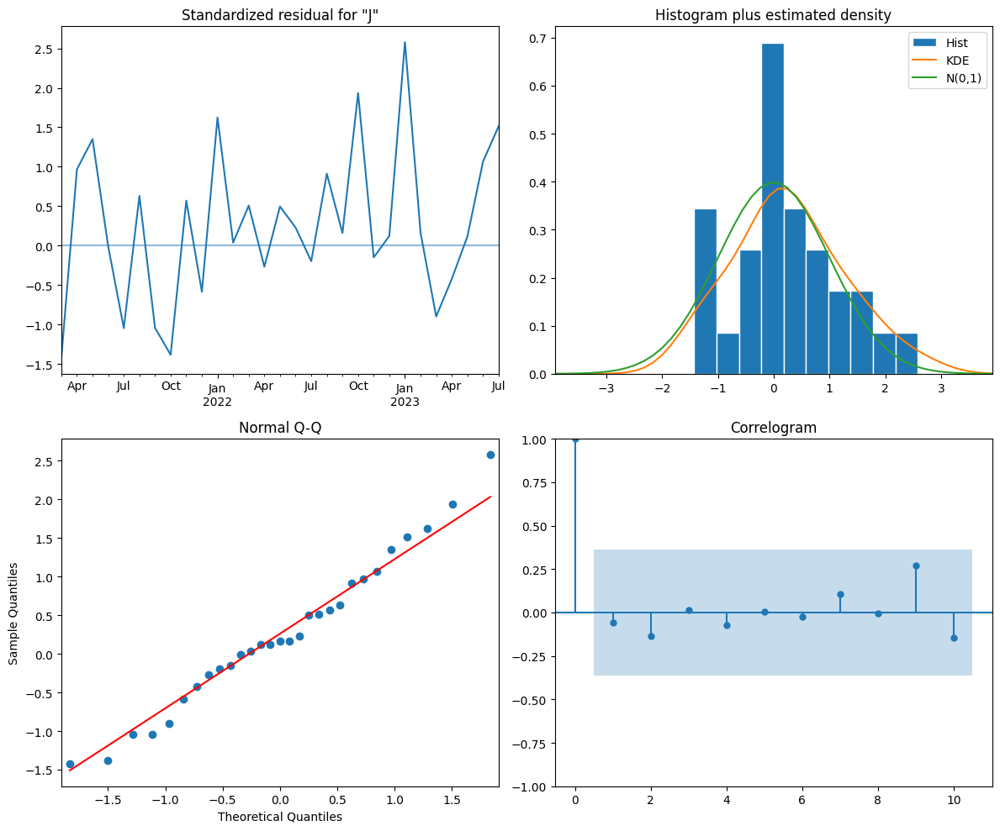

In [ ]:
model = SARIMAX(island, order = (0, 2, 2), seasonal_order = (1, 0, 0, 12),
                enforce_invertibility = False, enforce_stationarity = False).fit()
evaluate_model(model)

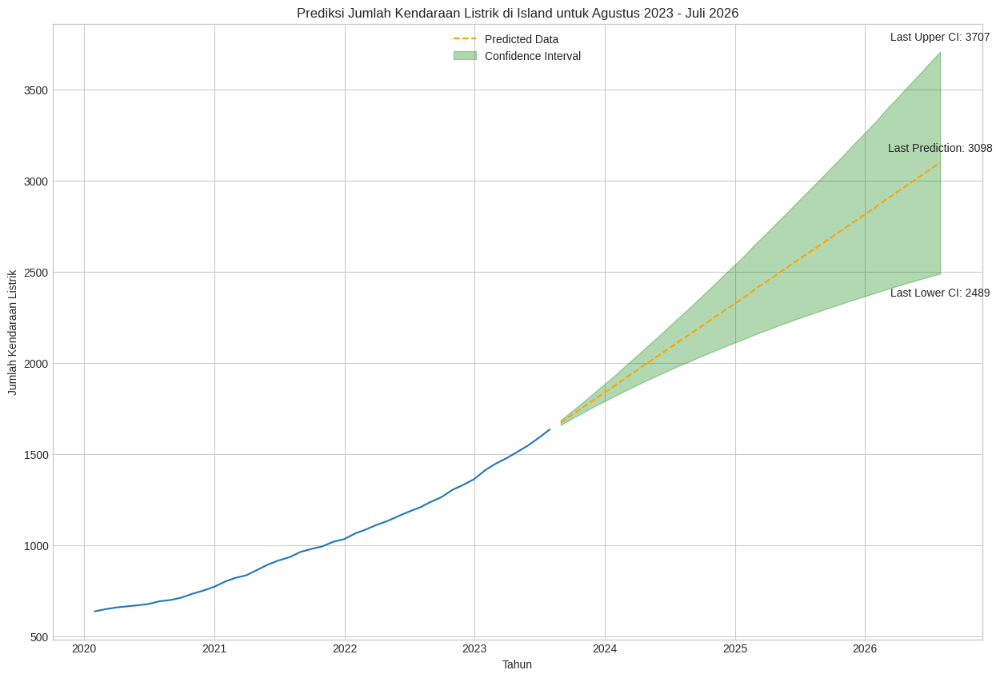

In [ ]:
df_island_preds = get_prediction(model, island['Jumlah EV'], test_island, 'Island', plot = True)

In [ ]:
county_information['Island']['Predictions'] = df_island_preds

# **Penyimpanan Data**

In [ ]:
drop_kolom = ['Lower Confidence Interval',	'Upper Confidence Interval']
top_10_county = ['King', 'Snohomish', 'Pierce', 'Clark', 'Thurston', 'Kitsap', 'Spokane', 'Whatcom', 'Benton', 'Island']

df_pred = df_king_preds.drop(drop_kolom, axis=1)
df_pred.rename(columns = {'Predictions':'Jumlah EV - King'}, inplace = True)
df_pred.index.name = 'Date'
for x in top_10_county:
  if x == 'King':
    continue
  val = pd.DataFrame(county_information[x]['Predictions'])
  val = val.drop(drop_kolom, axis=1)
  val.rename(columns = {'Predictions':f'Jumlah EV - {x}'}, inplace = True)
  val.index.name = 'Date'
  df_pred = df_pred.merge(val, how='left', on='Date')
print(df_pred.head())

            Jumlah EV - King  Jumlah EV - Snohomish  Jumlah EV - Pierce  \
Date                                                                      
2023-08-31      98120.058756           19698.458325        19698.458325   
2023-09-30     100597.954185           20280.916760        20280.916760   
2023-10-31     103817.839452           21002.334011        21002.334011   
2023-11-30     106908.444803           21741.498820        21741.498820   
2023-12-31     109862.225571           22463.122958        22463.122958   

            Jumlah EV - Clark  Jumlah EV - Thurston  Jumlah EV - Kitsap  \
Date                                                                      
2023-08-31       10836.912025           5696.216578         5533.874362   
2023-09-30       11142.824050           5836.340754         5657.748723   
2023-10-31       11448.736075           5978.207120         5781.623085   
2023-11-30       11754.648100           6120.454294         5905.497447   
2023-12-31       12060.5

In [ ]:
top_10_county = ['King', 'Snohomish', 'Pierce', 'Clark', 'Thurston', 'Kitsap', 'Spokane', 'Whatcom', 'Benton', 'Island']
df_ori = pd.DataFrame(county_information['King']['df'])
df_ori.rename(columns = {'Jumlah EV':'Jumlah EV - King'}, inplace = True)
for x in top_10_county:
  if x == 'King':
    continue
  val = pd.DataFrame(county_information[x]['df'])
  val.rename(columns = {'Jumlah EV':f'Jumlah EV - {x}'}, inplace = True)
  df_ori = df_ori.merge(val, how='left', on='DOL Transaction Date')
print(df_ori.head())

                      Jumlah EV - King  Jumlah EV - Snohomish  \
DOL Transaction Date                                            
2010-02-28                         0.0                    0.0   
2010-03-31                         1.0                    0.0   
2010-04-30                         2.0                    0.0   
2010-05-31                         2.0                    1.0   
2010-06-30                         3.0                    1.0   

                      Jumlah EV - Pierce  Jumlah EV - Clark  \
DOL Transaction Date                                          
2010-02-28                           0.0                0.0   
2010-03-31                           0.0                1.0   
2010-04-30                           0.0                1.0   
2010-05-31                           0.0                1.0   
2010-06-30                           0.0                1.0   

                      Jumlah EV - Thurston  Jumlah EV - Kitsap  \
DOL Transaction Date                

In [ ]:
df_final = pd.concat([df_ori, df_pred])
print(df_final)

            Jumlah EV - King  Jumlah EV - Snohomish  Jumlah EV - Pierce  \
2010-02-28          0.000000               0.000000            0.000000   
2010-03-31          1.000000               0.000000            0.000000   
2010-04-30          2.000000               0.000000            0.000000   
2010-05-31          2.000000               1.000000            0.000000   
2010-06-30          3.000000               1.000000            0.000000   
...                      ...                    ...                 ...   
2026-03-31     208023.590423           50156.430199        50156.430199   
2026-04-30     212153.358888           51545.176451        51545.176451   
2026-05-31     216257.131839           52920.693961        52920.693961   
2026-06-30     220448.880262           54354.614909        54354.614909   
2026-07-31     224552.182515           55869.283575        55869.283575   

            Jumlah EV - Clark  Jumlah EV - Thurston  Jumlah EV - Kitsap  \
2010-02-28           0.0

In [ ]:
df_final = df_final.rename_axis('Date').reset_index()
df_final.head()

,Date,Jumlah EV - King,Jumlah EV - Snohomish,Jumlah EV - Pierce,Jumlah EV - Clark,Jumlah EV - Thurston,Jumlah EV - Kitsap,Jumlah EV - Spokane,Jumlah EV - Whatcom,Jumlah EV - Benton,Jumlah EV - Island
0,2010-02-28,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2010-03-31,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2010-04-30,2.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0
3,2010-05-31,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
4,2010-06-30,3.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0


In [ ]:
# Menyimpan df_cumsum untuk pembuatan dashboard
df_final.to_csv('jumlah_kendaraan_ori_dan_prediksi.csv', index = False)